In [1]:
import scanpy as sc
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from utils import preprocessing

# Preprocess Bican Data

Zoned

Spatial

In [2]:
msn_type_path_dict = {
    "eMSN_D1D2": {"path": "/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/STR_eMSN_D1D2_Matrix.qs", "zone_col": "Final_Zone_Assignments_No_Smooth", "donor_col": "donor", "x": "x_um2", "y": "y_um2"}, #gs://macosko_data/akraft/Zonal_Objects/
    "Patch_D1": {"path": "/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/STR_D1_Patch_MSN.qs", "zone_col": "Final_Zone_Assignments_No_Smooth", "donor_col": "donor", "x": "x_um2", "y": "y_um2"}, # gs://macosko_data/akraft/Zonal_Objects/
    "Patch_D2": {"path": "/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/STR_D2_Patch_MSN.qs", "zone_col": "Final_Zone_Assignments_No_Smooth", "donor_col": "donor", "x": "x_um2", "y": "y_um2"}, # gs://macosko_data/akraft/Zonal_Objects/
    "Matrix_D1": {"path": "/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/STR_D1_Matrix_MSN.qs", "zone_col": "D1_Matrix_Zone", "donor_col": "donor", "x": "x_position", "y": "y_position"},# gs://macosko_data/akraft/Human_Striatum_Slide-tags/High_Quality_by_Celltype/
    "Matrix_D2": {"path": "/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/STR_D2_Matrix_MSN.qs", "zone_col": "D2_Matrix_Zone", "donor_col": "donor", "x": "x_position", "y": "y_position"}, #gs://macosko_data/akraft/Human_Striatum_Slide-tags/High_Quality_by_Celltype/
}

In [4]:
for cell_type, infos in list(msn_type_path_dict.items())[1:3]:

    print(f"Processing {cell_type} ...")

    PATH_BASE   = "/home/gdallagl/myworkdir/XDP/data/_tmp"
    saving_path = f"/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/{cell_type}.h5ad"

    preprocessing.read_qs_save_files(infos["path"], PATH_BASE, assay="RNA")
    adata = preprocessing.build_h5ad_from_files(PATH_BASE, saving_path)

    # direct assignment avoids duplicate columns when "x"/"donor_id" already exist in metadata
    adata.obs["donor_id"] = adata.obs[infos["donor_col"]]
    adata.obs["x"]        = adata.obs[infos["x"]]
    adata.obs["y"]        = adata.obs[infos["y"]]
    adata.obs["zone"]     = adata.obs[infos["zone_col"]].astype("Int64").astype("category")

    adata = adata[
        adata.obs["x"].notna() &
        adata.obs["y"].notna() &
        adata.obs["zone"].notna() &
        adata.obs["donor_id"].notna()
        ].copy()

    adata.obsm["spatial"] = np.array([adata.obs["x"], adata.obs["y"]]).T
    adata.obs["ct_for_deg"] = cell_type

    print(adata)
    print(adata.obs["donor_id"].value_counts())

    adata.write_h5ad(saving_path)

    #break


Processing Patch_D1 ...


R callback write-console: Loading required package: SeuratObject
  
R callback write-console: Loading required package: sp
  
R callback write-console: 
Attaching package: ‘SeuratObject’

  
R callback write-console: The following objects are masked from ‘package:base’:

    %||%, intersect, t

  



    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    

R callback write-console: 
Attaching package: ‘Seurat’

  
R callback write-console: The following object is masked from ‘package:base’:

    %||%

  
R callback write-console: qs 0.27.3. Announcement: https://github.com/qsbase/qs/issues/103
  


Seurat version: 5.4.0 
Detected Seurat v5 assay


/home/gdallagl/myworkdir/XDP/utils/preprocessing.py:148: DtypeWarning: Columns (94,96,97,98,109,111,118,120,121,122,133,135) have mixed types. Specify dtype option on import or set low_memory=False.
  metadata = pd.read_csv(f"{PATH_BASE}/metadata.csv", index_col=0)


AnnData object with n_obs × n_vars = 9361 × 37905
    obs: 'orig.ident', 'nCount_originalexp', 'nFeature_originalexp', 'PREFIX', 'CELL_BARCODE', 'NUM_GENIC_READS', 'NUM_TRANSCRIPTS', 'NUM_GENES', 'num_retained_transcripts', 'pct_coding', 'pct_utr', 'pct_intergenic', 'pct_genic', 'pct_intronic', 'pct_mt', 'pct_ribosomal', 'frac_contamination', 'experiment', 'donor_external_id', 'is_primary_data', 'Neighborhood_label', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Class_label', 'Class_name', 'Class_bootstrapping_probability', 'Subclass_label', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Group_label', 'Group_name', 'Group_bootstrapping_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'donor_id', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'x', 'y', 'RNA_snn_res.0.8', 'seurat_clusters', 'library', 'donor', 'x_um2', 'y_um2', 'unique_cell_ID', 'AK_celltype', 'RNA_snn_res.0.2', 'cb', 'clusters', 'num_dbscan', 'log

/home/gdallagl/myworkdir/XDP/utils/preprocessing.py:148: DtypeWarning: Columns (94,96,97,98,109,111,118,120,121,122,133,135) have mixed types. Specify dtype option on import or set low_memory=False.
  metadata = pd.read_csv(f"{PATH_BASE}/metadata.csv", index_col=0)


AnnData object with n_obs × n_vars = 7827 × 37905
    obs: 'orig.ident', 'nCount_originalexp', 'nFeature_originalexp', 'PREFIX', 'CELL_BARCODE', 'NUM_GENIC_READS', 'NUM_TRANSCRIPTS', 'NUM_GENES', 'num_retained_transcripts', 'pct_coding', 'pct_utr', 'pct_intergenic', 'pct_genic', 'pct_intronic', 'pct_mt', 'pct_ribosomal', 'frac_contamination', 'experiment', 'donor_external_id', 'is_primary_data', 'Neighborhood_label', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Class_label', 'Class_name', 'Class_bootstrapping_probability', 'Subclass_label', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Group_label', 'Group_name', 'Group_bootstrapping_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'donor_id', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'x', 'y', 'RNA_snn_res.0.8', 'seurat_clusters', 'library', 'donor', 'x_um2', 'y_um2', 'unique_cell_ID', 'AK_celltype', 'RNA_snn_res.0.2', 'cb', 'clusters', 'num_dbscan', 'log

### Read XDP spatial data tooo

In [77]:
import scanpy as sc
xdp_adata = sc.read_h5ad("/home/gdallagl/myworkdir/XDP/data/XDP/SlideTags_dataset/all_lib_adata_zoned_ct-cured_aligned.h5ad", backed="r")

In [177]:
xdp_adata_sub.obs["region"].value_counts()

region
healthy    6405
dead        901
Name: count, dtype: int64

In [180]:
xdp_adata_sub = xdp_adata[
    (xdp_adata.obs["ct_for_deg"].isin(["Matrix_D1", "Matrix_D2", "Patch_D1", "Patch_D2", "eMSN_D1D2"])) &
    (xdp_adata.obs["sample"].isin(["sample_02"])) &
    #(xdp_adata.obs["puck"].isin(["puck1"])) & --> thes hsodul be alsinged
    (xdp_adata.obs["x"].notna() & xdp_adata.obs["y"].notna())
].to_memory().copy()

# collapse D1/D2 into the same 3 groups used for the healthy donors
xdp_adata_sub.obs["ct"] = xdp_adata_sub.obs["ct_for_deg"].map({
    "Matrix_D1": "Matrix", "Matrix_D2": "Matrix",
    "Patch_D1": "Patch",  "Patch_D2": "Patch",
    "eMSN_D1D2": "eMSN_D1D2",
})

# add zone
xdp_adata_sub.obs["zone"] = np.where(
    xdp_adata_sub.obs["ct"].isin(["Matrix"]), xdp_adata_sub.obs["zone"],  xdp_adata_sub.obs["zone_4"]
)

# change x,v to be roetate
xdp_adata_sub.obs[["x", "y"]] = xdp_adata_sub.obsm["spatial"].copy()

# drop cells withou spatial
xdp_adata_sub = xdp_adata_sub[xdp_adata_sub.obs["x"].notna() & xdp_adata_sub.obs["y"].notna()].copy()

# chanhe gene name
xdp_adata_sub.var_names = xdp_adata_sub.var["gene_symbol"].copy()
xdp_adata_sub.var_names = xdp_adata_sub.var_names.astype(str)
xdp_adata_sub.var_names_make_unique()

# remvoe cells on dead region (not d1d2) as trancprome totally differt?
xdp_adata_sub = xdp_adata_sub[
    (xdp_adata_sub.obs["ct"].isin(["Matrix", "Patch"]) & (xdp_adata_sub.obs["region"] == "healthy")) |
    (xdp_adata_sub.obs["ct"].isin(["eMSN_D1D2"]))
]

print(xdp_adata_sub)
print(xdp_adata_sub.obs["donor_id"].value_counts())
print(xdp_adata_sub.obs["puck"].value_counts())

View of AnnData object with n_obs × n_vars = 6591 × 37464
    obs: 'x', 'y', 'pct_intronic', 'dbscan_clusters', 'dbscan_score', 'has_spatial', 'sample', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Neighborhood_aggregate_probability', 'Class_name', 'Class_bootstrapping_probability', 'Class_aggregate_probability', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Subclass_aggregate_probability', 'Group_name', 'Group_bootstrapping_probability', 'Group_aggregate_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'library_id', 'donor_number', 'donor_id', 'condition', 'sex', 'age_at_onset', 'age_at_death', 'bcl', 'library', 'Sorted', 'mapping_coupling_for_zoning', 'zone', 'zone_probability', 'mapping_coupling_for_zoning_4_zones', 'zone_4', 'zone_4_probability', 'leiden_0.1

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:865: UserWarning:


AnnData expects .var.index to contain strings, but got values like:
    ['DDX11L2', 'MIR1302-2HG', 'ENSG00000290826', 'OR4F5', 'ENSG00000238009']

    Inferred to be: categorical




# *) How to draw splines

1. make csv files with cell barcodes as index and x,y columns
2. move to R, follow the instructions here to draw spline and save results https://docs.google.com/document/d/181SnwQdWJkku2wrG-MGyENsZnDij3jbw9V1BOhs_IY4/edit?tab=t.0


# Create a merged obj with D1D2, Matrix and Striosome

In [121]:
d1d2 = sc.read_h5ad('/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/eMSN_D1D2.h5ad')

d1d2_samples = d1d2.obs["donor_id"].unique().tolist()

processed = []
for cell_type, infos in list(msn_type_path_dict.items())[:]:

    print(cell_type)

    if cell_type == "eMSN_D1D2":
        processed.append(d1d2)
    else:
        adata = sc.read_h5ad(f'/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/{cell_type}.h5ad', backed='r')
        print(adata)
        print(adata.obs["donor_id"].value_counts())
        adata = adata[adata.obs["donor_id"].isin(d1d2_samples), :].to_memory().copy()  # keep only donors that are in eMSN_D1D2

        processed.append(adata)

# concat
adata = sc.concat(processed)
adata.obs_names_make_unique()
adata.obs["ct"] = adata.obs["ct_for_deg"].map({
    "eMSN_D1D2": "eMSN_D1D2", "Matrix_D1": "Matrix", "Matrix_D2": "Matrix",
    "Patch_D1": "Patch", "Patch_D2": "Patch"
})

adata.layers["counts"] = adata.X.copy()  # store raw counts in a separate layer


eMSN_D1D2
Patch_D1
AnnData object with n_obs × n_vars = 9361 × 37905 backed at '/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/Patch_D1.h5ad'
    obs: 'orig.ident', 'nCount_originalexp', 'nFeature_originalexp', 'PREFIX', 'CELL_BARCODE', 'NUM_GENIC_READS', 'NUM_TRANSCRIPTS', 'NUM_GENES', 'num_retained_transcripts', 'pct_coding', 'pct_utr', 'pct_intergenic', 'pct_genic', 'pct_intronic', 'pct_mt', 'pct_ribosomal', 'frac_contamination', 'experiment', 'donor_external_id', 'is_primary_data', 'Neighborhood_label', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Class_label', 'Class_name', 'Class_bootstrapping_probability', 'Subclass_label', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Group_label', 'Group_name', 'Group_bootstrapping_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'donor_id', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'x', 'y', 'RNA_snn_res.0.8', 'seurat_clusters', 'library', 'donor',

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


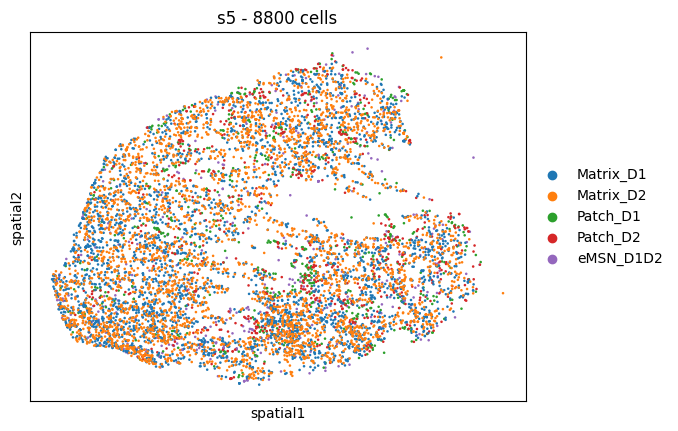

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


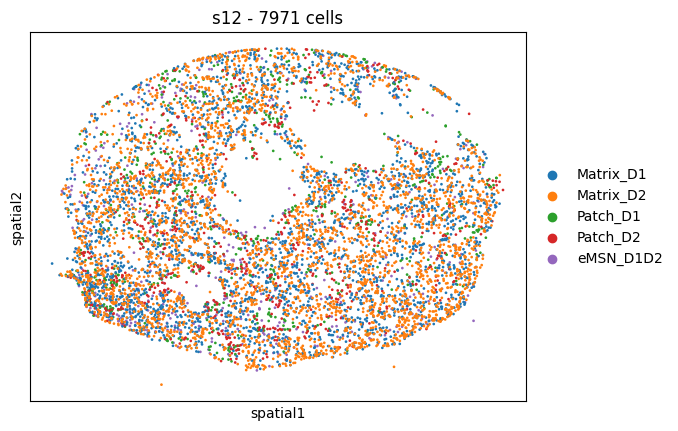

In [4]:
for s in adata.obs["donor_id"].unique()[:2]:
    sc.pl.embedding(adata[adata.obs["donor_id"] == s], basis="spatial", color=["ct_for_deg"], title=f"{s} - {adata[adata.obs['donor_id'] == s].shape[0]} cells")
    #break

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.



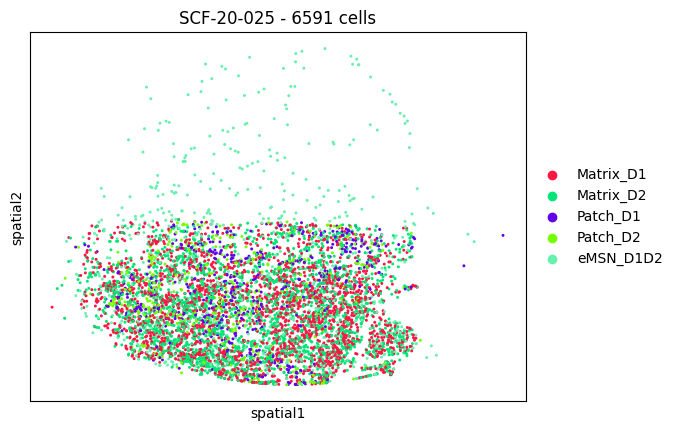

In [181]:
for s in xdp_adata_sub.obs["donor_id"].unique()[:2]:
    sc.pl.embedding(xdp_adata_sub[xdp_adata_sub.obs["donor_id"] == s], basis="spatial", color=["ct_for_deg"], title=f"{s} - {xdp_adata_sub[xdp_adata_sub.obs['donor_id'] == s].shape[0]} cells")
    #break

# Write Files with coordinates

In [184]:
path = '/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/for_splines'
os.makedirs(path, exist_ok=True)

for a in [adata, xdp_adata_sub]:
    print(a)
    for s in a.obs["donor_id"].unique():

        obs = a[a.obs["donor_id"] == s].obs[["x", "y"]].copy()
        #obs = obs[["x", "y"]].dropna().copy() # dine it before

        #display(obs)

        obs.to_csv(os.path.join(path, f"{s}_x_y.csv"), index=True)
        #break


AnnData object with n_obs × n_vars = 118710 × 37905
    obs: 'pct_coding', 'pct_utr', 'pct_intergenic', 'pct_genic', 'pct_intronic', 'pct_mt', 'pct_ribosomal', 'frac_contamination', 'experiment', 'Neighborhood_label', 'Neighborhood_name', 'Class_label', 'Class_name', 'Subclass_label', 'Subclass_name', 'Group_label', 'Group_name', 'donor_id', 'nCount_RNA', 'nFeature_RNA', 'x', 'y', 'library', 'unique_cell_ID', 'zone', 'ct_for_deg', 'ct', 'r', 'd', 'r_original', 'region', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    obsm: 'spatial'
    layers: 'counts'
AnnData object with n_obs × n_vars = 6591 × 37464
    obs: 'x', 'y', 'pct_intronic', 'dbscan_clusters', 'dbscan_score', 'has_spatial', 'sample', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Neighborhood_aggregate_probability', 'Class_name', 'Class_bootstrapping_probability', 'Class_aggregate_probabili

# Move things to R and draw spline 

One Sample at a time

Here we reprot matrix zones to facility the drawing of splines

- df <- read.csv("yourfile.csv", row.names = 1)  # must have x, y columns
- spl <- anno_spline(df)
- result <- xy2dr(df, spl)
- write.csv(result, "df.csv")

```R
process_sample <- function(s) {
  base <- sprintf("~/Downloads/samples_xdp/s%s_x_y", s)
  df     <- read.csv(paste0(base, ".csv"), row.names = 1)
  spl    <- anno_spline(df)
  result <- xy2dr(df, spl)
  write.csv(result, paste0(base, "_with_splines.csv"))
  invisible(result)
}
```

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.



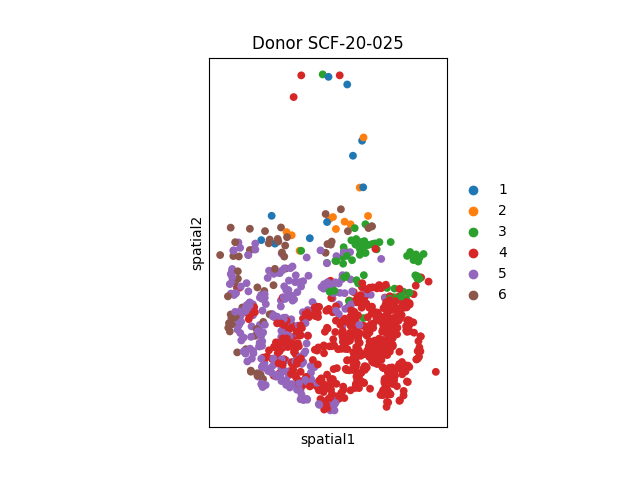

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.

/home/gdal

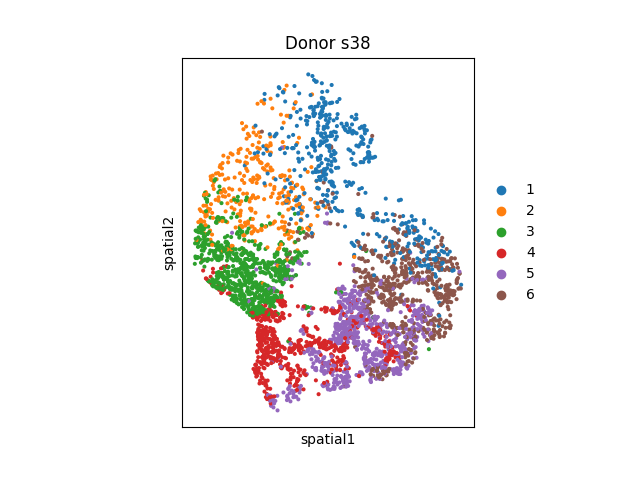

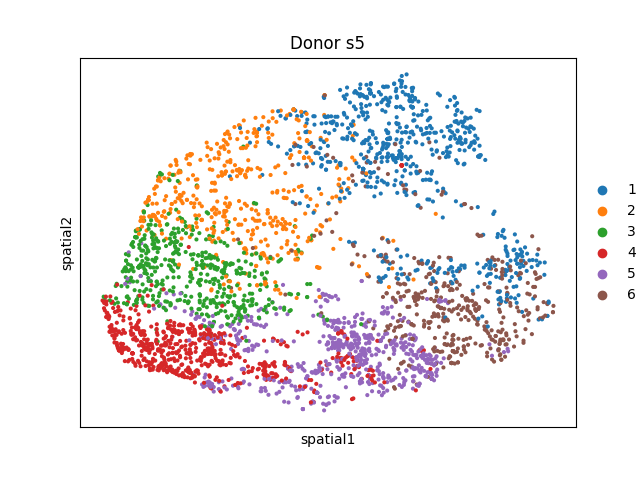

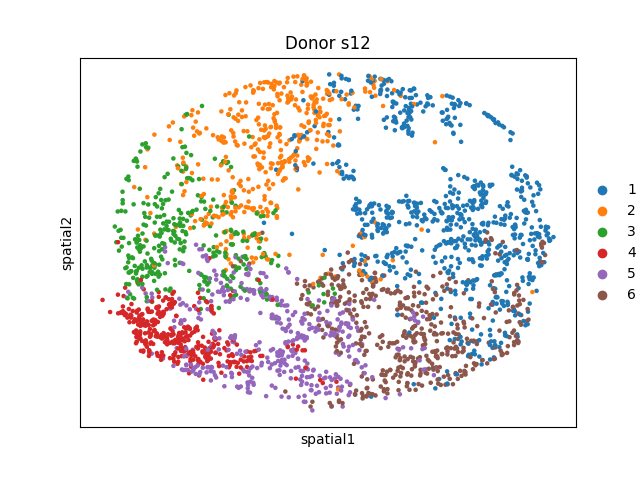

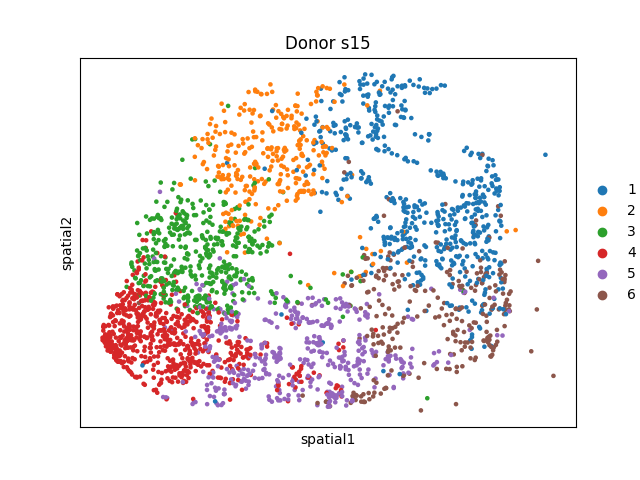

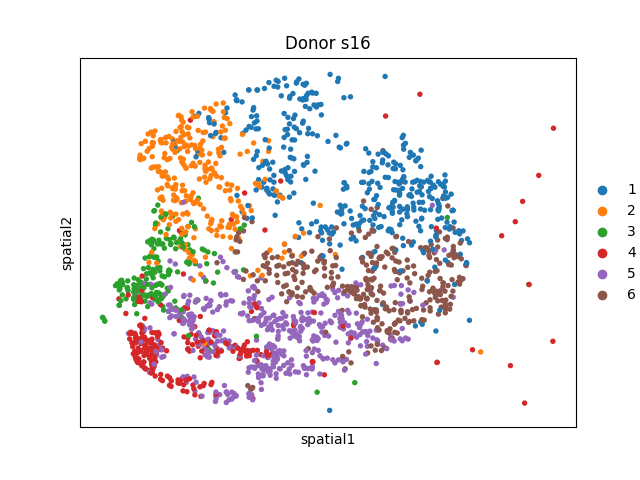

...

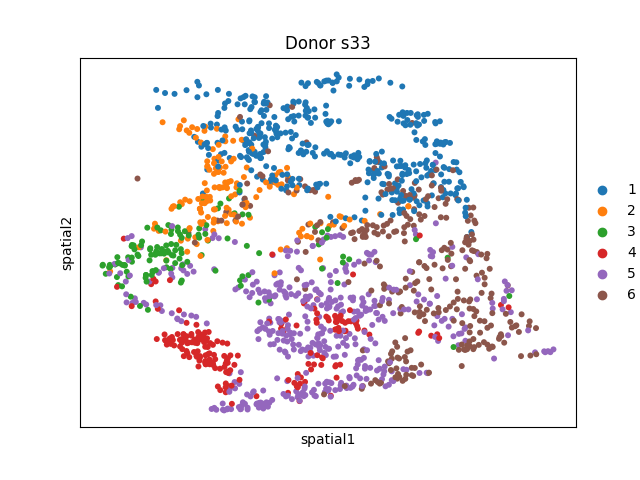

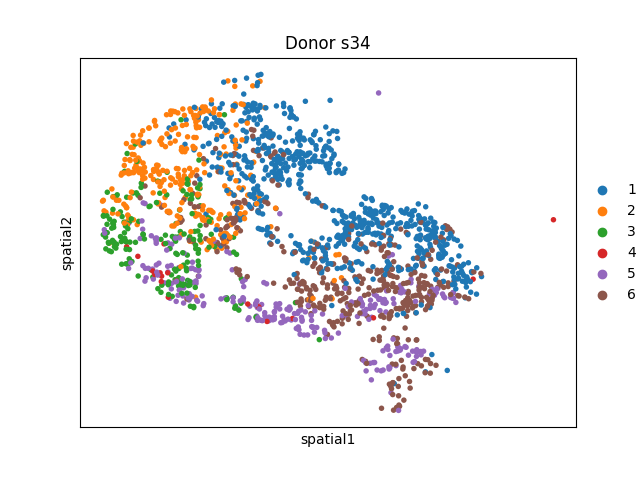

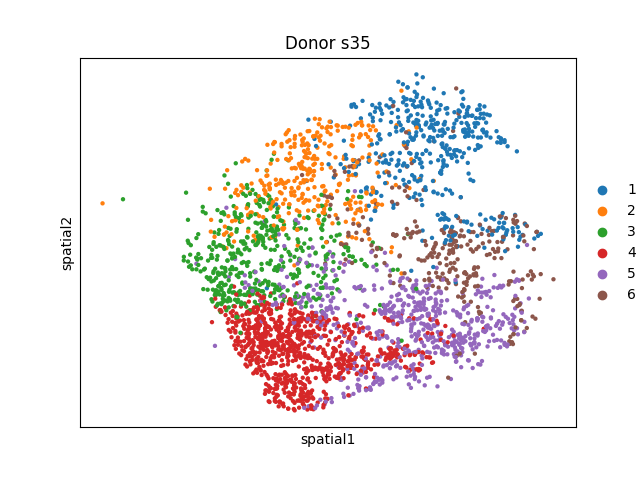

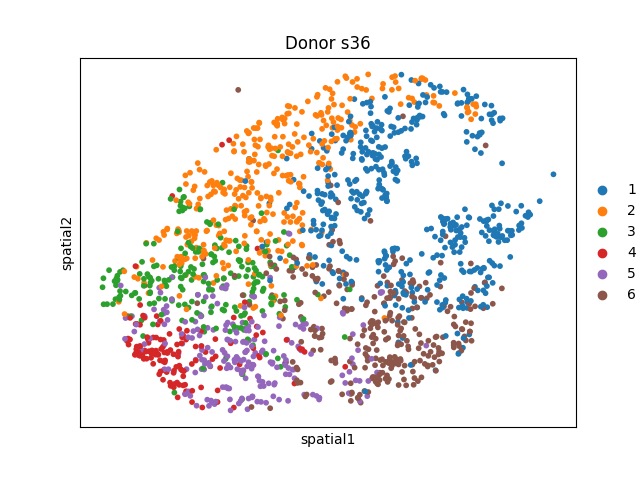

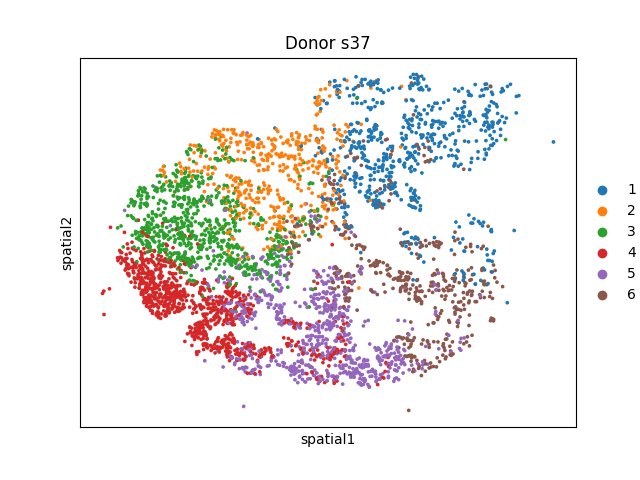

In [91]:
for a in [xdp_adata_sub, adata]:
    for s in a.obs["donor_id"].unique()[:]:
        axs = sc.pl.embedding(
            a[(a.obs["donor_id"] == s) & (a.obs["ct_for_deg"] == "Matrix_D1")],
        basis="spatial",
        color=["zone"],
        title=f"Donor {s}",
        show=False,
    )

    # color=[...] returns a list; a bare string returns a single Axes — handle both
    for ax in (axs if isinstance(axs, list) else [axs]):
        ax.set_aspect("equal")

    plt.show()    #break

    

# Read splines data and add info

In [185]:
# initialize once BEFORE the loop so the columns exist
adata.obs["r"] = np.nan
adata.obs["d"] = np.nan
xdp_adata_sub.obs["r"] = np.nan
xdp_adata_sub.obs["d"] = np.nan

for a in [xdp_adata_sub, adata]:
    print(a)
    for s in a.obs["donor_id"].unique():
        csv_path = f"/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/for_splines/{s}_x_y_with_splines.csv"
        if not os.path.exists(csv_path):
            print(f"Donor {s} - spline file not found, skipping ...")
            continue

        df_spline = pd.read_csv(csv_path, index_col=0)
        df_spline.index = df_spline.index.astype(str)

        # Normalise
        df_spline["r_original"] = df_spline["r"].copy()  # keep original for reference
        df_spline["r"] = df_spline["r"] / df_spline["r"].max()

        display(df_spline.head())
        display(a.obs.head())

        # the spline CSV is produced by an external R step and can drift out of sync with
        # the current `adata` (e.g. upstream filtering changed since splines were computed) —
        # only assign cells still present, and report what got dropped
        common_idx = df_spline.index.intersection(a.obs_names)
        missing    = df_spline.index.difference(a.obs_names)
        if len(missing) > 0:
            print(f"Donor {s} - {len(missing)}/{len(df_spline)} spline barcodes not found in adata, skipping those")

        # assign by row (cell barcode), into named columns — pandas aligns on index
        a.obs.loc[common_idx, "r"] = df_spline.loc[common_idx, "r"]
        a.obs.loc[common_idx, "d"] = df_spline.loc[common_idx, "d"]
        a.obs.loc[common_idx, "r_original"] = df_spline.loc[common_idx, "r_original"]

adata.obs["region"] = np.where(adata.obs["d"] < 0, "caudate", "putamen")
xdp_adata_sub.obs["region"] = np.where(xdp_adata_sub.obs["d"] < 0, "caudate", "putamen")

AnnData object with n_obs × n_vars = 6591 × 37464
    obs: 'x', 'y', 'pct_intronic', 'dbscan_clusters', 'dbscan_score', 'has_spatial', 'sample', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Neighborhood_aggregate_probability', 'Class_name', 'Class_bootstrapping_probability', 'Class_aggregate_probability', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Subclass_aggregate_probability', 'Group_name', 'Group_bootstrapping_probability', 'Group_aggregate_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'library_id', 'donor_number', 'donor_id', 'condition', 'sex', 'age_at_onset', 'age_at_death', 'bcl', 'library', 'Sorted', 'mapping_coupling_for_zoning', 'zone', 'zone_probability', 'mapping_coupling_for_zoning_4_zones', 'zone_4', 'zone_4_probability', 'leiden_0.1_all_cel

,x,y,d,r,r_original
95421,10415.425106,2129.599270,2602.704530,0.088104,2596.637868
95437,8346.060562,5996.362047,4168.885232,0.206206,6077.423643
95455,9761.182678,7895.547945,2768.918616,0.261370,7703.246074
95506,18481.881807,6530.497358,-5976.523588,0.217281,6403.817376
95509,12935.036470,7752.475471,-408.176247,0.262004,7721.924875


,x,y,pct_intronic,dbscan_clusters,dbscan_score,has_spatial,sample,Neighborhood_name,Neighborhood_bootstrapping_probability,Neighborhood_aggregate_probability,...,puck,region,radial_high_mito_patch,radial_patch_in_death,radial_patch_in_healthy,mito_radial_neighborhood,ct,r,d,r_original
95421,10415.425106,2129.599270,0.618838,1.0,0.786908,True,sample_02,Subpallium GABA,1.0,1.0,...,puck1,putamen,NaN,NaN,radial_patch_in_healthy,radial_patch_in_healthy,eMSN_D1D2,NaN,NaN,2979.585284
95437,8346.060562,5996.362047,0.569211,1.0,0.815845,True,sample_02,Subpallium GABA,1.0,1.0,...,puck2,putamen,NaN,NaN,radial_patch_in_healthy,radial_patch_in_healthy,Patch,NaN,NaN,NaN
95455,9761.182678,7895.547945,0.626447,1.0,0.778672,True,sample_02,Subpallium GABA,1.0,1.0,...,puck2,putamen,NaN,NaN,radial_patch_in_healthy,radial_patch_in_healthy,Matrix,NaN,NaN,NaN
95506,18481.881807,6530.497358,0.608801,1.0,0.773679,True,sample_02,Subpallium GABA,1.0,1.0,...,puck2,putamen,NaN,NaN,NaN,NaN,Matrix,NaN,NaN,NaN
95509,12935.036470,7752.475471,0.607442,1.0,0.802518,True,sample_02,Subpallium GABA,1.0,1.0,...,puck2,putamen,NaN,NaN,radial_patch_in_healthy,radial_patch_in_healthy,Patch,NaN,NaN,NaN


AnnData object with n_obs × n_vars = 118710 × 37905
    obs: 'pct_coding', 'pct_utr', 'pct_intergenic', 'pct_genic', 'pct_intronic', 'pct_mt', 'pct_ribosomal', 'frac_contamination', 'experiment', 'Neighborhood_label', 'Neighborhood_name', 'Class_label', 'Class_name', 'Subclass_label', 'Subclass_name', 'Group_label', 'Group_name', 'donor_id', 'nCount_RNA', 'nFeature_RNA', 'x', 'y', 'library', 'unique_cell_ID', 'zone', 'ct_for_deg', 'ct', 'r', 'd', 'r_original', 'region', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    obsm: 'spatial'
    layers: 'counts'


,x,y,d,r,r_original
s5_s5_CTATCAGAGCTTCGTT_1,10374.583910,12016.090658,-4096.517455,0.206828,6175.330569
s5_s5_AGCTTCCGTCTGTGGA_1,11183.131766,26674.195077,3498.427588,0.729115,21769.457753
s5_s5_CCGATTAAGACAATTC_1,10304.215893,6864.722650,-5341.673244,0.076578,2286.428126
s5_s5_CTTCGTTAGCGTTGTA_1,1068.242984,11849.066571,4998.530615,0.138426,4133.031660
s5_s5_CCTTGCCAGCGTGGTT_1,6618.881840,8704.140173,-1244.782385,0.088778,2650.678841


,pct_coding,pct_utr,pct_intergenic,pct_genic,pct_intronic,pct_mt,pct_ribosomal,frac_contamination,experiment,Neighborhood_label,...,ct_for_deg,ct,r,d,r_original,region,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
s5_s5_CTATCAGAGCTTCGTT_1,0.1999,0.0710,0.0634,0.9342,0.6634,0.0023,0,0.011298,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,NaN,NaN,6175.330569,caudate,6850,35960,46,0.127920
s5_s5_AGCTTCCGTCTGTGGA_1,0.1873,0.0764,0.0654,0.9308,0.6671,0.0038,0,0.001800,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,NaN,NaN,21769.457753,putamen,11174,155216,365,0.235156
s5_s5_CCGATTAAGACAATTC_1,0.1654,0.0639,0.0677,0.9280,0.6986,0.0043,0,0.005945,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,NaN,NaN,2286.428126,caudate,7501,53172,131,0.246370
s5_s5_CTTCGTTAGCGTTGTA_1,0.2120,0.0816,0.0633,0.9336,0.6400,0.0031,0,0.003180,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,NaN,NaN,4133.031660,putamen,10111,83854,181,0.215851
s5_s5_CCTTGCCAGCGTGGTT_1,0.1394,0.0551,0.0771,0.9220,0.7274,0.0009,0,0.002287,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,NaN,NaN,2650.678841,caudate,10147,117378,66,0.056229


Donor s5 - 655/9455 spline barcodes not found in adata, skipping those


,x,y,d,r,r_original
s12_s12_GCGATGTTCCCTCGGT_1,690.966325,-6793.675164,4881.309149,0.856964,25392.051168
s12_s12_GTTGCAATCACAGTTG_1,-5878.722283,-21432.187651,-3128.658158,0.350721,10391.936084
s12_s12_CACTCGACACGATTAC_1,-13330.827452,-28187.260018,406.155733,0.032236,955.169789
s12_s12_AACCCCTGTCGAGGGA_1,-13151.167959,-19722.286613,4320.694363,0.332331,9847.059828
s12_s12_ATAGGGAGTAGACGGG_1,-13675.873039,-10551.531478,8711.291968,0.522522,15482.448544


,pct_coding,pct_utr,pct_intergenic,pct_genic,pct_intronic,pct_mt,pct_ribosomal,frac_contamination,experiment,Neighborhood_label,...,ct_for_deg,ct,r,d,r_original,region,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
s5_s5_CTATCAGAGCTTCGTT_1,0.1999,0.0710,0.0634,0.9342,0.6634,0.0023,0,0.011298,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.206828,-4096.517455,6175.330569,caudate,6850,35960,46,0.127920
s5_s5_AGCTTCCGTCTGTGGA_1,0.1873,0.0764,0.0654,0.9308,0.6671,0.0038,0,0.001800,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.729115,3498.427588,21769.457753,putamen,11174,155216,365,0.235156
s5_s5_CCGATTAAGACAATTC_1,0.1654,0.0639,0.0677,0.9280,0.6986,0.0043,0,0.005945,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.076578,-5341.673244,2286.428126,caudate,7501,53172,131,0.246370
s5_s5_CTTCGTTAGCGTTGTA_1,0.2120,0.0816,0.0633,0.9336,0.6400,0.0031,0,0.003180,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.138426,4998.530615,4133.031660,putamen,10111,83854,181,0.215851
s5_s5_CCTTGCCAGCGTGGTT_1,0.1394,0.0551,0.0771,0.9220,0.7274,0.0009,0,0.002287,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.088778,-1244.782385,2650.678841,caudate,10147,117378,66,0.056229


Donor s12 - 688/8659 spline barcodes not found in adata, skipping those


,x,y,d,r,r_original
s15_s15_ACAATTTCAGTGGCGA_1,-23897.543059,-27384.934573,-856.170569,0.040469,1249.417928
s15_s15_CCCAACACACTAGCGC_1,-23896.509504,-17060.163423,4902.727336,0.334006,10311.952451
s15_s15_AGGGACCAGGTGGGTA_1,-25116.508633,-18619.487639,5248.287472,0.261650,8078.064969
s15_s15_CATTAACAGATCTGCA_1,-23828.210607,-28282.809548,-1472.396367,0.019329,596.743666
s15_s15_CAGGACGCACCATGCA_1,-9576.162218,-18356.872393,-8580.258646,0.532160,16429.668885


,pct_coding,pct_utr,pct_intergenic,pct_genic,pct_intronic,pct_mt,pct_ribosomal,frac_contamination,experiment,Neighborhood_label,...,ct_for_deg,ct,r,d,r_original,region,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
s5_s5_CTATCAGAGCTTCGTT_1,0.1999,0.0710,0.0634,0.9342,0.6634,0.0023,0,0.011298,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.206828,-4096.517455,6175.330569,caudate,6850,35960,46,0.127920
s5_s5_AGCTTCCGTCTGTGGA_1,0.1873,0.0764,0.0654,0.9308,0.6671,0.0038,0,0.001800,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.729115,3498.427588,21769.457753,putamen,11174,155216,365,0.235156
s5_s5_CCGATTAAGACAATTC_1,0.1654,0.0639,0.0677,0.9280,0.6986,0.0043,0,0.005945,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.076578,-5341.673244,2286.428126,caudate,7501,53172,131,0.246370
s5_s5_CTTCGTTAGCGTTGTA_1,0.2120,0.0816,0.0633,0.9336,0.6400,0.0031,0,0.003180,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.138426,4998.530615,4133.031660,putamen,10111,83854,181,0.215851
s5_s5_CCTTGCCAGCGTGGTT_1,0.1394,0.0551,0.0771,0.9220,0.7274,0.0009,0,0.002287,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.088778,-1244.782385,2650.678841,caudate,10147,117378,66,0.056229


Donor s15 - 414/7534 spline barcodes not found in adata, skipping those


,x,y,d,r,r_original
s16_s16_GGAGCTAAGGTAGTTT_1,20567.632520,9102.028170,-9212.214616,0.590625,16886.838023
s16_s16_GTTACGGGTATCTCGC_1,9479.433227,3257.119182,-1369.991607,0.142617,4077.640499
s16_s16_CAAGCGGCACTCGACA_1,15071.297010,14406.563263,-1581.128837,0.597597,17086.189456
s16_s16_ATGGGTGAGCGCTTGG_1,8859.212763,22802.571408,8019.307595,0.795795,22752.969830
s16_s16_CGAAGCCGTACATCCC_1,14897.592251,6947.252871,-4956.261996,0.303061,8664.971218


,pct_coding,pct_utr,pct_intergenic,pct_genic,pct_intronic,pct_mt,pct_ribosomal,frac_contamination,experiment,Neighborhood_label,...,ct_for_deg,ct,r,d,r_original,region,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
s5_s5_CTATCAGAGCTTCGTT_1,0.1999,0.0710,0.0634,0.9342,0.6634,0.0023,0,0.011298,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.206828,-4096.517455,6175.330569,caudate,6850,35960,46,0.127920
s5_s5_AGCTTCCGTCTGTGGA_1,0.1873,0.0764,0.0654,0.9308,0.6671,0.0038,0,0.001800,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.729115,3498.427588,21769.457753,putamen,11174,155216,365,0.235156
s5_s5_CCGATTAAGACAATTC_1,0.1654,0.0639,0.0677,0.9280,0.6986,0.0043,0,0.005945,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.076578,-5341.673244,2286.428126,caudate,7501,53172,131,0.246370
s5_s5_CTTCGTTAGCGTTGTA_1,0.2120,0.0816,0.0633,0.9336,0.6400,0.0031,0,0.003180,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.138426,4998.530615,4133.031660,putamen,10111,83854,181,0.215851
s5_s5_CCTTGCCAGCGTGGTT_1,0.1394,0.0551,0.0771,0.9220,0.7274,0.0009,0,0.002287,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.088778,-1244.782385,2650.678841,caudate,10147,117378,66,0.056229


Donor s16 - 401/5378 spline barcodes not found in adata, skipping those


,x,y,d,r,r_original
s17_s17_CTGCTATTCGTCAAAT_1,-3123.699272,-19048.371993,6547.006733,0.492645,14179.865504
s17_s17_CGCTAAATCGGTGGTT_1,-24.808178,-33273.289768,-3444.626073,0.108904,3134.605886
s17_s17_CCAAAGGAGAGGCGTA_1,-6376.213273,-16323.330739,10664.377475,0.526116,15143.260469
s17_s17_GTACAATTCGGATACC_1,-3429.625340,-17914.996470,7317.986639,0.521574,15012.540344
s17_s17_CACTTATGTAGGAAAT_1,312.840522,-34861.057836,-4611.887090,0.070060,2016.558105


,pct_coding,pct_utr,pct_intergenic,pct_genic,pct_intronic,pct_mt,pct_ribosomal,frac_contamination,experiment,Neighborhood_label,...,ct_for_deg,ct,r,d,r_original,region,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
s5_s5_CTATCAGAGCTTCGTT_1,0.1999,0.0710,0.0634,0.9342,0.6634,0.0023,0,0.011298,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.206828,-4096.517455,6175.330569,caudate,6850,35960,46,0.127920
s5_s5_AGCTTCCGTCTGTGGA_1,0.1873,0.0764,0.0654,0.9308,0.6671,0.0038,0,0.001800,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.729115,3498.427588,21769.457753,putamen,11174,155216,365,0.235156
s5_s5_CCGATTAAGACAATTC_1,0.1654,0.0639,0.0677,0.9280,0.6986,0.0043,0,0.005945,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.076578,-5341.673244,2286.428126,caudate,7501,53172,131,0.246370
s5_s5_CTTCGTTAGCGTTGTA_1,0.2120,0.0816,0.0633,0.9336,0.6400,0.0031,0,0.003180,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.138426,4998.530615,4133.031660,putamen,10111,83854,181,0.215851
s5_s5_CCTTGCCAGCGTGGTT_1,0.1394,0.0551,0.0771,0.9220,0.7274,0.0009,0,0.002287,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.088778,-1244.782385,2650.678841,caudate,10147,117378,66,0.056229


Donor s17 - 150/4003 spline barcodes not found in adata, skipping those


,x,y,d,r,r_original
s18_s18_GCGCTTGAGGTCGGAA_1,-18479.876491,-17234.015008,4368.057046,0.330921,7147.403232
s18_s18_ATGCAGCTCCCTGATT_1,-15905.327056,-18096.327545,1677.885443,0.349590,7550.613049
s18_s18_AGGCAGGGTCGATGAT_1,-17228.006554,-25900.100393,-1072.315349,0.001857,40.110909
s18_s18_GGACAATAGCTTGAAT_1,-16638.661178,-16543.513905,2959.755383,0.413079,8921.899548
s18_s18_AAACGCGAGAAAGGAG_1,-15127.283295,-19887.028814,169.733340,0.290410,6272.431972


,pct_coding,pct_utr,pct_intergenic,pct_genic,pct_intronic,pct_mt,pct_ribosomal,frac_contamination,experiment,Neighborhood_label,...,ct_for_deg,ct,r,d,r_original,region,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
s5_s5_CTATCAGAGCTTCGTT_1,0.1999,0.0710,0.0634,0.9342,0.6634,0.0023,0,0.011298,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.206828,-4096.517455,6175.330569,caudate,6850,35960,46,0.127920
s5_s5_AGCTTCCGTCTGTGGA_1,0.1873,0.0764,0.0654,0.9308,0.6671,0.0038,0,0.001800,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.729115,3498.427588,21769.457753,putamen,11174,155216,365,0.235156
s5_s5_CCGATTAAGACAATTC_1,0.1654,0.0639,0.0677,0.9280,0.6986,0.0043,0,0.005945,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.076578,-5341.673244,2286.428126,caudate,7501,53172,131,0.246370
s5_s5_CTTCGTTAGCGTTGTA_1,0.2120,0.0816,0.0633,0.9336,0.6400,0.0031,0,0.003180,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.138426,4998.530615,4133.031660,putamen,10111,83854,181,0.215851
s5_s5_CCTTGCCAGCGTGGTT_1,0.1394,0.0551,0.0771,0.9220,0.7274,0.0009,0,0.002287,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.088778,-1244.782385,2650.678841,caudate,10147,117378,66,0.056229


Donor s18 - 344/3864 spline barcodes not found in adata, skipping those


,x,y,d,r,r_original
s20_s20_2025-03-20_s20_UMBEB22074_GEX_CAP_rxn1_CGAACACTCGTTGCAA,-14.890137,19.306307,12.398985,0.706704,47.785992
s20_s20_2025-03-20_s20_UMBEB22074_GEX_CAP_rxn1_CATGGGGCAGGATGGT,-20.806090,-28.532505,-9.113365,0.120613,8.155643
s20_s20_2025-03-20_s20_UMBEB22074_GEX_CAP_rxn1_CCCAACGAGCTCATGA,-15.671423,-20.746917,-7.021224,0.248251,16.786276
s20_s20_2025-03-20_s20_UMBEB22074_GEX_CAP_rxn1_CATAACGTCCGTTCTG,5.677400,14.235136,-3.960317,0.883832,59.763061
s20_s20_2025-03-20_s20_UMBEB22074_GEX_CAP_rxn1_ACCTGTAAGGGAGTTG,-1.110977,26.794537,10.316264,0.884310,59.795364


,pct_coding,pct_utr,pct_intergenic,pct_genic,pct_intronic,pct_mt,pct_ribosomal,frac_contamination,experiment,Neighborhood_label,...,ct_for_deg,ct,r,d,r_original,region,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
s5_s5_CTATCAGAGCTTCGTT_1,0.1999,0.0710,0.0634,0.9342,0.6634,0.0023,0,0.011298,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.206828,-4096.517455,6175.330569,caudate,6850,35960,46,0.127920
s5_s5_AGCTTCCGTCTGTGGA_1,0.1873,0.0764,0.0654,0.9308,0.6671,0.0038,0,0.001800,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.729115,3498.427588,21769.457753,putamen,11174,155216,365,0.235156
s5_s5_CCGATTAAGACAATTC_1,0.1654,0.0639,0.0677,0.9280,0.6986,0.0043,0,0.005945,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.076578,-5341.673244,2286.428126,caudate,7501,53172,131,0.246370
s5_s5_CTTCGTTAGCGTTGTA_1,0.2120,0.0816,0.0633,0.9336,0.6400,0.0031,0,0.003180,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.138426,4998.530615,4133.031660,putamen,10111,83854,181,0.215851
s5_s5_CCTTGCCAGCGTGGTT_1,0.1394,0.0551,0.0771,0.9220,0.7274,0.0009,0,0.002287,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.088778,-1244.782385,2650.678841,caudate,10147,117378,66,0.056229


Donor s20 - 106/1911 spline barcodes not found in adata, skipping those


,x,y,d,r,r_original
s21_s21_GCTTTCGTCACATTCC_1,-18281.957536,-4832.313899,-4545.652365,0.483033,12070.380173
s21_s21_AGCAGTACAATAACTT_1,-23486.117779,-3851.384825,-106.357120,0.375319,9378.753230
s21_s21_CCTAATACAGCTGTAT_1,-32835.133623,-2308.575434,6888.827279,0.063425,1584.913458
s21_s21_ACGAGTTGTATGTCTT_1,-20293.280114,-8917.931575,-5993.023854,0.335335,8379.604910
s21_s21_GTTCACGCACAATGTC_1,-26605.454944,-7133.321493,-591.006410,0.196280,4904.778251


,pct_coding,pct_utr,pct_intergenic,pct_genic,pct_intronic,pct_mt,pct_ribosomal,frac_contamination,experiment,Neighborhood_label,...,ct_for_deg,ct,r,d,r_original,region,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
s5_s5_CTATCAGAGCTTCGTT_1,0.1999,0.0710,0.0634,0.9342,0.6634,0.0023,0,0.011298,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.206828,-4096.517455,6175.330569,caudate,6850,35960,46,0.127920
s5_s5_AGCTTCCGTCTGTGGA_1,0.1873,0.0764,0.0654,0.9308,0.6671,0.0038,0,0.001800,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.729115,3498.427588,21769.457753,putamen,11174,155216,365,0.235156
s5_s5_CCGATTAAGACAATTC_1,0.1654,0.0639,0.0677,0.9280,0.6986,0.0043,0,0.005945,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.076578,-5341.673244,2286.428126,caudate,7501,53172,131,0.246370
s5_s5_CTTCGTTAGCGTTGTA_1,0.2120,0.0816,0.0633,0.9336,0.6400,0.0031,0,0.003180,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.138426,4998.530615,4133.031660,putamen,10111,83854,181,0.215851
s5_s5_CCTTGCCAGCGTGGTT_1,0.1394,0.0551,0.0771,0.9220,0.7274,0.0009,0,0.002287,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.088778,-1244.782385,2650.678841,caudate,10147,117378,66,0.056229


Donor s21 - 394/4964 spline barcodes not found in adata, skipping those


,x,y,d,r,r_original
s23_s23_ATCCAGGGTGGTTTAA_1,-18150.851086,-4583.854973,-6762.634931,0.253582,5655.424175
s23_s23_ATACACCCAGTAGTAG_1,-18881.199649,-2879.627443,-5286.722365,0.298268,6652.020018
s23_s23_GCTTCGCTCCCTTCCT_1,-19691.805156,-3389.700185,-4831.037993,0.264239,5893.102196
s23_s23_AGCCATTCAAATACAA_1,-16518.360749,2760.143249,-4938.795979,0.563724,12572.266952
s23_s23_CTCGGCAAGGTTATGT_1,-15404.632061,2126.806289,-6218.632880,0.561054,12512.721809


,pct_coding,pct_utr,pct_intergenic,pct_genic,pct_intronic,pct_mt,pct_ribosomal,frac_contamination,experiment,Neighborhood_label,...,ct_for_deg,ct,r,d,r_original,region,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
s5_s5_CTATCAGAGCTTCGTT_1,0.1999,0.0710,0.0634,0.9342,0.6634,0.0023,0,0.011298,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.206828,-4096.517455,6175.330569,caudate,6850,35960,46,0.127920
s5_s5_AGCTTCCGTCTGTGGA_1,0.1873,0.0764,0.0654,0.9308,0.6671,0.0038,0,0.001800,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.729115,3498.427588,21769.457753,putamen,11174,155216,365,0.235156
s5_s5_CCGATTAAGACAATTC_1,0.1654,0.0639,0.0677,0.9280,0.6986,0.0043,0,0.005945,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.076578,-5341.673244,2286.428126,caudate,7501,53172,131,0.246370
s5_s5_CTTCGTTAGCGTTGTA_1,0.2120,0.0816,0.0633,0.9336,0.6400,0.0031,0,0.003180,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.138426,4998.530615,4133.031660,putamen,10111,83854,181,0.215851
s5_s5_CCTTGCCAGCGTGGTT_1,0.1394,0.0551,0.0771,0.9220,0.7274,0.0009,0,0.002287,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.088778,-1244.782385,2650.678841,caudate,10147,117378,66,0.056229


Donor s23 - 869/13303 spline barcodes not found in adata, skipping those


,x,y,d,r,r_original
s26_s26_GTGGCAGCAGCGTCTA_1,28802.486915,-2999.066192,-13045.974888,0.466655,10211.772046
s26_s26_AATTATGTCCACCTAT_1,17635.555490,-4664.111929,-5083.657751,0.195463,4277.303940
s26_s26_ACCCTGCTCGCGCATG_1,13690.367615,12375.596198,8014.769701,0.703914,15403.668964
s26_s26_GCGTAGAAGAGGCGGT_1,15216.277999,15816.153174,8678.741794,0.872159,19085.357563
s26_s26_AATCCCCGTCATGTGG_1,25156.137218,4963.114744,-5635.832136,0.716036,15668.933554


,pct_coding,pct_utr,pct_intergenic,pct_genic,pct_intronic,pct_mt,pct_ribosomal,frac_contamination,experiment,Neighborhood_label,...,ct_for_deg,ct,r,d,r_original,region,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
s5_s5_CTATCAGAGCTTCGTT_1,0.1999,0.0710,0.0634,0.9342,0.6634,0.0023,0,0.011298,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.206828,-4096.517455,6175.330569,caudate,6850,35960,46,0.127920
s5_s5_AGCTTCCGTCTGTGGA_1,0.1873,0.0764,0.0654,0.9308,0.6671,0.0038,0,0.001800,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.729115,3498.427588,21769.457753,putamen,11174,155216,365,0.235156
s5_s5_CCGATTAAGACAATTC_1,0.1654,0.0639,0.0677,0.9280,0.6986,0.0043,0,0.005945,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.076578,-5341.673244,2286.428126,caudate,7501,53172,131,0.246370
s5_s5_CTTCGTTAGCGTTGTA_1,0.2120,0.0816,0.0633,0.9336,0.6400,0.0031,0,0.003180,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.138426,4998.530615,4133.031660,putamen,10111,83854,181,0.215851
s5_s5_CCTTGCCAGCGTGGTT_1,0.1394,0.0551,0.0771,0.9220,0.7274,0.0009,0,0.002287,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.088778,-1244.782385,2650.678841,caudate,10147,117378,66,0.056229


Donor s26 - 169/5412 spline barcodes not found in adata, skipping those


,x,y,d,r,r_original
s29_s29_2025-05-13_s29_GEX_CAP_rxn4_GGACGACAGGCTTTAG,18613.795720,-17103.361382,-6513.965017,0.165265,5003.833917
s29_s29_2025-05-13_s29_GEX_CAP_rxn4_AGCCCTCTCAGTTAGT,16068.429877,-15276.968840,-3411.311262,0.150664,4561.750036
s29_s29_2025-05-13_s29_GEX_CAP_rxn4_CGTCGTACACGTACGC,12021.338728,-5066.829814,6635.342055,0.294589,8919.443867
s29_s29_2025-05-13_s29_GEX_CAP_rxn4_GTGCCCCGTGGTGATT,6682.250066,-9171.695884,7608.107950,0.085425,2586.475115
s29_s29_2025-05-13_s29_GEX_CAP_rxn4_CCGTAAGGTCAGCGGT,22414.484677,-7147.249364,-1924.423111,0.493328,14936.781321


,pct_coding,pct_utr,pct_intergenic,pct_genic,pct_intronic,pct_mt,pct_ribosomal,frac_contamination,experiment,Neighborhood_label,...,ct_for_deg,ct,r,d,r_original,region,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
s5_s5_CTATCAGAGCTTCGTT_1,0.1999,0.0710,0.0634,0.9342,0.6634,0.0023,0,0.011298,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.206828,-4096.517455,6175.330569,caudate,6850,35960,46,0.127920
s5_s5_AGCTTCCGTCTGTGGA_1,0.1873,0.0764,0.0654,0.9308,0.6671,0.0038,0,0.001800,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.729115,3498.427588,21769.457753,putamen,11174,155216,365,0.235156
s5_s5_CCGATTAAGACAATTC_1,0.1654,0.0639,0.0677,0.9280,0.6986,0.0043,0,0.005945,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.076578,-5341.673244,2286.428126,caudate,7501,53172,131,0.246370
s5_s5_CTTCGTTAGCGTTGTA_1,0.2120,0.0816,0.0633,0.9336,0.6400,0.0031,0,0.003180,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.138426,4998.530615,4133.031660,putamen,10111,83854,181,0.215851
s5_s5_CCTTGCCAGCGTGGTT_1,0.1394,0.0551,0.0771,0.9220,0.7274,0.0009,0,0.002287,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.088778,-1244.782385,2650.678841,caudate,10147,117378,66,0.056229


Donor s29 - 245/3661 spline barcodes not found in adata, skipping those


,x,y,d,r,r_original
s31_s31_2025-05-14_s31_GEX_CAP_rxn1_CCGATTAAGCCATAGC,4473.067802,6172.910642,1682.305602,0.965379,21452.499877
s31_s31_2025-05-14_s31_GEX_CAP_rxn1_ATCCGGAGTATGGAGA,-5521.089219,-9650.072415,130.178109,0.138919,3087.027727
s31_s31_2025-05-14_s31_GEX_CAP_rxn1_ATAGGGGTCGTTCACT,3756.929502,-11346.147053,-9279.520226,0.192098,4268.780208
s31_s31_2025-05-14_s31_GEX_CAP_rxn1_CCGGTATAGAAACTAG,-1334.579864,8608.049373,7055.395926,0.839840,18662.788977
s31_s31_2025-05-14_s31_GEX_CAP_rxn1_AACCCAATCCGTGAGT,9430.090567,8423.983050,4687.887109,1.000000,22221.845493


,pct_coding,pct_utr,pct_intergenic,pct_genic,pct_intronic,pct_mt,pct_ribosomal,frac_contamination,experiment,Neighborhood_label,...,ct_for_deg,ct,r,d,r_original,region,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
s5_s5_CTATCAGAGCTTCGTT_1,0.1999,0.0710,0.0634,0.9342,0.6634,0.0023,0,0.011298,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.206828,-4096.517455,6175.330569,caudate,6850,35960,46,0.127920
s5_s5_AGCTTCCGTCTGTGGA_1,0.1873,0.0764,0.0654,0.9308,0.6671,0.0038,0,0.001800,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.729115,3498.427588,21769.457753,putamen,11174,155216,365,0.235156
s5_s5_CCGATTAAGACAATTC_1,0.1654,0.0639,0.0677,0.9280,0.6986,0.0043,0,0.005945,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.076578,-5341.673244,2286.428126,caudate,7501,53172,131,0.246370
s5_s5_CTTCGTTAGCGTTGTA_1,0.2120,0.0816,0.0633,0.9336,0.6400,0.0031,0,0.003180,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.138426,4998.530615,4133.031660,putamen,10111,83854,181,0.215851
s5_s5_CCTTGCCAGCGTGGTT_1,0.1394,0.0551,0.0771,0.9220,0.7274,0.0009,0,0.002287,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.088778,-1244.782385,2650.678841,caudate,10147,117378,66,0.056229


Donor s31 - 579/10565 spline barcodes not found in adata, skipping those


,x,y,d,r,r_original
s32_s32_2025-05-23_s32_UMBEB24013_GEX_CAP_rxn1_GTGCTCACAAATACCC,-4293.088668,-22970.712463,-2856.146434,0.225673,4554.016488
s32_s32_2025-05-23_s32_UMBEB24013_GEX_CAP_rxn1_GGCATGCGTATGCTCC,302.471862,-24495.029226,-7602.191460,0.170533,3441.319069
s32_s32_2025-05-23_s32_UMBEB24013_GEX_CAP_rxn1_GCCTCTATCCCGCTTA,-3565.720750,-16594.278405,-1156.899343,0.585399,11813.201633
s32_s32_2025-05-23_s32_UMBEB24013_GEX_CAP_rxn1_CCAAATCCAAGAGATT,-4242.421896,-28505.431866,-3559.772114,0.000000,0.000000
s32_s32_2025-05-23_s32_UMBEB24013_GEX_CAP_rxn1_CCAATTACACCAAATC,-646.954177,-21476.753331,-6099.583039,0.384522,7759.542187


,pct_coding,pct_utr,pct_intergenic,pct_genic,pct_intronic,pct_mt,pct_ribosomal,frac_contamination,experiment,Neighborhood_label,...,ct_for_deg,ct,r,d,r_original,region,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
s5_s5_CTATCAGAGCTTCGTT_1,0.1999,0.0710,0.0634,0.9342,0.6634,0.0023,0,0.011298,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.206828,-4096.517455,6175.330569,caudate,6850,35960,46,0.127920
s5_s5_AGCTTCCGTCTGTGGA_1,0.1873,0.0764,0.0654,0.9308,0.6671,0.0038,0,0.001800,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.729115,3498.427588,21769.457753,putamen,11174,155216,365,0.235156
s5_s5_CCGATTAAGACAATTC_1,0.1654,0.0639,0.0677,0.9280,0.6986,0.0043,0,0.005945,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.076578,-5341.673244,2286.428126,caudate,7501,53172,131,0.246370
s5_s5_CTTCGTTAGCGTTGTA_1,0.2120,0.0816,0.0633,0.9336,0.6400,0.0031,0,0.003180,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.138426,4998.530615,4133.031660,putamen,10111,83854,181,0.215851
s5_s5_CCTTGCCAGCGTGGTT_1,0.1394,0.0551,0.0771,0.9220,0.7274,0.0009,0,0.002287,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.088778,-1244.782385,2650.678841,caudate,10147,117378,66,0.056229


Donor s32 - 323/5008 spline barcodes not found in adata, skipping those


,x,y,d,r,r_original
s33_s33_2025-05-29_s33_UMBEB23158_GEX_CAP_rxn1_GGTGGTTTCCAAGTGC,18300.587191,-8965.331551,-2316.488594,0.414267,10559.384655
s33_s33_2025-05-29_s33_UMBEB23158_GEX_CAP_rxn1_CCGACATAGCCTTTCG,21633.453888,-15760.818106,-3086.037569,0.029199,744.256162
s33_s33_2025-05-29_s33_UMBEB23158_GEX_CAP_rxn1_CACTGCGAGGCTCGTG,17338.248615,-4771.607861,974.108545,0.514902,13124.516153
s33_s33_2025-05-29_s33_UMBEB23158_GEX_CAP_rxn1_AAGCTCATCCATTCAC,14893.756553,5143.227275,6602.252282,1.000000,25489.340197
s33_s33_2025-05-29_s33_UMBEB23158_GEX_CAP_rxn1_GTGCAATGTGGGTATT,24722.835967,-6067.692112,-5649.853027,0.620618,15819.137134


,pct_coding,pct_utr,pct_intergenic,pct_genic,pct_intronic,pct_mt,pct_ribosomal,frac_contamination,experiment,Neighborhood_label,...,ct_for_deg,ct,r,d,r_original,region,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
s5_s5_CTATCAGAGCTTCGTT_1,0.1999,0.0710,0.0634,0.9342,0.6634,0.0023,0,0.011298,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.206828,-4096.517455,6175.330569,caudate,6850,35960,46,0.127920
s5_s5_AGCTTCCGTCTGTGGA_1,0.1873,0.0764,0.0654,0.9308,0.6671,0.0038,0,0.001800,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.729115,3498.427588,21769.457753,putamen,11174,155216,365,0.235156
s5_s5_CCGATTAAGACAATTC_1,0.1654,0.0639,0.0677,0.9280,0.6986,0.0043,0,0.005945,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.076578,-5341.673244,2286.428126,caudate,7501,53172,131,0.246370
s5_s5_CTTCGTTAGCGTTGTA_1,0.2120,0.0816,0.0633,0.9336,0.6400,0.0031,0,0.003180,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.138426,4998.530615,4133.031660,putamen,10111,83854,181,0.215851
s5_s5_CCTTGCCAGCGTGGTT_1,0.1394,0.0551,0.0771,0.9220,0.7274,0.0009,0,0.002287,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.088778,-1244.782385,2650.678841,caudate,10147,117378,66,0.056229


Donor s33 - 316/4587 spline barcodes not found in adata, skipping those
Donor s34 - spline file not found, skipping ...


,x,y,d,r,r_original
s35_s35_2025-06-03_s35_MD9261_GEX_CAP_rxn1_ACCTCTCCAATCAACC,-2861.223923,-6370.725273,2124.040685,0.259756,7322.499651
s35_s35_2025-06-03_s35_MD9261_GEX_CAP_rxn1_GCACCTCTCCTAACTC,-6331.626398,-5633.404982,5666.375233,0.252991,7131.812369
s35_s35_2025-06-03_s35_MD9261_GEX_CAP_rxn1_CAGCAGGCACCTTACC,6483.635228,10624.970010,1438.367615,0.946872,26692.259314
s35_s35_2025-06-03_s35_MD9261_GEX_CAP_rxn1_CGTTAAAGTAAGCCGC,2499.774345,-9436.129916,-3848.237070,0.203852,5746.579151
s35_s35_2025-06-03_s35_MD9261_GEX_CAP_rxn1_GCAATCGGTGTGTTAA,-2206.522174,-11969.881250,63.803029,0.074173,2090.920981


,pct_coding,pct_utr,pct_intergenic,pct_genic,pct_intronic,pct_mt,pct_ribosomal,frac_contamination,experiment,Neighborhood_label,...,ct_for_deg,ct,r,d,r_original,region,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
s5_s5_CTATCAGAGCTTCGTT_1,0.1999,0.0710,0.0634,0.9342,0.6634,0.0023,0,0.011298,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.206828,-4096.517455,6175.330569,caudate,6850,35960,46,0.127920
s5_s5_AGCTTCCGTCTGTGGA_1,0.1873,0.0764,0.0654,0.9308,0.6671,0.0038,0,0.001800,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.729115,3498.427588,21769.457753,putamen,11174,155216,365,0.235156
s5_s5_CCGATTAAGACAATTC_1,0.1654,0.0639,0.0677,0.9280,0.6986,0.0043,0,0.005945,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.076578,-5341.673244,2286.428126,caudate,7501,53172,131,0.246370
s5_s5_CTTCGTTAGCGTTGTA_1,0.2120,0.0816,0.0633,0.9336,0.6400,0.0031,0,0.003180,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.138426,4998.530615,4133.031660,putamen,10111,83854,181,0.215851
s5_s5_CCTTGCCAGCGTGGTT_1,0.1394,0.0551,0.0771,0.9220,0.7274,0.0009,0,0.002287,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.088778,-1244.782385,2650.678841,caudate,10147,117378,66,0.056229


Donor s35 - 245/6711 spline barcodes not found in adata, skipping those


,x,y,d,r,r_original
s36_s36_2025-06-03_s36_GEX_CAP_rxn1_CCCTCTCGTGTTAGTA,5343.993774,2475.456566,-2487.099898,0.699820,19207.962604
s36_s36_2025-06-03_s36_GEX_CAP_rxn1_CTCCGGTTCGTAGATT,1532.940480,3419.952228,1363.902230,0.671468,18429.773098
s36_s36_2025-06-03_s36_GEX_CAP_rxn1_CCTCGATGTCCTATTG,-4315.974732,-3254.284594,4884.196524,0.405405,11127.141244
s36_s36_2025-06-03_s36_GEX_CAP_rxn1_GTCCCATGTATGTACA,-5262.467793,-9317.099852,3510.798383,0.105867,2905.745808
s36_s36_2025-06-03_s36_GEX_CAP_rxn1_GGCTCCCGTCTTAGGG,3004.727594,14188.615291,6215.260861,0.993310,27263.378981


,pct_coding,pct_utr,pct_intergenic,pct_genic,pct_intronic,pct_mt,pct_ribosomal,frac_contamination,experiment,Neighborhood_label,...,ct_for_deg,ct,r,d,r_original,region,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
s5_s5_CTATCAGAGCTTCGTT_1,0.1999,0.0710,0.0634,0.9342,0.6634,0.0023,0,0.011298,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.206828,-4096.517455,6175.330569,caudate,6850,35960,46,0.127920
s5_s5_AGCTTCCGTCTGTGGA_1,0.1873,0.0764,0.0654,0.9308,0.6671,0.0038,0,0.001800,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.729115,3498.427588,21769.457753,putamen,11174,155216,365,0.235156
s5_s5_CCGATTAAGACAATTC_1,0.1654,0.0639,0.0677,0.9280,0.6986,0.0043,0,0.005945,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.076578,-5341.673244,2286.428126,caudate,7501,53172,131,0.246370
s5_s5_CTTCGTTAGCGTTGTA_1,0.2120,0.0816,0.0633,0.9336,0.6400,0.0031,0,0.003180,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.138426,4998.530615,4133.031660,putamen,10111,83854,181,0.215851
s5_s5_CCTTGCCAGCGTGGTT_1,0.1394,0.0551,0.0771,0.9220,0.7274,0.0009,0,0.002287,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.088778,-1244.782385,2650.678841,caudate,10147,117378,66,0.056229


Donor s36 - 405/5188 spline barcodes not found in adata, skipping those


,x,y,d,r,r_original
s37_s37_2025-06-04_s37_GEX_CAP_rxn1_AGACATAAGCCGCTAG,-25555.429073,-9214.013446,-426.998690,0.042654,1286.551792
s37_s37_2025-06-04_s37_GEX_CAP_rxn1_ATTACAATCACTGTCT,-15088.454995,448.703424,-4451.916406,0.585587,17662.943514
s37_s37_2025-06-04_s37_GEX_CAP_rxn1_AATTCCTGTCATCTAT,-32886.552650,30.024481,8896.716245,0.250493,7555.575780
s37_s37_2025-06-04_s37_GEX_CAP_rxn1_CCTTCCTTCCGTCGCT,-25850.591779,-9182.097763,-130.669403,0.041978,1266.160454
s37_s37_2025-06-04_s37_GEX_CAP_rxn1_CTGTGAGGTCATCGAG,-21658.519030,6617.362877,4287.954379,0.518978,15653.844799


,pct_coding,pct_utr,pct_intergenic,pct_genic,pct_intronic,pct_mt,pct_ribosomal,frac_contamination,experiment,Neighborhood_label,...,ct_for_deg,ct,r,d,r_original,region,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
s5_s5_CTATCAGAGCTTCGTT_1,0.1999,0.0710,0.0634,0.9342,0.6634,0.0023,0,0.011298,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.206828,-4096.517455,6175.330569,caudate,6850,35960,46,0.127920
s5_s5_AGCTTCCGTCTGTGGA_1,0.1873,0.0764,0.0654,0.9308,0.6671,0.0038,0,0.001800,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.729115,3498.427588,21769.457753,putamen,11174,155216,365,0.235156
s5_s5_CCGATTAAGACAATTC_1,0.1654,0.0639,0.0677,0.9280,0.6986,0.0043,0,0.005945,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.076578,-5341.673244,2286.428126,caudate,7501,53172,131,0.246370
s5_s5_CTTCGTTAGCGTTGTA_1,0.2120,0.0816,0.0633,0.9336,0.6400,0.0031,0,0.003180,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.138426,4998.530615,4133.031660,putamen,10111,83854,181,0.215851
s5_s5_CCTTGCCAGCGTGGTT_1,0.1394,0.0551,0.0771,0.9220,0.7274,0.0009,0,0.002287,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.088778,-1244.782385,2650.678841,caudate,10147,117378,66,0.056229


Donor s37 - 792/11942 spline barcodes not found in adata, skipping those


,x,y,d,r,r_original
s38_s38_2025-06-04_s38_GEX_CAP_rxn1_CAGCGCATCAGCATCA,-5173.863361,-7153.165242,3128.484525,0.179119,4932.976421
s38_s38_2025-06-04_s38_GEX_CAP_rxn1_ACAAGGAGTCACGTAG,-3221.908664,1433.783978,3665.630132,0.427870,11783.667535
s38_s38_2025-06-04_s38_GEX_CAP_rxn1_CGTATCGCAGCTAAAG,5636.115190,1730.704103,-3630.212181,0.630444,17362.599370
s38_s38_2025-06-04_s38_GEX_CAP_rxn1_ATGCGCAGTGTGGCGT,5233.595314,1566.931564,-3417.577852,0.609783,16793.603550
s38_s38_2025-06-04_s38_GEX_CAP_rxn1_GTTAGCCAGCCTTTAC,6956.433289,-2199.140678,-6911.370336,0.510940,14071.421827


,pct_coding,pct_utr,pct_intergenic,pct_genic,pct_intronic,pct_mt,pct_ribosomal,frac_contamination,experiment,Neighborhood_label,...,ct_for_deg,ct,r,d,r_original,region,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
s5_s5_CTATCAGAGCTTCGTT_1,0.1999,0.0710,0.0634,0.9342,0.6634,0.0023,0,0.011298,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.206828,-4096.517455,6175.330569,caudate,6850,35960,46,0.127920
s5_s5_AGCTTCCGTCTGTGGA_1,0.1873,0.0764,0.0654,0.9308,0.6671,0.0038,0,0.001800,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.729115,3498.427588,21769.457753,putamen,11174,155216,365,0.235156
s5_s5_CCGATTAAGACAATTC_1,0.1654,0.0639,0.0677,0.9280,0.6986,0.0043,0,0.005945,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.076578,-5341.673244,2286.428126,caudate,7501,53172,131,0.246370
s5_s5_CTTCGTTAGCGTTGTA_1,0.2120,0.0816,0.0633,0.9336,0.6400,0.0031,0,0.003180,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.138426,4998.530615,4133.031660,putamen,10111,83854,181,0.215851
s5_s5_CCTTGCCAGCGTGGTT_1,0.1394,0.0551,0.0771,0.9220,0.7274,0.0009,0,0.002287,s5,CS20250428_NEIGH_0002,...,eMSN_D1D2,eMSN_D1D2,0.088778,-1244.782385,2650.678841,caudate,10147,117378,66,0.056229


Donor s38 - 442/9009 spline barcodes not found in adata, skipping those


/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.



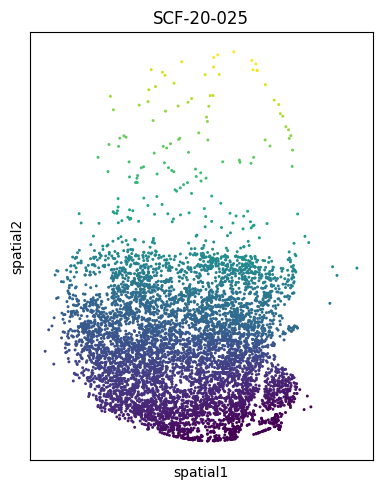

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.

/home/gdal

KeyboardInterrupt: 

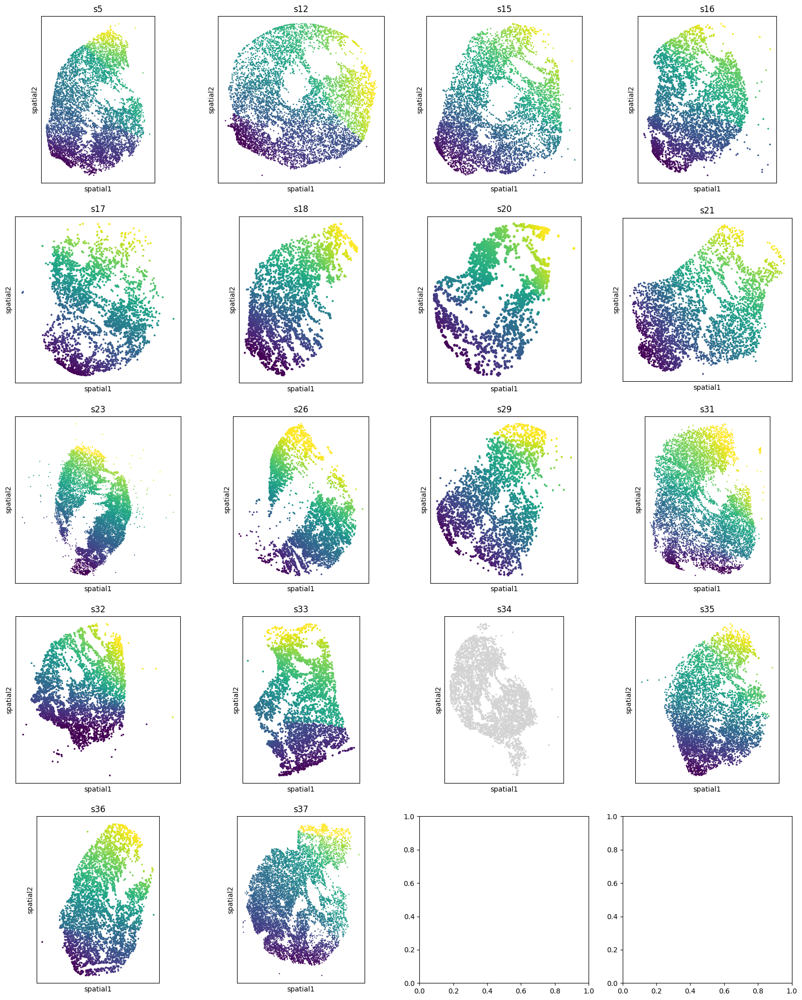

In [186]:
for a in [xdp_adata_sub, adata]:

    donors = a.obs["donor_id"].unique()
    ncols  = 4
    nrows  = int(np.ceil(len(donors) / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 5 * nrows))
    axes = axes.flatten()

    for ax, s in zip(axes, donors):
        sc.pl.embedding(
            a[a.obs["donor_id"] == s],
            basis="spatial",
            color="r",
            title=f"{s}",
            ax=ax,
            show=False,
            colorbar_loc=None,
        )
        ax.set_aspect("equal")

    # hide unused axes
    for ax in axes[len(donors):]:
        ax.set_visible(False)

    plt.tight_layout()
    plt.show()


### Save adata for Joshua Lab

In [24]:
### differt doineor id

ids_df = pd.read_csv("/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/spatial_bican_ids_conversion.csv")
ids_df.rename(columns={"donor_id": "donor_id_original", "donor": "donor_id"}, inplace=True)
ids_df



,donor_id_original,donor_id
0,PT13935,s5
1,UMBEB23073,s12
2,UMBEB23033,s15
3,UMBEB23076,s16
4,MS706984,s17
5,MS913848,s18
6,UMBEB22074,s20
7,UMBEB23127,s21
8,MS9244,s23
9,MS30499,s26


In [36]:
adata_save = adata.copy()
adata_save.X = adata_save.layers["counts"].copy()  # restore raw counts before saving
del adata_save.layers["counts"]
adata_save.obs["original_cell_barcode"] = adata_save.obs_names.copy()
adata_save.obs = adata_save.obs[
    ["original_cell_barcode", "donor_id", "Group_name", "ct", "x", "y", "r_original", "r", "d"]].copy()
adata_save.obs = adata_save.obs.merge(ids_df, on="donor_id", how="left")
adata_save = adata_save[
    adata_save.obs.dropna(subset=["r", "d"]).index
]
adata_save.obs.index = adata_save.obs["original_cell_barcode"].copy()
print(sorted(adata_save.obs["donor_id"].unique()))
print(sorted(adata_save.obs["donor_id_original"].unique()))
display(adata_save.obs)

adata_save.write_h5ad('/home/gdallagl/myworkdir/XDP/data/_old/adata_m1_m2_d1d2_with_splines.h5ad')
adata_save.obs.to_csv('/home/gdallagl/myworkdir/XDP/data/_old/adata_m1_m2_d1d2_with_splines_obs.csv')


/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/tmp/ipykernel_100630/1272882732.py:11: ImplicitModificationWarning: Trying to modify index of attribute `.obs` of view, initializing view as actual.
  adata_save.obs.index = adata_save.obs["original_cell_barcode"].copy()


['s12', 's15', 's16', 's17', 's18', 's20', 's21', 's23', 's26', 's29', 's31', 's32', 's33', 's35', 's36', 's37', 's38', 's5']
['MD6927', 'MD9129', 'MD9162', 'MD9261', 'MS30499', 'MS706984', 'MS876075', 'MS913848', 'MS9244', 'MS986638', 'PT13935', 'UMBEB22074', 'UMBEB23033', 'UMBEB23073', 'UMBEB23076', 'UMBEB23127', 'UMBEB23158', 'UMBEB24013']


,original_cell_barcode,donor_id,Group_name,ct,x,y,r_original,r,d,donor_id_original
original_cell_barcode,,,,,,,,,,
s5_s5_CTATCAGAGCTTCGTT_1,s5_s5_CTATCAGAGCTTCGTT_1,s5,STR D1D2 Hybrid MSN,eMSN_D1D2,10374.583910,12016.090658,6175.330569,0.206828,-4096.517455,PT13935
s5_s5_AGCTTCCGTCTGTGGA_1,s5_s5_AGCTTCCGTCTGTGGA_1,s5,STR D1D2 Hybrid MSN,eMSN_D1D2,11183.131766,26674.195077,21769.457753,0.729115,3498.427588,PT13935
s5_s5_CCGATTAAGACAATTC_1,s5_s5_CCGATTAAGACAATTC_1,s5,STR D1D2 Hybrid MSN,eMSN_D1D2,10304.215893,6864.722650,2286.428126,0.076578,-5341.673244,PT13935
s5_s5_CTTCGTTAGCGTTGTA_1,s5_s5_CTTCGTTAGCGTTGTA_1,s5,STR D1D2 Hybrid MSN,eMSN_D1D2,1068.242984,11849.066571,4133.031660,0.138426,4998.530615,PT13935
s5_s5_CCTTGCCAGCGTGGTT_1,s5_s5_CCTTGCCAGCGTGGTT_1,s5,STR D1D2 Hybrid MSN,eMSN_D1D2,6618.881840,8704.140173,2650.678841,0.088778,-1244.782385,PT13935
...,...,...,...,...,...,...,...,...,...,...
s5_GCGCACTCAGGTTTCG_4,s5_GCGCACTCAGGTTTCG_4,s5,STRv D2 MSN,Matrix,1669.630493,13724.718875,7141.194364,0.239177,4724.579253,PT13935
s5_AAAGCGAGTCACGAAT_6,s5_AAAGCGAGTCACGAAT_6,s5,STRd D2 Matrix MSN,Matrix,10574.620525,27863.322862,23067.609568,0.772593,4519.387706,PT13935
s5_GGGTGTAAGAGGTTGG_7,s5_GGGTGTAAGAGGTTGG_7,s5,STRv D2 MSN,Matrix,1327.032894,9839.108433,1658.147062,0.055536,4093.752576,PT13935


In [106]:
# donors = adata_save.obs["donor_id_original"].unique()
# ncols  = 4
# nrows  = int(np.ceil(len(donors) / ncols))

# fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 5 * nrows))
# axes = axes.flatten()

# for ax, s in zip(axes, donors):
#     sc.pl.embedding(
#         adata_save[adata_save.obs["donor_id_original"] == s],
#         basis="spatial",
#         color="r",
#         title=f"{s}",
#         ax=ax,
#         show=False,
#         colorbar_loc=None,
#     )
#     ax.set_aspect("equal")

# # hide unused axes
# for ax in axes[len(donors):]:
#     ax.set_visible(False)

# plt.tight_layout()
# plt.show()


### Chck expression gene

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of

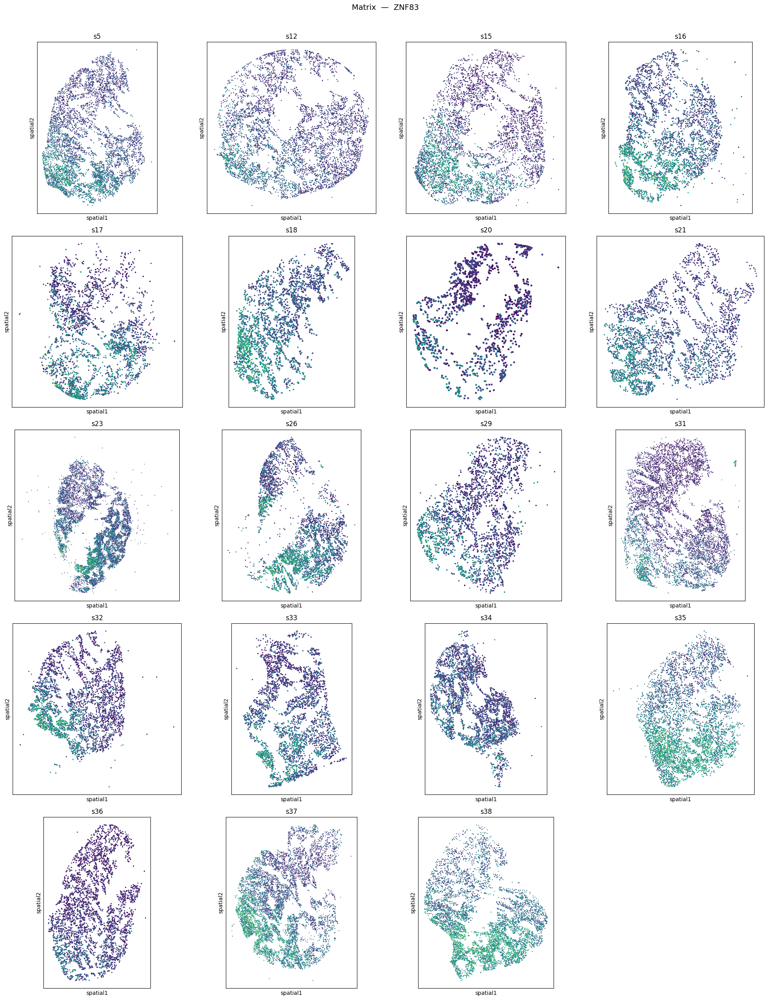

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of

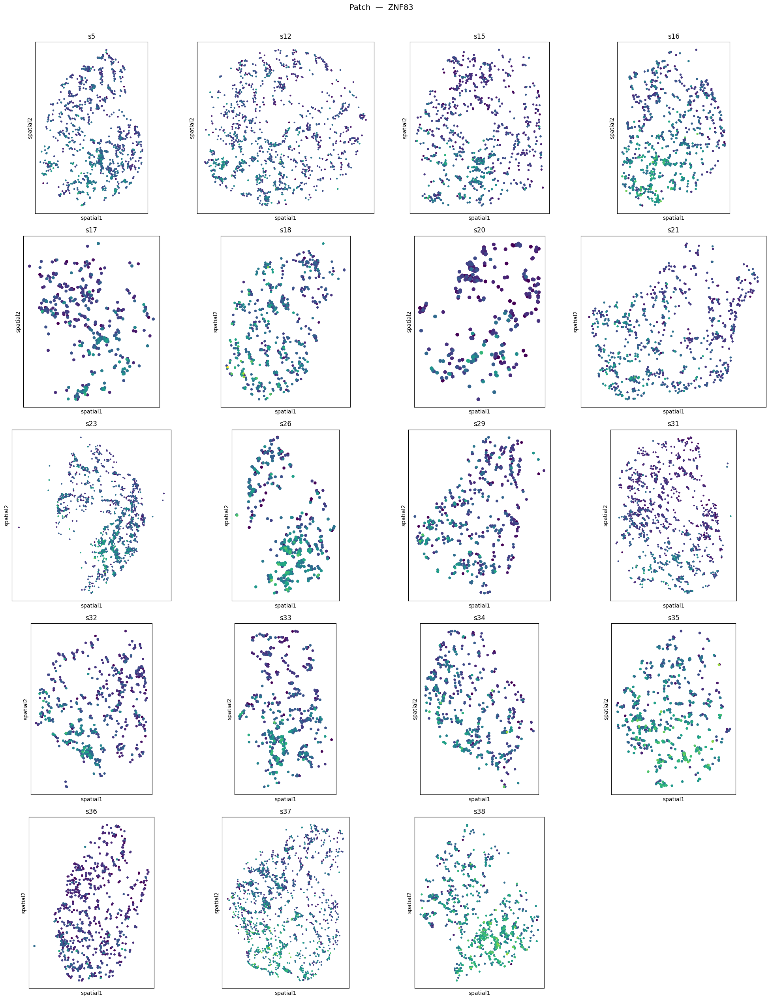

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of

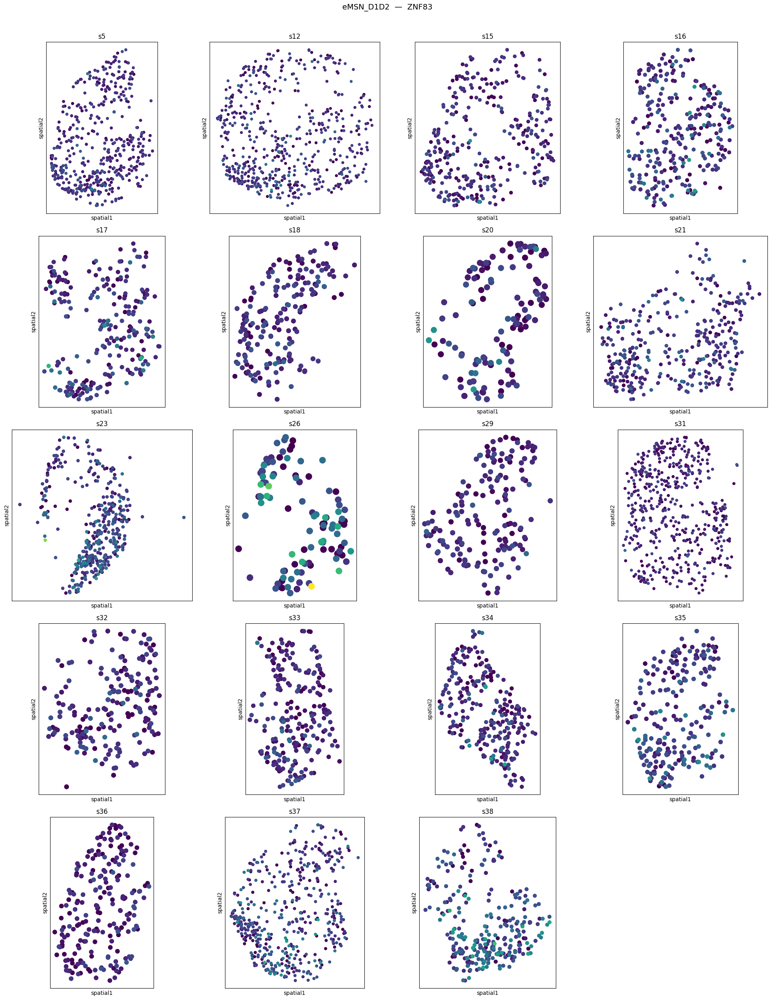

In [78]:
GENE = "ZNF83"# "GLI3" #← change this

donors  = adata.obs["donor_id"].unique()
ncols   = 4

for ct in ["Matrix", "Patch", "eMSN_D1D2"]:

    adata_ct = adata[adata.obs["ct"] == ct].copy()
    adata_ct.X = adata_ct.layers["log1p_norm"]   # set layer for plotting

    donors_ct = adata_ct.obs["donor_id"].unique()
    nrows     = int(np.ceil(len(donors_ct) / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 5 * nrows))
    axes = axes.flatten()

    # shared color scale across donors for this cell type
    vmax = adata_ct[:, GENE].X.toarray().max() if sparse.issparse(adata_ct.X) else adata_ct[:, GENE].X.max()

    for ax, s in zip(axes, donors_ct):
        sc.pl.embedding(
            adata_ct[adata_ct.obs["donor_id"] == s],
            basis="spatial",
            color=GENE,
            layer="log1p_norm",
            title=f"{s}",
            ax=ax,
            show=False,
            colorbar_loc=None,
            vmin=0,
            vmax=vmax,
        )
        ax.set_aspect("equal")

    for ax in axes[len(donors_ct):]:
        ax.set_visible(False)

    fig.suptitle(f"{ct}  —  {GENE}", fontsize=14, y=1.01)
    plt.tight_layout()
    plt.show()


# Calculate correlation of each gene wiht spline for each cell type

In [187]:
def process_adata(adata):
    # check if data is raw counts
    adata.X = adata.layers["counts"].copy()  # restore raw counts before normalization
    print(adata.X[:100, :100].toarray().sum(axis=1))

    # normalise
    print("Filtering genes and normalizing the data...")
    sc.pp.filter_genes(adata, min_cells=1) 
    print("Normaliszing...")
    sc.pp.normalize_total(adata, target_sum=1e4) #necessary !!!
    print("Log1p transformation...")
    sc.pp.log1p(adata) # not os mauch as corr is trank based
    
    adata.layers["log1p_norm"] = adata.X.copy()


process_adata(adata)
process_adata(xdp_adata_sub)

adata
xdp_adata_sub

[ 76  76  56  50  56  75  19  50  29  48  51  65  50  87  49  51  76  40
  33  64  85  83 136  51  56  58  60  51  59  53  88  73  85  17  53  32
 146  47  70  46  71  49  27  76 114  66  12  45 115 122 103  58 158  69
  43  49 118  87   9  83  68  17  80 109  55  77  34  57  71  66  55  27
   6  79  75  57  64  67  60  65  90  56  27  33  84  50  59  44  34   6
  24  83  64  62  75  49  58  64  58  28]
Filtering genes and normalizing the data...
Normaliszing...
Log1p transformation...


AnnData object with n_obs × n_vars = 6591 × 33874
    obs: 'x', 'y', 'pct_intronic', 'dbscan_clusters', 'dbscan_score', 'has_spatial', 'sample', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Neighborhood_aggregate_probability', 'Class_name', 'Class_bootstrapping_probability', 'Class_aggregate_probability', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Subclass_aggregate_probability', 'Group_name', 'Group_bootstrapping_probability', 'Group_aggregate_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'library_id', 'donor_number', 'donor_id', 'condition', 'sex', 'age_at_onset', 'age_at_death', 'bcl', 'library', 'Sorted', 'mapping_coupling_for_zoning', 'zone', 'zone_probability', 'mapping_coupling_for_zoning_4_zones', 'zone_4', 'zone_4_probability', 'leiden_0.1_all_cel

In [ ]:
import numpy as np
from scipy.stats import rankdata, ttest_1samp
from scipy.stats import rankdata, ttest_1samp, t as t_dist
from scipy import sparse
from statsmodels.stats.multitest import multipletests
import pandas as pd


def calc_spatial_corr_multi_donor(adata, metric_key="r", donor_col="donor_id", min_cells=20):

    X_full = adata.layers["log1p_norm"]
    X_full = X_full.toarray() if sparse.issparse(X_full) else np.asarray(X_full, dtype=float)

    donor_rhos  = {}   # donor -> array (n_genes,)
    donor_ncells = {}  # donor -> int

    for donor in adata.obs[donor_col].unique():

        mask = (adata.obs[donor_col] == donor).values
        r    = adata.obs.loc[mask, metric_key].values.astype(float)
        valid = ~np.isnan(r)

        if valid.sum() < min_cells:
            print(f"  Skipping {donor}: only {valid.sum()} valid cells")
            continue

        X = X_full[mask][valid]
        r = r[valid]

        Xr = rankdata(X, axis=0).astype(float)
        yr = rankdata(r).astype(float)
        Xr -= Xr.mean(axis=0)
        yr -= yr.mean()

        denom = np.sqrt((Xr**2).sum(axis=0) * (yr**2).sum())
        with np.errstate(divide="ignore", invalid="ignore"):
            rho = (Xr.T @ yr) / denom

        rho = np.where(denom == 0, 0.0, rho)   # constant gene → rho = 0, no warning

        donor_rhos[donor]   = rho
        donor_ncells[donor] = valid.sum()

    if len(donor_rhos) == 0:
        raise ValueError("Need at least 1 donor with data")

    genes      = adata.var_names
    donor_list = list(donor_rhos.keys())

    # --- donors x genes raw correlation matrix ---
    rho_matrix = np.array([donor_rhos[d] for d in donor_list])          # (n_donors, n_genes)
    df_raw     = pd.DataFrame(rho_matrix, index=donor_list, columns=genes)

    if len(donor_rhos) == 1:
        # single donor: no cross-donor variance to run Fisher-z + t-test over,
        # so test this donor's rho per gene via the Spearman t-approximation instead
        rho_combined = rho_matrix[0]
        n = donor_ncells[donor_list[0]]
        with np.errstate(divide="ignore", invalid="ignore"):
            tstat = rho_combined * np.sqrt((n - 2) / (1 - rho_combined**2))
        pval = 2 * t_dist.sf(np.abs(tstat), df=n - 2)
        pval = np.where(np.abs(rho_combined) >= 1, 0.0, pval)   # |rho|=1 → tstat undefined, treat as significant
    else:
        # --- Fisher z aggregation across donors ---
        z_matrix     = np.arctanh(np.clip(rho_matrix, -0.9999, 0.9999))
        z_mean       = z_matrix.mean(axis=0)
        rho_combined = np.tanh(z_mean)

        tstat, pval = ttest_1samp(z_matrix, popmean=0, axis=0)

    df_summary = pd.DataFrame({
        "rho"     : rho_combined,
        "pval"    : pval,
        "n_donors": len(donor_rhos),
    }, index=genes)
    df_summary["padj"] = multipletests(df_summary["pval"].fillna(1), method="fdr_bh")[1]
    df_summary = df_summary.sort_values("rho", key=np.abs, ascending=False)

    return df_summary, df_raw


# # bicna
df_corr_r_d1d2, df_raw_d1d2 = calc_spatial_corr_multi_donor(adata[adata.obs["ct"] == "eMSN_D1D2"], metric_key="r")
df_corr_r_matrix, df_raw_matrix = calc_spatial_corr_multi_donor(adata[adata.obs["ct"] == "Matrix"], metric_key="r")
df_corr_r_patch, df_raw_patch = calc_spatial_corr_multi_donor(adata[adata.obs["ct"] == "Patch"], metric_key="r")

# xdp
df_corr_r_d1d2_xdp, df_raw_d1d2_xdp = calc_spatial_corr_multi_donor(xdp_adata_sub[xdp_adata_sub.obs["ct"] == "eMSN_D1D2"], metric_key="r")
df_corr_r_matrix_xdp, df_raw_matrix_xdp = calc_spatial_corr_multi_donor(xdp_adata_sub[xdp_adata_sub.obs["ct"] == "Matrix"], metric_key="r")
df_corr_r_patch_xdp, df_raw_patch_xdp = calc_spatial_corr_multi_donor(xdp_adata_sub[xdp_adata_sub.obs["ct"] == "Patch"], metric_key="r")

In [189]:
# How well is each gene actually measured, per cell type — and how big is its expression swing along the axis?
# A rank correlation on a barely-detected gene is driven by a handful of nonzero cells and can still sneak past padj<0.05.
# log2fc is an effect-size check that rho alone doesn't give (a middling rho can still hide a large swing between poles).
# Both need the same per-celltype/per-donor masking, so compute them together in one pass over adata.

def gene_expr_stats(adata, ct, metric_key="r", donor_col="donor_id", min_cells=20, frac=0.25):
    adata_ct = adata[adata.obs["ct"] == ct]

    counts = adata_ct.layers["counts"]
    counts = counts.toarray() if sparse.issparse(counts) else np.asarray(counts)

    X_full = adata_ct.layers["log1p_norm"]
    X_full = X_full.toarray() if sparse.issparse(X_full) else np.asarray(X_full, dtype=float)

    donor_fc = {}
    for donor in adata_ct.obs[donor_col].unique():
        mask  = (adata_ct.obs[donor_col] == donor).values
        r     = adata_ct.obs.loc[mask, metric_key].values.astype(float)
        valid = ~np.isnan(r)
        if valid.sum() < min_cells:
            continue
        X = X_full[mask][valid]
        r = r[valid]

        lo_thr, hi_thr = np.quantile(r, [frac, 1 - frac])
        donor_fc[donor] = X[r >= hi_thr].mean(axis=0) - X[r <= lo_thr].mean(axis=0)

    fc_matrix = np.array(list(donor_fc.values()))  # (n_donors, n_genes)

    return pd.DataFrame({
        "pct_expr":  (counts > 0).mean(axis=0),   # fraction of cells with count > 0
        "mean_expr": counts.mean(axis=0),
        "log2fc":    fc_matrix.mean(axis=0),      # mean across donors of (high-pole - low-pole) log1p_norm expr
    }, index=adata.var_names)


for ct, df_ct in zip(["Matrix", "Patch", "eMSN_D1D2"],
                      [df_corr_r_matrix, df_corr_r_patch, df_corr_r_d1d2]):
    stats = gene_expr_stats(adata, ct)
    df_ct["pct_expr"]  = stats["pct_expr"]
    df_ct["mean_expr"] = stats["mean_expr"]
    df_ct["log2fc"]    = stats["log2fc"]

for ct, df_ct in zip(["Matrix", "Patch", "eMSN_D1D2"],
                      [df_corr_r_matrix_xdp, df_corr_r_patch_xdp, df_corr_r_d1d2_xdp]):
    stats = gene_expr_stats(xdp_adata_sub, ct)
    df_ct["pct_expr"]  = stats["pct_expr"]
    df_ct["mean_expr"] = stats["mean_expr"]
    df_ct["log2fc"]    = stats["log2fc"]


In [ ]:
df_corr = pd.DataFrame({
    "rho_Matrix":  df_corr_r_matrix["rho"],
    "padj_Matrix": df_corr_r_matrix["padj"],
    "rho_Patch":   df_corr_r_patch["rho"],
    "padj_Patch":  df_corr_r_patch["padj"],
    "rho_eMSN":    df_corr_r_d1d2["rho"],
    "padj_eMSN":   df_corr_r_d1d2["padj"],
    "pct_expr_Matrix":  df_corr_r_matrix["pct_expr"],
    "pct_expr_Patch":   df_corr_r_patch["pct_expr"],
    "pct_expr_eMSN":    df_corr_r_d1d2["pct_expr"],
    "mean_expr_Matrix":  df_corr_r_matrix["mean_expr"],
    "mean_expr_Patch":   df_corr_r_patch["mean_expr"],
    "mean_expr_eMSN":    df_corr_r_d1d2["mean_expr"],
    "log2fc_Matrix":  df_corr_r_matrix["log2fc"],
    "log2fc_Patch":   df_corr_r_patch["log2fc"],
    "log2fc_eMSN":    df_corr_r_d1d2["log2fc"], 
})

df_corr_xdp = pd.DataFrame({
    "rho_Matrix":  df_corr_r_matrix_xdp["rho"],
    "padj_Matrix": df_corr_r_matrix_xdp["padj"],
    "rho_Patch":   df_corr_r_patch_xdp["rho"],
    "padj_Patch":  df_corr_r_patch_xdp["padj"],
    "rho_eMSN":    df_corr_r_d1d2_xdp["rho"],
    "padj_eMSN":   df_corr_r_d1d2_xdp["padj"],
    "pct_expr_Matrix":  df_corr_r_matrix_xdp["pct_expr"],
    "pct_expr_Patch":   df_corr_r_patch_xdp["pct_expr"],
    "pct_expr_eMSN":    df_corr_r_d1d2_xdp["pct_expr"],
    "mean_expr_Matrix":  df_corr_r_matrix_xdp["mean_expr"],
    "mean_expr_Patch":   df_corr_r_patch_xdp["mean_expr"],
    "mean_expr_eMSN":    df_corr_r_d1d2_xdp["mean_expr"],
    "log2fc_Matrix":  df_corr_r_matrix_xdp["log2fc"],
    "log2fc_Patch":   df_corr_r_patch_xdp["log2fc"],
    "log2fc_eMSN":    df_corr_r_d1d2_xdp["log2fc"], 
})

# save dfs
df_corr_r_d1d2.to_csv("/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/genes_correlation/df_corr_r_d1d2.csv")
df_raw_d1d2.to_csv("/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/genes_correlation/df_raw_d1d2.csv")
df_corr_r_matrix.to_csv("/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/genes_correlation/df_corr_r_matrix.csv")
df_raw_matrix.to_csv("/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/genes_correlation/df_raw_matrix.csv")
df_corr_r_patch.to_csv("/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/genes_correlation/df_corr_r_patch.csv")
df_raw_patch.to_csv("/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/genes_correlation/df_raw_patch.csv")

df_corr.to_csv("/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/genes_correlation/df_corr.csv")
df_corr_xdp.to_csv("/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/genes_correlation/df_corr_xdp.csv")

display(df_corr)
display(df_corr_xdp)

,rho_Matrix,padj_Matrix,rho_Patch,padj_Patch,rho_eMSN,padj_eMSN,pct_expr_Matrix,pct_expr_Patch,pct_expr_eMSN,mean_expr_Matrix,mean_expr_Patch,mean_expr_eMSN,log2fc_Matrix,log2fc_Patch,log2fc_eMSN
A1BG,-0.049288,1.188334e-07,-0.013739,0.126070,0.005756,0.859877,0.196946,0.183558,0.158377,0.242469,0.221026,0.193437,-0.010193,-0.002997,-0.001642
A1BG-AS1,-0.009847,2.931444e-01,-0.006905,0.561543,0.014012,0.671592,0.459240,0.491040,0.327288,0.727594,0.800442,0.465112,-0.006558,-0.002602,0.005362
A1CF,-0.016858,3.670237e-04,-0.019323,0.162064,-0.007669,0.848089,0.016567,0.018501,0.007081,0.018562,0.019490,0.007254,-0.000974,-0.001443,0.000092
A2M,-0.032499,9.512906e-02,-0.031967,0.106018,-0.006327,0.836418,0.065067,0.049162,0.026425,0.071220,0.054224,0.030397,-0.003057,-0.002600,-0.001215
A2M-AS1,-0.015029,1.476341e-01,0.013977,0.480502,-0.028340,0.288574,0.112428,0.110775,0.088256,0.129769,0.127996,0.099136,-0.003083,0.002545,-0.004123
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZYX,-0.056332,3.265965e-03,-0.055286,0.003215,0.001407,1.000000,0.447572,0.382476,0.398618,0.697269,0.561671,0.594473,-0.017940,-0.013952,0.002947
ZZEF1,-0.020387,3.009640e-01,-0.020849,0.225808,-0.043543,0.032606,0.931945,0.936467,0.898618,4.881795,5.127124,4.209326,-0.013931,-0.018319,-0.028674
ZZZ3,-0.111332,8.292243e-05,-0.093048,0.000022,-0.060588,0.027779,0.961831,0.957587,0.921934,8.671416,8.693216,6.282383,-0.085421,-0.076161,-0.036595
hsa-mir-1253,0.001287,4.860390e-01,0.000000,1.000000,0.000000,1.000000,0.000031,0.000000,0.000000,0.000031,0.000000,0.000000,0.000003,0.000000,0.000000


,rho_Matrix,padj_Matrix,rho_Patch,padj_Patch,rho_eMSN,padj_eMSN,pct_expr_Matrix,pct_expr_Patch,pct_expr_eMSN,mean_expr_Matrix,mean_expr_Patch,mean_expr_eMSN,log2fc_Matrix,log2fc_Patch,log2fc_eMSN
gene_symbol,,,,,,,,,,,,,,,
A1BG,0.000633,1.000000e+00,0.002092,1.000000,-0.061750,0.213424,0.255333,0.222124,0.158016,0.314541,0.276106,0.184544,-0.011623,-0.006421,-0.024591
A1BG-AS1,0.048626,5.252801e-03,0.065115,0.189654,0.043910,0.452767,0.340226,0.411504,0.239908,0.466043,0.604425,0.295271,0.009558,0.015073,0.027445
A1CF,-0.032692,8.940571e-02,-0.009317,1.000000,0.000000,1.000000,0.011101,0.007080,0.000000,0.011972,0.007965,0.000000,-0.002490,-0.002374,0.000000
A2M,0.036075,5.412017e-02,0.049673,0.391881,0.004887,1.000000,0.019591,0.019469,0.002307,0.019591,0.019469,0.002307,0.001456,0.002535,0.000000
A2M-AS1,0.030202,1.246494e-01,-0.018300,0.872924,0.010231,1.000000,0.080975,0.066372,0.054210,0.087941,0.072566,0.057670,0.003324,-0.010045,-0.008778
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZYG11B,-0.100955,1.147405e-10,-0.046137,0.441845,-0.117735,0.003088,0.830213,0.814159,0.813149,2.291685,2.094690,2.237601,-0.062305,-0.030922,-0.123642
ZYX,-0.037530,4.287398e-02,-0.006715,1.000000,-0.009104,1.000000,0.365694,0.326549,0.273356,0.501306,0.437168,0.349481,-0.027627,-0.009693,-0.009858
ZZEF1,-0.010281,6.964577e-01,-0.018988,0.861487,0.018145,0.912467,0.882891,0.888496,0.811995,2.796691,3.022124,2.380623,-0.009338,-0.016841,0.002075


# Load corr df

In [2]:
df_corr = pd.read_csv("/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/genes_correlation/df_corr.csv", index_col=0)
df_corr_xdp = pd.read_csv("/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/genes_correlation/df_corr_xdp.csv", index_col=0)

# Analyse only H

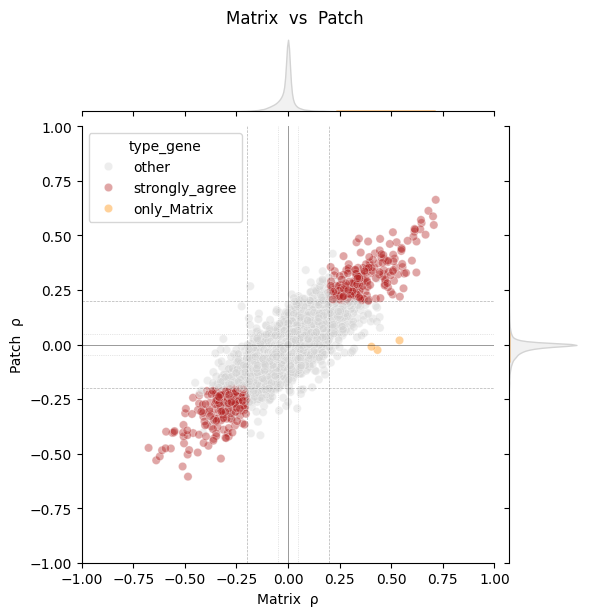

type_gene
other             36610
strongly_agree      442
only_Matrix           3
Name: Matrix vs Patch, dtype: int64

strongly_disagree


,rho_Matrix,rho_Patch,padj_Matrix,padj_Patch,pct_expr_Matrix,pct_expr_Patch,mean_expr_Matrix,mean_expr_Patch,type_gene


only_Matrix


,rho_Matrix,rho_Patch,padj_Matrix,padj_Patch,pct_expr_Matrix,pct_expr_Patch,mean_expr_Matrix,mean_expr_Patch,type_gene
GLI3,0.540033,0.019183,1.910977e-12,0.260881,0.448053,0.073074,2.582689,0.094543,only_Matrix
CPNE8,0.433549,-0.024886,4.405245e-09,0.263217,0.406520,0.118222,2.401809,0.464161,only_Matrix
LINC02822,0.404345,-0.009791,4.966257e-08,0.527593,0.541971,0.129625,18.933094,0.316791,only_Matrix


only_Patch


,rho_Matrix,rho_Patch,padj_Matrix,padj_Patch,pct_expr_Matrix,pct_expr_Patch,mean_expr_Matrix,mean_expr_Patch,type_gene


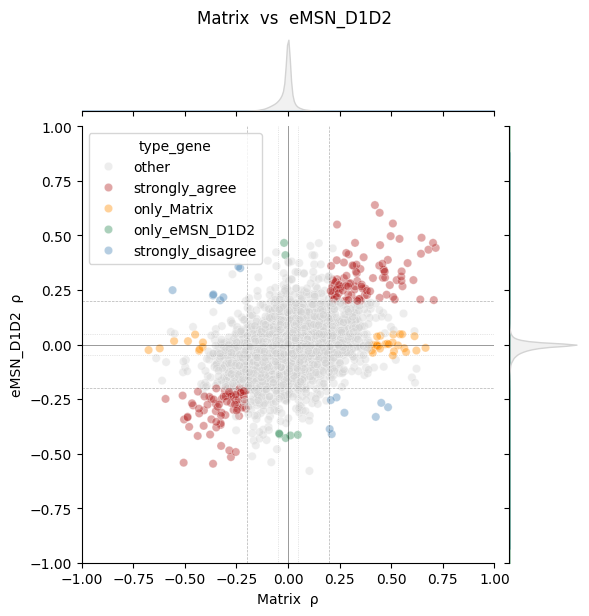

type_gene
other                36823
strongly_agree         175
only_Matrix             35
strongly_disagree       15
only_eMSN_D1D2           7
Name: Matrix vs eMSN_D1D2, dtype: int64

strongly_disagree


,rho_Matrix,rho_eMSN,padj_Matrix,padj_eMSN,pct_expr_Matrix,pct_expr_eMSN,mean_expr_Matrix,mean_expr_eMSN,type_gene
CDH12,-0.559469,0.249476,6.195953e-11,3.694570e-06,0.997587,0.972884,96.802323,44.110190,strongly_disagree
DPP10,0.484506,-0.287183,4.430169e-10,6.944180e-06,0.833608,0.940415,17.647798,43.974784,strongly_disagree
GRM3,0.451603,-0.267150,1.003064e-09,9.891489e-06,0.991560,0.404318,61.861394,2.791537,strongly_disagree
CHRM3,0.425031,-0.331573,4.943569e-10,3.430082e-07,0.704561,0.543351,32.216323,10.452677,strongly_disagree
SLC8A1,-0.363703,0.225188,4.077177e-09,3.956517e-05,0.999509,0.981520,115.458123,39.438860,strongly_disagree
UTRN,-0.361886,0.229998,8.102160e-10,1.586612e-04,0.985156,0.352332,31.496605,0.913644,strongly_disagree
MTUS1,-0.329025,0.202758,5.974384e-10,1.576767e-05,0.808288,0.982556,3.384856,15.403972,strongly_disagree
SEMA3E,-0.313494,0.216864,9.210948e-07,5.435673e-05,0.207047,0.405699,1.339677,3.276339,strongly_disagree
DMD,0.273151,-0.312610,6.144407e-07,1.310399e-06,0.973583,0.766149,21.701761,5.090674,strongly_disagree
SGCZ,-0.240382,0.356785,1.866145e-07,8.903278e-06,0.998005,0.753541,114.891175,32.035060,strongly_disagree


only_Matrix


,rho_Matrix,rho_eMSN,padj_Matrix,padj_eMSN,pct_expr_Matrix,pct_expr_eMSN,mean_expr_Matrix,mean_expr_eMSN,type_gene
PRKG1,-0.675724,-0.025147,1.910977e-12,0.590351,0.884124,0.292746,37.336763,1.049741,only_Matrix
TESPA1,0.666159,-0.015014,3.235924e-12,0.868253,0.572306,0.255613,6.724930,0.859067,only_Matrix
SLC24A2,0.621804,-0.027164,3.022298e-09,0.609464,0.994119,0.598964,90.518124,3.183592,only_Matrix
GDA,-0.621690,-0.017558,4.365864e-12,0.605687,0.651924,0.081002,3.903167,0.113472,only_Matrix
ENSG00000287923,0.612805,0.038271,5.624463e-12,0.276262,0.432468,0.093610,10.991685,0.610017,only_Matrix
SPOCK1,0.571618,-0.033898,7.054007e-11,0.380436,0.961277,0.393610,32.018646,1.136960,only_Matrix
ENSG00000286685,0.563011,-0.016612,4.301859e-10,0.730468,0.935246,0.182556,24.909957,0.577893,only_Matrix
SAMD5,0.552903,0.047240,1.746241e-11,0.175283,0.895061,0.157686,24.817522,0.813817,only_Matrix
ERC2,-0.552158,0.016211,4.365864e-12,0.654396,0.987361,0.909154,31.214620,9.002418,only_Matrix
KCND2,0.541629,0.047611,7.639458e-11,0.389482,0.998276,0.996718,176.574416,71.135751,only_Matrix


only_eMSN_D1D2


,rho_Matrix,rho_eMSN,padj_Matrix,padj_eMSN,pct_expr_Matrix,pct_expr_eMSN,mean_expr_Matrix,mean_expr_eMSN,type_gene
GRIK1,-0.019253,0.466006,0.164153,8.720329e-09,0.032727,0.801209,0.036383,105.874784,only_eMSN_D1D2
DIRC3-AS1,-0.011607,-0.428453,0.675177,3.457815e-09,0.998841,0.831088,108.498120,22.865803,only_eMSN_D1D2
CADPS,0.011392,-0.416569,0.824632,3.562680e-08,0.997451,0.997582,31.908871,34.741623,only_eMSN_D1D2
SOX2-OT,0.047072,-0.413943,0.024401,8.720329e-09,0.979965,0.997582,24.074416,84.345596,only_eMSN_D1D2
NDST4,-0.041252,-0.411229,0.020340,3.411469e-09,0.067167,0.223834,0.219759,1.894646,only_eMSN_D1D2
CALCRL,-0.012893,0.410119,0.580156,1.166354e-06,0.128776,0.625216,0.790279,8.564076,only_eMSN_D1D2
PDE3A,-0.043223,-0.407302,0.169688,3.135381e-08,0.944439,0.916235,8.404556,11.563212,only_eMSN_D1D2


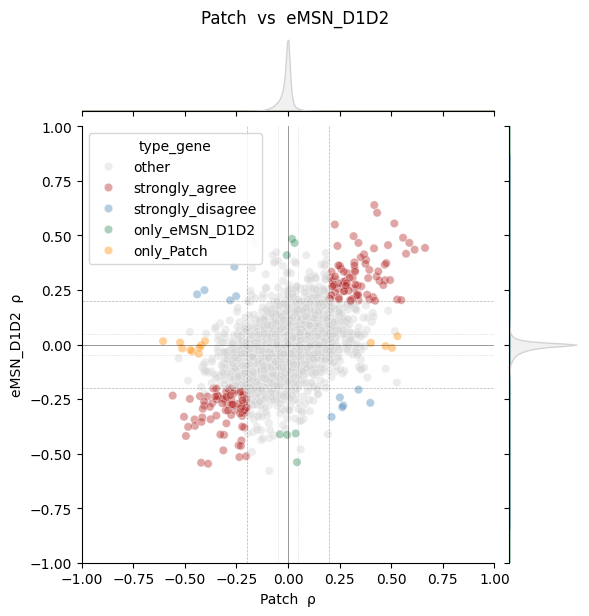

type_gene
other                36865
strongly_agree         159
only_Patch              13
strongly_disagree       11
only_eMSN_D1D2           7
Name: Patch vs eMSN_D1D2, dtype: int64

strongly_disagree


,rho_Patch,rho_eMSN,padj_Patch,padj_eMSN,pct_expr_Patch,pct_expr_eMSN,mean_expr_Patch,mean_expr_eMSN,type_gene
UTRN,-0.440610,0.229998,1.319787e-08,1.586612e-04,0.913428,0.352332,18.378636,0.913644,strongly_disagree
CDH12,-0.405076,0.249476,1.028933e-10,3.694570e-06,0.994647,0.972884,67.774843,44.110190,strongly_disagree
GRM3,0.398612,-0.267150,1.824827e-09,9.891489e-06,0.996684,0.404318,86.083372,2.791537,strongly_disagree
RGS12,0.341439,-0.206655,2.337961e-07,2.383190e-06,0.989237,0.824698,22.241564,3.127634,strongly_disagree
MTUS1,-0.280738,0.202758,5.341996e-09,1.576767e-05,0.842797,0.982556,3.792297,15.403972,strongly_disagree
BACH2,0.267570,-0.279138,1.552573e-05,3.108494e-07,0.880323,0.990328,21.062020,38.008463,strongly_disagree
DPP10,0.262545,-0.287183,3.990494e-06,6.944180e-06,0.717303,0.940415,10.123633,43.974784,strongly_disagree
SGCZ,-0.260190,0.356785,4.505237e-07,8.903278e-06,0.989586,0.753541,83.708052,32.035060,strongly_disagree
MAGI2,-0.251641,0.221537,8.559349e-08,1.815265e-07,0.998953,0.999309,87.988771,150.854231,strongly_disagree
DCBLD2,0.250922,-0.242285,4.493535e-09,8.857565e-07,0.829474,0.931088,3.718175,6.860622,strongly_disagree


only_Patch


,rho_Patch,rho_eMSN,padj_Patch,padj_eMSN,pct_expr_Patch,pct_expr_eMSN,mean_expr_Patch,mean_expr_eMSN,type_gene
RGS6,-0.605421,0.015617,1.691376e-10,0.570542,0.815685,0.105009,18.458692,0.181174,only_Patch
ENSG00000287923,0.530341,0.038271,1.105740e-10,0.276262,0.692053,0.093610,20.760298,0.610017,only_Patch
SEMA3A,-0.522722,0.009361,1.111559e-09,0.945185,0.859553,0.929706,11.149988,12.701382,only_Patch
GDA,-0.513075,-0.017558,1.691020e-10,0.605687,0.409879,0.081002,1.401501,0.113472,only_Patch
TESPA1,0.503698,-0.015014,9.322729e-10,0.868253,0.462183,0.255613,4.446183,0.859067,only_Patch
PRKG1,-0.473478,-0.025147,8.534873e-11,0.590351,0.807075,0.292746,22.695543,1.049741,only_Patch
DPP6,0.472526,-0.007023,7.793226e-11,0.987606,0.999942,0.999655,175.737957,88.386874,only_Patch
MYRIP,-0.463914,-0.031309,2.240304e-10,0.528967,0.792879,0.559585,6.303060,2.197409,only_Patch
PCDH11X,-0.432129,-0.042086,5.682043e-10,0.194155,0.718175,0.235924,23.708925,0.466494,only_Patch
LRMDA,-0.428549,-0.013144,6.361045e-10,0.541355,0.977601,0.187047,39.630498,0.551123,only_Patch


only_eMSN_D1D2


,rho_Patch,rho_eMSN,padj_Patch,padj_eMSN,pct_expr_Patch,pct_expr_eMSN,mean_expr_Patch,mean_expr_eMSN,type_gene
TENM3,0.043273,-0.539277,0.111862,7.501922e-10,0.995462,0.778066,44.402141,13.407081,only_eMSN_D1D2
GLI3,0.019183,0.484551,0.260881,2.010570e-07,0.073074,0.357858,0.094543,2.750432,only_eMSN_D1D2
GRIK1,0.031295,0.466006,0.094536,8.720329e-09,0.065802,0.801209,0.081859,105.874784,only_eMSN_D1D2
SOX2-OT,-0.005132,-0.413943,0.848132,8.720329e-09,0.982837,0.997582,25.698976,84.345596,only_eMSN_D1D2
NDST4,-0.039163,-0.411229,0.028200,3.411469e-09,0.040435,0.223834,0.059751,1.894646,only_eMSN_D1D2
CALCRL,-0.006175,0.410119,0.754087,1.166354e-06,0.047417,0.625216,0.103619,8.564076,only_eMSN_D1D2
PDE3A,0.037016,-0.407302,0.185428,3.135381e-08,0.945427,0.916235,9.205376,11.563212,only_eMSN_D1D2


In [3]:
THRESHOLD          = 0.2    # minimum |rho| to count as "has gradient"
THRESHOLD_SPECIFIC = 0.4    # minimum |rho| to count as "cell-type specific"
THRESHOLD_ONLY     = 0.05   # maximum |rho| to count as "truly absent"
PADJ_THR           = 0.05
MIN_PCT_EXPR       = 0.20   # require detection in ≥10% of cells to trust a gene's correlation
MIN_MEAN_EXPR      = 0.10   # require mean expression above this to trust a gene's correlation

# df_corr columns use "eMSN", not "eMSN_D1D2" — map so we can still iterate over the ct names
# used everywhere else (adata.obs["ct"], plot titles, "only_<ct>" labels).
col_label = {"Matrix": "Matrix", "Patch": "Patch", "eMSN_D1D2": "eMSN"}

from itertools import combinations
for ct_x, ct_y in combinations(["Matrix", "Patch", "eMSN_D1D2"], 2):

    lx, ly = col_label[ct_x], col_label[ct_y]
    rho_cx,   rho_cy   = f"rho_{lx}",       f"rho_{ly}"
    padj_cx,  padj_cy  = f"padj_{lx}",      f"padj_{ly}"
    pexpr_cx, pexpr_cy = f"pct_expr_{lx}",  f"pct_expr_{ly}"
    mexpr_cx, mexpr_cy = f"mean_expr_{lx}", f"mean_expr_{ly}"

    df = df_corr[[rho_cx, rho_cy, padj_cx, padj_cy, pexpr_cx, pexpr_cy, mexpr_cx, mexpr_cy]] \
            .dropna(subset=[rho_cx, rho_cy])

    x, y   = df[rho_cx], df[rho_cy]
    sig_x  = df[padj_cx] < PADJ_THR
    sig_y  = df[padj_cy] < PADJ_THR
    expr_x = (df[pexpr_cx] >= MIN_PCT_EXPR) & (df[mexpr_cx] >= MIN_MEAN_EXPR)
    expr_y = (df[pexpr_cy] >= MIN_PCT_EXPR) & (df[mexpr_cy] >= MIN_MEAN_EXPR)

    has_x  = (x.abs() >= THRESHOLD) & sig_x & expr_x
    has_y  = (y.abs() >= THRESHOLD) & sig_y & expr_y
    flat_x = x.abs() < THRESHOLD_ONLY
    flat_y = y.abs() < THRESHOLD_ONLY

    both_strong       = has_x & has_y
    strongly_agree    = both_strong & (np.sign(x) == np.sign(y))
    strongly_disagree = both_strong & (np.sign(x) != np.sign(y))
    only_x            = (x.abs() >= THRESHOLD_SPECIFIC) & sig_x & expr_x & flat_y
    only_y            = (y.abs() >= THRESHOLD_SPECIFIC) & sig_y & expr_y & flat_x

    df["type_gene"] = "other"
    df.loc[strongly_agree,    "type_gene"] = "strongly_agree"
    df.loc[strongly_disagree, "type_gene"] = "strongly_disagree"
    df.loc[only_x,            "type_gene"] = f"only_{ct_x}"
    df.loc[only_y,            "type_gene"] = f"only_{ct_y}"

    palette = {
        "strongly_agree":    "firebrick",
        "strongly_disagree": "steelblue",
        f"only_{ct_x}":      "darkorange",
        f"only_{ct_y}":      "seagreen",
        "other":             "lightgray",
    }

    g = sns.jointplot(
        data=df, x=rho_cx, y=rho_cy,
        hue="type_gene", palette=palette,
        alpha=0.4, height=6,
        marginal_kws=dict(fill=True, alpha=0.3),
        ylim=(-1, 1), xlim=(-1, 1)
    )
    for val in [-THRESHOLD, THRESHOLD]:
        g.ax_joint.axhline(val, color="k",    lw=0.5, ls="--", alpha=0.3)
        g.ax_joint.axvline(val, color="k",    lw=0.5, ls="--", alpha=0.3)
    for val in [-THRESHOLD_ONLY, THRESHOLD_ONLY]:
        g.ax_joint.axhline(val, color="gray", lw=0.5, ls=":",  alpha=0.4)
        g.ax_joint.axvline(val, color="gray", lw=0.5, ls=":",  alpha=0.4)
    g.ax_joint.axhline(0, color="k", lw=0.7, alpha=0.4)
    g.ax_joint.axvline(0, color="k", lw=0.7, alpha=0.4)
    g.ax_joint.set_xlabel(f"{ct_x}  ρ")
    g.ax_joint.set_ylabel(f"{ct_y}  ρ")
    g.figure.suptitle(f"{ct_x}  vs  {ct_y}", y=1.02, fontsize=12)
    plt.show()

    display(df["type_gene"].value_counts().rename(f"{ct_x} vs {ct_y}"))
    print("strongly_disagree")
    display(df[df["type_gene"] == "strongly_disagree"]
              .sort_values([rho_cx, rho_cy], key=np.abs, ascending=False))
    print(f"only_{ct_x}")
    display(df[df["type_gene"] == f"only_{ct_x}"]
              .sort_values(rho_cx, key=np.abs, ascending=False))
    print(f"only_{ct_y}")
    display(df[df["type_gene"] == f"only_{ct_y}"]
              .sort_values(rho_cy, key=np.abs, ascending=False))


In [ ]:
df_corr = df_corr.dropna()

df_corr["only_Patch"] = (df_corr["rho_Patch"].abs() >= 0.2) & (df_corr["padj_Patch"] < PADJ_THR) & (df_corr["rho_Matrix"].abs() < 0.1) & (df_corr["rho_eMSN"].abs() < 0.1)
display(df_corr[df_corr["only_Patch"]].sort_values("rho_Patch", key=np.abs, ascending=False))

df_corr["only_Matrix"] = (df_corr["rho_Matrix"].abs() >= 0.2) & (df_corr["padj_Matrix"] < PADJ_THR) & (df_corr["rho_Patch"].abs() < 0.1) & (df_corr["rho_eMSN"].abs() < 0.1)
display(df_corr[df_corr["only_Matrix"]].sort_values("rho_Matrix", key=np.abs, ascending=False))

df_corr["only_d1d2"] = (df_corr["rho_eMSN"].abs() >= 0.2) & (df_corr["padj_eMSN"] < PADJ_THR) & (df_corr["rho_Matrix"].abs() < 0.1) & (df_corr["rho_Patch"].abs() < 0.1)
display(df_corr[df_corr["only_d1d2"]].sort_values("rho_eMSN", key=np.abs, ascending=False))

df_corr["only_Matrix_and_Patch"] = (df_corr["rho_Matrix"].abs() >= 0.2) & (df_corr["padj_Matrix"] < PADJ_THR) & (df_corr["rho_Patch"].abs() >= 0.2) & (df_corr["padj_Patch"] < PADJ_THR) & (df_corr["rho_eMSN"].abs() < 0.1)
display(df_corr[df_corr["only_Matrix_and_Patch"]].sort_values(["rho_Matrix", "rho_Patch"], key=np.abs, ascending=False))

,rho_Matrix,padj_Matrix,rho_Patch,padj_Patch,rho_eMSN,padj_eMSN,only_Patch
GPC5,-0.043325,3.068349e-01,-0.323181,7.065462e-10,-0.090410,0.001557,True
PRICKLE1,0.044475,2.374817e-01,-0.306903,5.317911e-08,-0.048895,0.332137,True
ENSG00000285971,-0.009356,8.273815e-01,-0.300600,2.616751e-08,-0.027234,0.588103,True
NKAIN3,-0.000026,1.000000e+00,-0.276823,5.677075e-09,0.041730,0.398767,True
PLCH1,-0.091415,4.734200e-03,-0.257918,5.992124e-09,-0.028514,0.254925,True
NPAS3,-0.043991,1.649236e-01,-0.240565,6.183654e-07,0.071898,0.050866,True
STYK1,-0.076042,7.551959e-03,-0.237163,4.520100e-07,-0.048840,0.222435,True
CDH18,0.062522,3.882711e-02,-0.236085,4.082666e-06,-0.012496,0.879937,True
EPHA6,-0.083578,4.158516e-03,-0.234355,1.289655e-08,-0.083811,0.169149,True
ANKRD20A11P,-0.022936,6.346724e-01,-0.232664,1.059186e-05,-0.053864,0.014742,True


,rho_Matrix,padj_Matrix,rho_Patch,padj_Patch,rho_eMSN,padj_eMSN,only_Patch,only_Matrix
THSD4,0.445325,7.654148e-10,0.097018,9.942905e-04,-0.018462,0.636933,False,True
CPNE8,0.433549,4.405245e-09,-0.038400,6.432614e-02,-0.005585,0.963684,False,True
LINC02822,0.404345,4.966257e-08,-0.009421,5.678343e-01,-0.003069,1.000000,False,True
MPDZ,-0.351717,5.670480e-06,-0.033962,5.520077e-01,0.047757,0.247175,False,True
COL19A1,-0.336668,6.136001e-11,-0.087995,6.417013e-05,-0.007525,0.859901,False,True
TMEM117,-0.322470,3.925605e-09,-0.069025,8.471704e-03,0.022434,0.515462,False,True
ENSG00000289899,-0.319401,2.816602e-06,-0.087641,5.112046e-06,-0.021163,0.445419,False,True
WFDC2,0.318404,2.091139e-09,0.077753,4.247214e-05,0.058435,0.029783,False,True
LINC01378,0.304558,1.421531e-09,-0.046916,1.479878e-01,0.001374,1.000000,False,True
PTPRG,0.302149,6.096827e-07,0.051851,2.432976e-01,0.036921,0.430622,False,True


,rho_Matrix,padj_Matrix,rho_Patch,padj_Patch,rho_eMSN,padj_eMSN,only_Patch,only_Matrix,only_d1d2
TENM3,-0.081280,0.000124,0.034433,0.232212,-0.539277,7.501922e-10,False,False,True
SPATS2L,-0.053852,0.019631,0.044232,0.282437,-0.479768,6.082119e-10,False,False,True
GRIK1,-0.019253,0.164153,0.023218,0.225139,0.466006,8.720329e-09,False,False,True
DIRC3-AS1,-0.011607,0.675177,-0.086103,0.000260,-0.428453,3.457815e-09,False,False,True
CABP1,-0.057645,0.000491,-0.061160,0.002887,0.423006,7.501922e-10,False,False,True
...,...,...,...,...,...,...,...,...,...
SH3BGRL2,0.009761,0.610260,0.041430,0.060088,0.206410,1.280460e-06,False,False,True
PAG1,-0.061828,0.000404,-0.002648,0.937779,0.206094,2.799675e-06,False,False,True
DLG2,0.066659,0.059781,0.035248,0.165651,-0.201397,1.764273e-06,False,False,True
ENSG00000262801,0.068920,0.000904,0.042101,0.111248,-0.201085,2.721700e-07,False,False,True


,rho_Matrix,padj_Matrix,rho_Patch,padj_Patch,rho_eMSN,padj_eMSN,only_Patch,only_Matrix,only_d1d2,only_Matrix_and_Patch
PRKG1,-0.675724,1.910977e-12,-0.467982,2.023514e-10,-0.025147,0.590351,False,False,False,True
TESPA1,0.666159,3.235924e-12,0.490614,1.138196e-09,-0.015014,0.868253,False,False,False,True
ARHGAP6,-0.638756,1.063234e-11,-0.540947,1.326484e-11,-0.062528,0.146544,False,False,False,True
SLC24A2,0.621804,3.022298e-09,0.361642,6.348395e-05,-0.027164,0.609464,False,False,False,True
GDA,-0.621690,4.365864e-12,-0.516531,3.191956e-10,-0.017558,0.605687,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...
CCDC196,-0.204601,1.562692e-08,-0.210220,4.668814e-07,0.052004,0.211503,False,False,False,True
ADAM23,-0.204185,7.833642e-07,-0.244811,4.289903e-06,0.064564,0.085445,False,False,False,True
NINL,-0.203079,1.606631e-07,-0.206261,1.894969e-07,-0.074718,0.036614,False,False,False,True
GLRA2,-0.200905,5.092374e-10,-0.254873,3.362515e-09,-0.059014,0.035597,False,False,False,True


# Analyse distirbution

In [30]:
def reliable_and_sig(ct):
    return (
        (df_corr[f"padj_{ct}"]      < PADJ_THR) &
        (df_corr[f"pct_expr_{ct}"]  >= MIN_PCT_EXPR) &
        (df_corr[f"mean_expr_{ct}"] >= 0.1)
    )

interesting = reliable_and_sig("Matrix") | reliable_and_sig("Patch") | reliable_and_sig("eMSN")
df_corr_sig = df_corr[interesting].copy()
print(f"{len(df_corr_sig)} / {len(df_corr)} genes pass")


11151 / 37055 genes pass


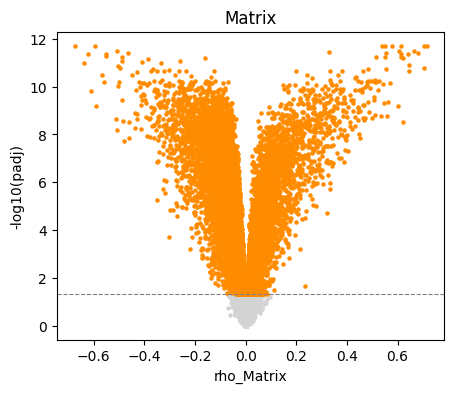

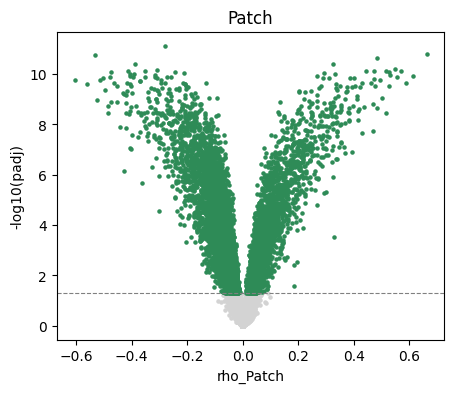

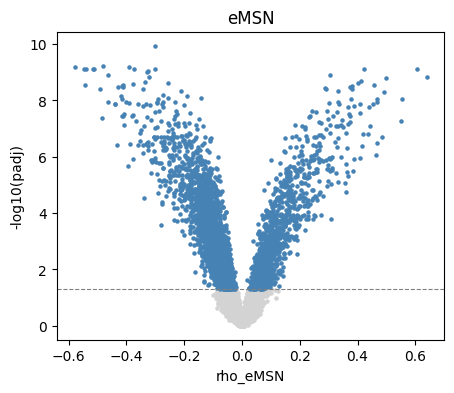

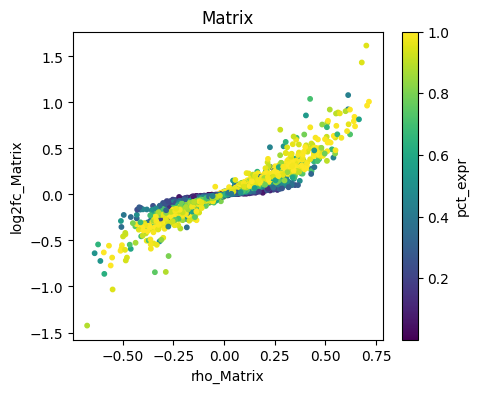

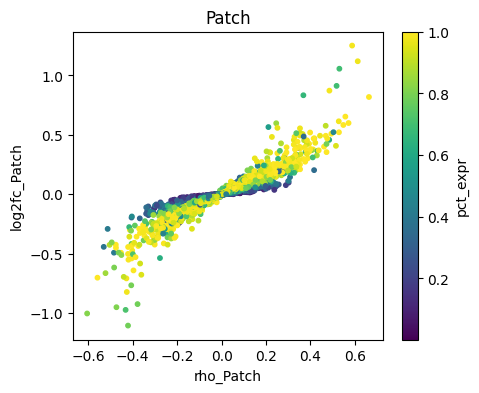

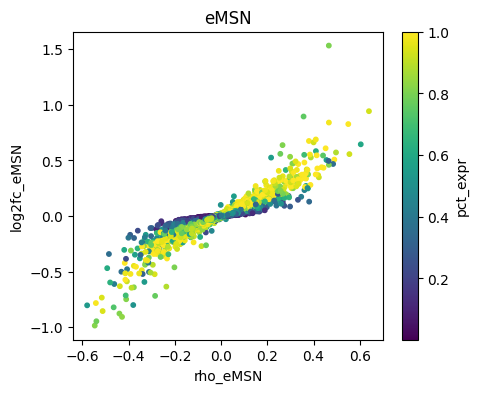

In [32]:
for ct, col in zip(["Matrix", "Patch", "eMSN"], ["darkorange", "seagreen", "steelblue"]):
    plt.figure(figsize=(5, 4))
    sig = df_corr[f"padj_{ct}"] < PADJ_THR
    plt.scatter(df_corr[f"rho_{ct}"][~sig], -np.log10(df_corr[f"padj_{ct}"][~sig]), s=5, c="lightgrey")
    plt.scatter(df_corr[f"rho_{ct}"][sig],  -np.log10(df_corr[f"padj_{ct}"][sig]),  s=5, c=col)
    plt.axhline(-np.log10(PADJ_THR), ls="--", c="grey", lw=0.8)
    plt.xlabel(f"rho_{ct}"); plt.ylabel("-log10(padj)"); plt.title(ct)
    plt.show()

for ct in ["Matrix", "Patch", "eMSN"]:
    plt.figure(figsize=(5, 4))
    sc_plot = plt.scatter(df_corr_sig[f"rho_{ct}"], df_corr_sig[f"log2fc_{ct}"],
                           c=df_corr_sig[f"pct_expr_{ct}"], cmap="viridis", s=10)
    plt.colorbar(sc_plot, label="pct_expr")
    plt.xlabel(f"rho_{ct}"); plt.ylabel(f"log2fc_{ct}"); plt.title(ct)
    plt.show()


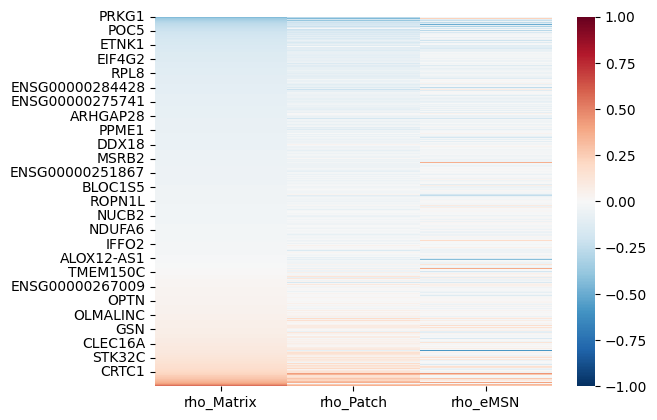

In [33]:
sns.heatmap(df_corr_sig[["rho_Matrix", "rho_Patch", "rho_eMSN"]].sort_values("rho_Matrix"),
            cmap="RdBu_r", center=0, vmin=-1, vmax=1)
plt.show()


# RISK FACTOR
HIGH in DORSAL Matrix+Patch (rho>0), flat in eMSN

gene highest where degeneration starts; eMSN spared without it


,rho_Matrix,log2fc_Matrix,pct_expr_Matrix,mean_expr_Matrix,rho_Patch,log2fc_Patch,pct_expr_Patch,mean_expr_Patch,rho_eMSN,log2fc_eMSN,pct_expr_eMSN,mean_expr_eMSN
ENSG00000287923,0.612805,1.079626,0.432468,10.991685,0.530341,1.054976,0.692053,20.760298,0.038271,0.019556,0.093610,0.610017
VLDLR-AS1,0.614983,0.762711,0.963043,18.286341,0.527626,0.612905,0.982255,21.158541,-0.174748,-0.191329,0.921071,8.348359
ENSG00000286780,0.612531,0.925188,0.437680,8.726873,0.517791,0.910736,0.693216,17.052537,0.061419,0.020594,0.079102,0.482729
TESPA1,0.666159,0.816381,0.572306,6.724930,0.503698,0.521324,0.462183,4.446183,-0.015014,-0.018321,0.255613,0.859067
SEMA6D,0.343474,0.629362,0.914950,40.128557,0.485505,0.870740,0.984175,99.648708,0.154941,0.221851,0.999136,223.498273
GRIN2A,0.396019,0.651253,0.786748,14.959836,0.365065,0.505854,0.945485,23.112520,0.122930,0.114516,0.997237,63.039724
IQCA1,0.405571,0.534050,0.928530,11.200549,0.354004,0.514050,0.929428,12.833721,-0.026104,-0.023399,0.758549,3.005181
COL25A1,0.522129,0.922279,0.879204,23.394696,0.353005,0.553815,0.973528,43.180882,-0.070147,-0.045691,0.477547,2.127116
TRPC6,0.507897,0.730574,0.653909,9.547424,0.336368,0.513004,0.737666,12.808820,-0.049775,-0.032018,0.183765,0.702936
PTPRM,0.277599,0.703546,0.919954,46.646941,0.251377,0.557837,0.963172,50.909763,-0.074408,-0.071548,0.981520,27.585492


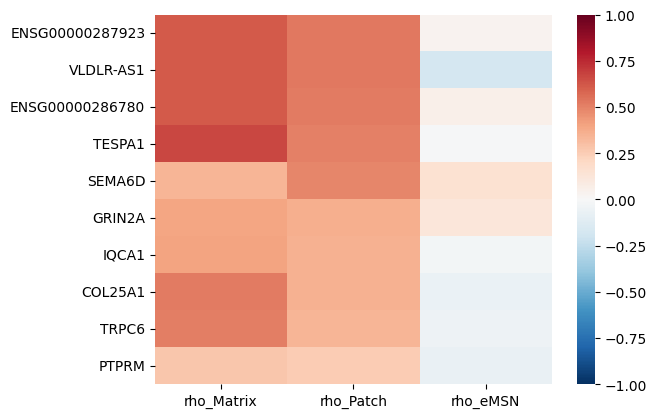

In [40]:
MIN_CORR = 0.2
MIN_LOGFC = 0.5
MIN_PCT_EXPR = 0.2
MIN_MEAN_EXPR = 0.1

df_risk_factors = df_corr[
    (df_corr["rho_Matrix"] >= MIN_CORR) & (df_corr["rho_Patch"] >= MIN_CORR) & # corr big enight in matrix and patch
    (df_corr["rho_eMSN"].abs() <= MIN_CORR) & # no correlation in d1d2
    (df_corr["log2fc_Matrix"].abs() >= MIN_LOGFC) & (df_corr["log2fc_Patch"].abs() >= MIN_LOGFC) & # logfc big enough
    ((df_corr["padj_Matrix"] < 0.05) & (df_corr["padj_Patch"] < 0.05)) & # significant in at least one cell type
    (df_corr["pct_expr_Matrix"] >= MIN_PCT_EXPR) & (df_corr["pct_expr_Patch"] >= MIN_PCT_EXPR) &# sufficient expression in both cell types
    (df_corr["mean_expr_Matrix"] >= MIN_MEAN_EXPR) & (df_corr["mean_expr_Patch"] >= MIN_MEAN_EXPR) # sufficient mean expression in both cell types
].copy()

df_risk_factors = df_risk_factors[["rho_Matrix", "log2fc_Matrix", "pct_expr_Matrix", "mean_expr_Matrix",
                 "rho_Patch", "log2fc_Patch", "pct_expr_Patch", "mean_expr_Patch",
                 "rho_eMSN", "log2fc_eMSN", "pct_expr_eMSN", "mean_expr_eMSN"]].sort_values("rho_Patch", key=np.abs, ascending=False)
display(df_risk_factors)

sns.heatmap(df_risk_factors[["rho_Matrix", "rho_Patch", "rho_eMSN"]], cmap="RdBu_r", center=0, vmin=-1, vmax=1)
plt.show()



# NEUROPROTECTIVE
HIGH in VENTRAL Matrix+Patch (rho<0), flat in eMSN

gene protects surviving ventral cells; its ABSENCE in dorsal explains why dorsal dies first


,rho_Matrix,log2fc_Matrix,pct_expr_Matrix,mean_expr_Matrix,rho_Patch,log2fc_Patch,pct_expr_Patch,mean_expr_Patch,rho_eMSN,log2fc_eMSN,pct_expr_eMSN,mean_expr_eMSN
RGS6,-0.484906,-0.717364,0.935006,26.549806,-0.605421,-1.002552,0.815685,18.458692,0.015617,0.000792,0.105009,0.181174
PRKG1,-0.675724,-1.424804,0.884124,37.336763,-0.473478,-0.949846,0.807075,22.695543,-0.025147,-0.047182,0.292746,1.049741
PCDH11X,-0.361226,-0.589449,0.980842,73.632129,-0.432129,-0.972269,0.718175,23.708925,-0.042086,-0.022963,0.235924,0.466494
ENSG00000228566,-0.287417,-0.841796,0.884051,64.970814,-0.421332,-1.104226,0.784035,26.892949,-0.003718,0.007418,0.993782,135.523143
HCN1,-0.590887,-0.863062,0.632735,8.003134,-0.399319,-0.504367,0.717477,6.881022,-0.080260,-0.100442,0.984111,20.656649
GALNTL6,-0.549985,-1.032399,0.949097,50.577581,-0.396698,-0.640555,0.993717,82.581627,0.050273,0.064524,0.999827,388.358377
AGBL1,-0.273631,-0.669314,0.799074,25.278517,-0.277488,-0.536595,0.627414,9.455201,0.012183,0.013524,0.328670,1.102245


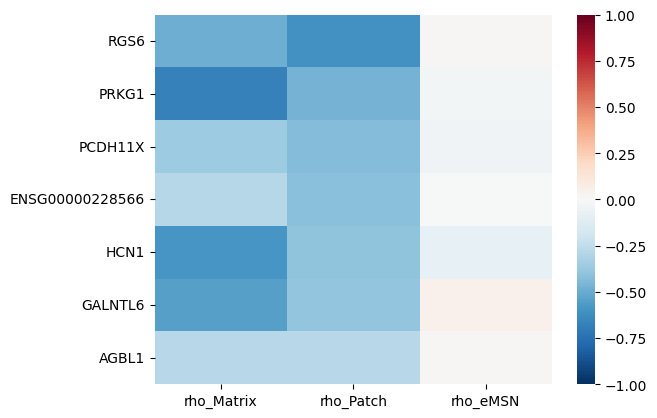

In [39]:
df_protection = df_corr[
    (df_corr["rho_Matrix"] <= -MIN_CORR) & (df_corr["rho_Patch"] <= - MIN_CORR) & # corr big enight in matrix and patch
    (df_corr["rho_eMSN"].abs() <= MIN_CORR) & # no correlation in d1d2
    (df_corr["log2fc_Matrix"].abs() >= MIN_LOGFC) & (df_corr["log2fc_Patch"].abs() >= MIN_LOGFC) & # logfc big enough
    ((df_corr["padj_Matrix"] < 0.05) & (df_corr["padj_Patch"] < 0.05)) & # significant in at least one cell type
    (df_corr["pct_expr_Matrix"] >= MIN_PCT_EXPR) & (df_corr["pct_expr_Patch"] >= MIN_PCT_EXPR) &# sufficient expression in both cell types
    (df_corr["mean_expr_Matrix"] >= MIN_MEAN_EXPR) & (df_corr["mean_expr_Patch"] >= MIN_MEAN_EXPR) # sufficient mean expression in both cell types
].copy()

df_protection = df_protection[["rho_Matrix", "log2fc_Matrix", "pct_expr_Matrix", "mean_expr_Matrix",
                 "rho_Patch", "log2fc_Patch", "pct_expr_Patch", "mean_expr_Patch",
                 "rho_eMSN", "log2fc_eMSN", "pct_expr_eMSN", "mean_expr_eMSN"]].sort_values("rho_Patch", key=np.abs, ascending=False)
display(df_protection)

sns.heatmap(df_protection[["rho_Matrix", "rho_Patch", "rho_eMSN"]], cmap="RdBu_r", center=0, vmin=-1, vmax=1)
plt.show()

# Patch first
instead of requiring Matrix and Patch equally (which biases toward pan-MSN genes), it surfaces genes selectively patterned in the striosome compartment that gives way first. 

,rho_Matrix,padj_Matrix,rho_Patch,padj_Patch,rho_eMSN,padj_eMSN,pct_expr_Matrix,pct_expr_Patch,pct_expr_eMSN,mean_expr_Matrix,mean_expr_Patch,mean_expr_eMSN,log2fc_Matrix,log2fc_Patch,log2fc_eMSN,patch_dominance
SEMA3A,-0.325313,1.920996e-06,-0.522722,1.111559e-09,0.009361,0.945185,0.942402,0.859553,0.929706,14.294886,11.149988,12.701382,-0.381114,-0.663456,0.010941,0.197409
SEMA6D,0.343474,1.515985e-07,0.485505,2.283225e-09,0.154941,0.000020,0.914950,0.984175,0.999136,40.128557,99.648708,223.498273,0.629362,0.870740,0.221851,0.142031
ENSG00000228566,-0.287417,1.475358e-05,-0.421332,6.677854e-10,-0.003718,1.000000,0.884051,0.784035,0.993782,64.970814,26.892949,135.523143,-0.841796,-1.104226,0.007418,0.133915
LRMDA,-0.299984,1.666484e-08,-0.428549,6.361045e-10,-0.013144,0.541355,0.963774,0.977601,0.187047,28.442161,39.630498,0.551123,-0.470835,-0.707573,-0.023969,0.128565
RGS6,-0.484906,2.655137e-09,-0.605421,1.691376e-10,0.015617,0.570542,0.935006,0.815685,0.105009,26.549806,18.458692,0.181174,-0.717364,-1.002552,0.000792,0.120515
PCDH11X,-0.361226,3.968472e-09,-0.432129,5.682043e-10,-0.042086,0.194155,0.980842,0.718175,0.235924,73.632129,23.708925,0.466494,-0.589449,-0.972269,-0.022963,0.070903
AGBL1,-0.273631,1.343108e-07,-0.277488,1.719906e-07,0.012183,0.830067,0.799074,0.627414,0.328670,25.278517,9.455201,1.102245,-0.669314,-0.536595,0.013524,0.003857
PTPRM,0.277599,3.277796e-10,0.251377,1.367685e-09,-0.074408,0.030800,0.919954,0.963172,0.981520,46.646941,50.909763,27.585492,0.703546,0.557837,-0.071548,-0.026222
GRIN2A,0.396019,1.636649e-08,0.365065,8.311601e-08,0.122930,0.004240,0.786748,0.945485,0.997237,14.959836,23.112520,63.039724,0.651253,0.505854,0.114516,-0.030954
IQCA1,0.405571,7.133144e-10,0.354004,5.267765e-08,-0.026104,0.446366,0.928530,0.929428,0.758549,11.200549,12.833721,3.005181,0.534050,0.514050,-0.023399,-0.051567


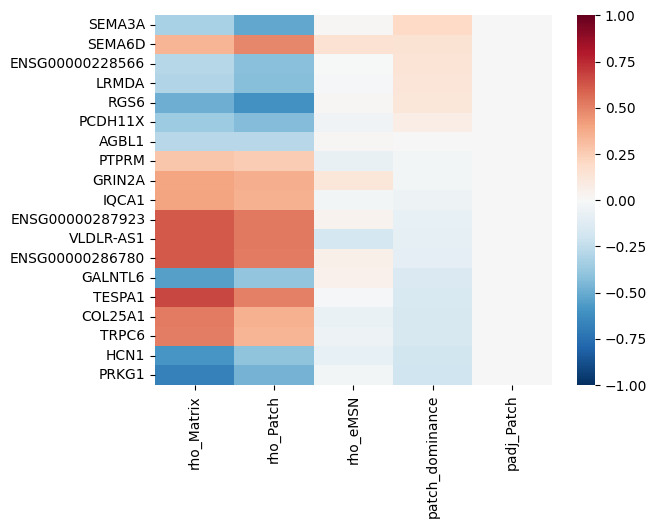

In [49]:
MIN_CORR, MIN_LOGFC, MIN_PCT, MIN_MEAN = 0.2, 0.5, 0.2, 0.1

xdp = df_corr[
    (df_corr["rho_Patch"].abs()      >= MIN_CORR) &   # spatial patterning in striosome (first hit)
    (df_corr["log2fc_Patch"].abs()   >= MIN_LOGFC) &
    (df_corr["rho_eMSN"].abs()       <= MIN_CORR) &   # eMSN flat = assumed less-affected control
    (df_corr["pct_expr_Patch"]       >= MIN_PCT) &
    (df_corr["mean_expr_Patch"]      >= MIN_MEAN)
].copy()

# patch-dominant genes: patterned in the compartment that degenerates early, less so in matrix
#"strongly graded in the striosome, weakly graded in the matrix" — a patch-preferential gene.
xdp["patch_dominance"] = xdp["rho_Patch"].abs() - xdp["rho_Matrix"].abs() #how much more strongly a gene is spatially patterned in patch than in matrix.

sns.heatmap(xdp[["rho_Matrix", "rho_Patch", "rho_eMSN", "patch_dominance", "padj_Patch"]].sort_values("patch_dominance", ascending=False), cmap="RdBu_r", center=0, vmin=-1, vmax=1)
xdp.sort_values("patch_dominance", ascending=False)

# GSEA

In [50]:
import gseapy as gp
import numpy as np

def make_rank(df, rho_col="rho", pval_col="pval", min_pct_expr=0.2, min_mean_expr=0.1):
    reliable = (df["pct_expr"] >= min_pct_expr) & (df["mean_expr"] >= min_mean_expr)
    rank = df.loc[reliable, rho_col] * -np.log10(df.loc[reliable, pval_col].clip(lower=1e-300))
    return rank.dropna().sort_values(ascending=False)

rnk = make_rank(df_corr_r_matrix)  # swap in df_corr_r_patch / df_corr_r_d1d2 for the other cell types
display(rnk.head(20))

pre_res = gp.prerank(
    rnk=rnk,
    gene_sets="Reactome_Pathways_2024",   # or "MSigDB_Hallmark_2020", or a local .gmt path
    min_size=5,
    max_size=500,
    permutation_num=100,
    seed=0,
    outdir=None,   # keep in memory, skip writing report files to disk
)

pre_res.res2d.sort_values("NES", ascending=False).head(20)


PDE10A             11.522453
PLCB1              10.939531
OPCML              10.098802
TESPA1             10.062074
ZNF385B             9.701833
VLDLR-AS1           9.474772
LARGE1              9.395457
SRGAP1              9.119117
TTLL11              8.999649
RYR3                8.992344
ENSG00000286780     8.988362
PLEKHA7             8.951325
ENSG00000287923     8.852272
EPB41               8.730010
GPRIN3              8.453128
GLI3                8.410248
DACH1               8.209663
SCARB1              7.946373
SAMD5               7.600731
AFF3                7.471499
dtype: float64

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,G-protein Beta Gamma Signalling,0.823573,1.877977,0.0,0.162825,0.09,4/18,2.72%,PLCB1;GNG7;GNB5;GNB1
1,prerank,Activation of Kainate Receptors Upon Glutamate...,0.810078,1.845849,0.0,0.158302,0.14,7/18,3.92%,PLCB1;GNG7;GNB5;GNB1;GRIK4;GRIK3;GRIK5
2,prerank,Presynaptic Function of Kainate Receptors,0.881151,1.841388,0.0,0.105535,0.14,5/11,3.86%,PLCB1;GNG7;GNB5;GNB1;GRIK3
3,prerank,G Beta Gamma Signalling Through PLC Beta,0.887218,1.825926,0.0,0.099504,0.17,4/10,2.72%,PLCB1;GNG7;GNB5;GNB1
4,prerank,G Beta Gamma Signalling Through PI3Kgamma,0.861,1.825306,0.0,0.081413,0.18,3/13,2.72%,GNG7;GNB5;GNB1
12,prerank,EPHA-mediated Growth Cone Collapse,0.711947,1.74048,0.0,0.212578,0.52,8/20,9.48%,EPHA5;NGEF;MYH10;ROCK2;EPHA4;EPHA3;MYH9;MYH14
14,prerank,Transcriptional Regulation by the AP-2 (TFAP2)...,0.747545,1.730991,0.0,0.206762,0.54,5/19,9.39%,EGFR;KCTD1;TGFA;VEGFA;WWOX
15,prerank,Inwardly Rectifying K+ Channels,0.790923,1.729774,0.0,0.184309,0.55,3/16,2.72%,GNG7;GNB5;GNB1
18,prerank,ERBB2 Regulates Cell Motility,0.882901,1.71228,0.027027,0.192978,0.58,3/10,3.65%,ERBB4;EGFR;NRG3
19,prerank,Presynaptic Depolarization and Calcium Channel...,0.854664,1.71148,0.0,0.176394,0.58,5/12,6.47%,CACNA2D3;CACNA1B;CACNG2;CACNB4;CACNA1A


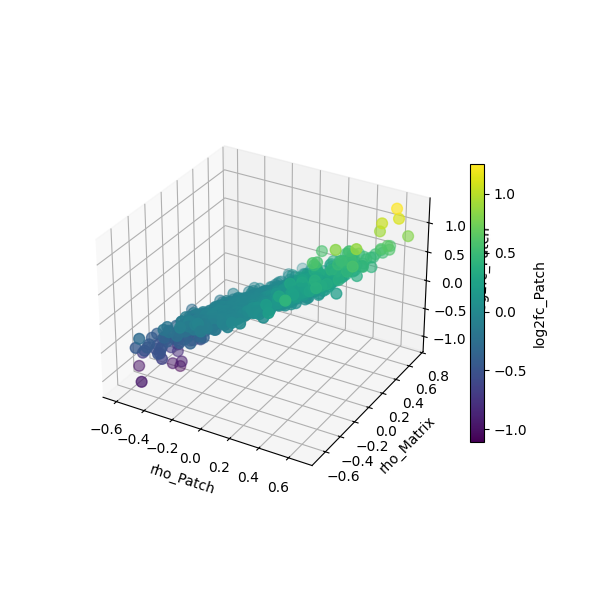

In [65]:
%matplotlib widget
import matplotlib.pyplot as plt

genes = df_corr_sig.index.tolist()
df_plot = df_corr.loc[genes].reset_index().rename(columns={"index": "gene"})

fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(111, projection="3d")
sc = ax.scatter(df_plot["rho_Patch"], df_plot["rho_Matrix"], df_plot["log2fc_Patch"],
                 c=df_plot["log2fc_Patch"], cmap="viridis", s=60, picker=True, pickradius=5)
ax.set_xlabel("rho_Patch"); ax.set_ylabel("rho_Matrix"); ax.set_zlabel("log2fc_Patch")
fig.colorbar(sc, shrink=0.6, label="log2fc_Patch")

label = ax.text2D(0.02, 0.98, "", transform=ax.transAxes, va="top")

def on_pick(event):
    label.set_text(df_plot["gene"].iloc[event.ind[0]])
    fig.canvas.draw_idle()

fig.canvas.mpl_connect("pick_event", on_pick)
plt.show()


In [68]:
df_corr[df_corr.index.isin(["ZNF385B", "MSH3", "ZNF91", "PMS2", "OGT", "TAF1"])]

,rho_Matrix,padj_Matrix,rho_Patch,padj_Patch,rho_eMSN,padj_eMSN,pct_expr_Matrix,pct_expr_Patch,pct_expr_eMSN,mean_expr_Matrix,mean_expr_Patch,mean_expr_eMSN,log2fc_Matrix,log2fc_Patch,log2fc_eMSN
MSH3,0.107024,1.450917e-06,0.038947,9.939302e-04,-0.079728,3.525554e-04,0.980205,0.978415,0.926943,13.182823,13.123342,6.066839,0.089923,0.025181,-0.061933
OGT,0.061431,2.032348e-01,0.015918,7.518050e-01,-0.073980,1.995864e-02,0.986034,0.982430,0.953713,13.976246,13.644927,7.794991,0.051750,0.003995,-0.052811
PMS2,-0.061922,3.867389e-06,-0.035830,1.781774e-03,-0.029619,3.958022e-01,0.692245,0.693216,0.586874,1.460055,1.487782,1.053886,-0.029471,-0.014849,-0.015601
TAF1,0.056139,6.471807e-03,0.027723,1.358261e-01,-0.020365,4.918771e-01,0.932144,0.930300,0.882383,5.314002,5.365662,3.889465,0.033050,0.016087,-0.019826
ZNF385B,0.702494,1.592174e-11,0.587742,2.240304e-10,0.466287,1.176511e-08,0.950194,0.981091,0.982902,108.584778,110.636200,94.402763,1.617642,1.249429,0.839037
ZNF91,0.126037,4.660195e-05,0.042161,1.894628e-01,-0.092546,1.142695e-03,0.997347,0.997789,0.984283,20.725661,20.828194,11.057858,0.092363,0.037339,-0.063887


# Confront XDP Vs BICAN

In [191]:
# merge 2 df
df_corr_merged = df_corr.merge(df_corr_xdp, left_index=True, right_index=True, suffixes=("", "_xdp"))
df_corr_merged
df_corr_merged[df_corr_merged.index.isin(["ZNF385B", "MSH3", "ZNF91", "PMS2", "OGT", "TAF1", "ZNF98"])][["rho_Matrix", "rho_Patch", "rho_eMSN", "rho_Matrix_xdp", "rho_Patch_xdp", "rho_eMSN_xdp"]]

,rho_Matrix,rho_Patch,rho_eMSN,rho_Matrix_xdp,rho_Patch_xdp,rho_eMSN_xdp
MSH3,0.107024,0.038947,-0.079728,0.075888,0.030840,-0.023451
OGT,0.061431,0.015918,-0.073980,0.261410,0.007729,-0.245433
PMS2,-0.061922,-0.035830,-0.029619,-0.018988,0.034933,-0.097092
TAF1,0.056139,0.027723,-0.020365,0.037948,0.084132,0.086880
ZNF385B,0.702494,0.587742,0.466287,0.480778,0.209622,0.592796
ZNF91,0.126037,0.042161,-0.092546,0.107735,0.079184,0.093575
ZNF98,-0.053238,-0.066162,-0.029753,-0.009637,-0.000027,-0.014553


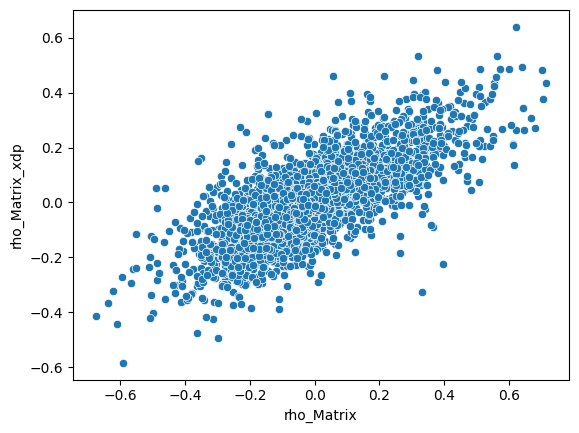

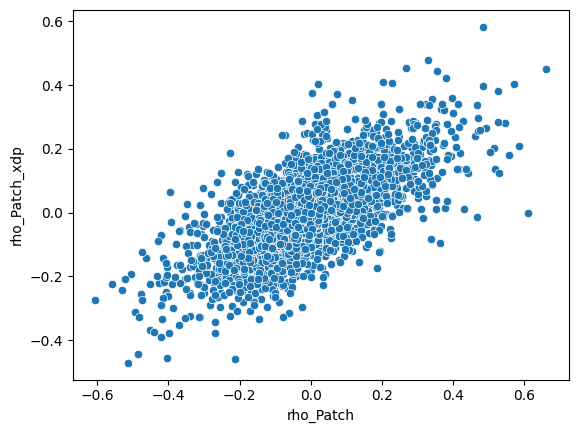

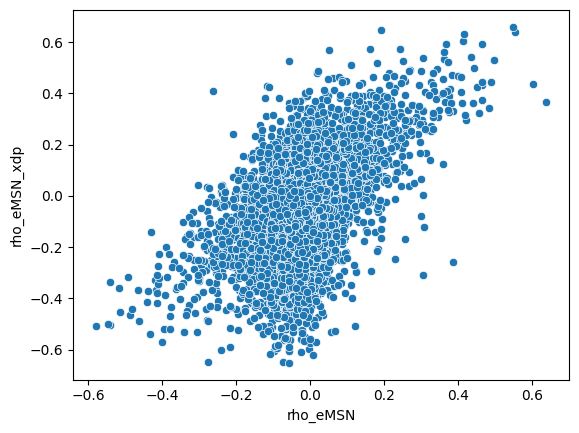

In [192]:
# Matrix
%matplotlib inline
sns.scatterplot(data=df_corr_merged, x="rho_Matrix", y="rho_Matrix_xdp",);plt.show()
sns.scatterplot(data=df_corr_merged, x="rho_Patch", y="rho_Patch_xdp",);plt.show()
sns.scatterplot(data=df_corr_merged, x="rho_eMSN", y="rho_eMSN_xdp", );plt.show()


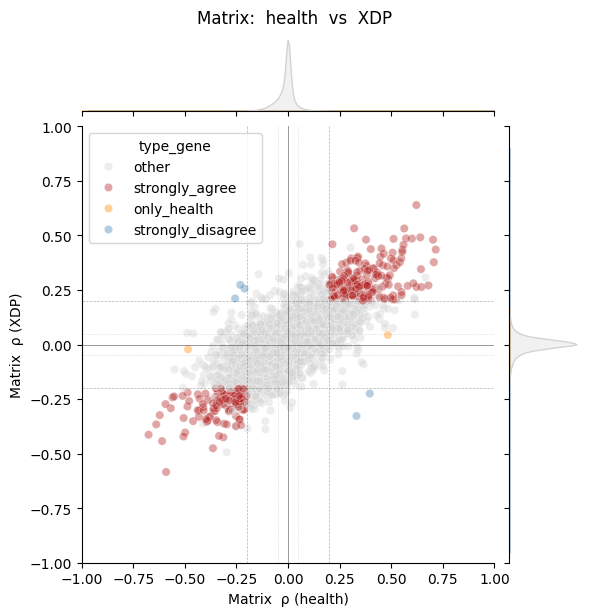

type_gene
other                33303
strongly_agree         300
strongly_disagree        5
only_health              2
Name: Matrix: health vs XDP, dtype: int64

strongly_disagree (reversed)


,rho_health,rho_XDP,padj_health,padj_XDP,pct_expr_health,pct_expr_XDP,mean_expr_health,mean_expr_XDP,type_gene
GRIN2A,0.396019,-0.224637,1.636649e-08,1.138592e-51,0.786748,0.762081,14.959836,6.757945,strongly_disagree
PDE8B,0.331519,-0.327356,1.039143e-06,1.219276e-112,0.952942,0.954724,13.855012,7.982804,strongly_disagree
UNC80,-0.256531,0.211249,5.321883e-08,1.371490e-45,0.999634,1.000000,50.782737,26.880714,strongly_disagree
RAPGEF5,-0.231518,0.273489,1.644468e-06,2.281687e-77,0.998861,0.999565,78.942423,47.018285,strongly_disagree
ENSG00000259336,-0.210834,0.256380,1.959071e-04,1.008052e-67,0.989377,0.992599,38.862011,32.267305,strongly_disagree


only_health (lost in XDP)


,rho_health,rho_XDP,padj_health,padj_XDP,pct_expr_health,pct_expr_XDP,mean_expr_health,mean_expr_XDP,type_gene
RGS6,-0.484906,-0.021582,2.655137e-09,0.318766,0.935006,0.990640,26.549806,21.532434,only_health
ARHGAP10,0.483479,0.044441,1.901901e-11,0.012410,0.694762,0.394428,4.675856,0.948629,only_health


only_XDP (gained in XDP)


,rho_health,rho_XDP,padj_health,padj_XDP,pct_expr_health,pct_expr_XDP,mean_expr_health,mean_expr_XDP,type_gene


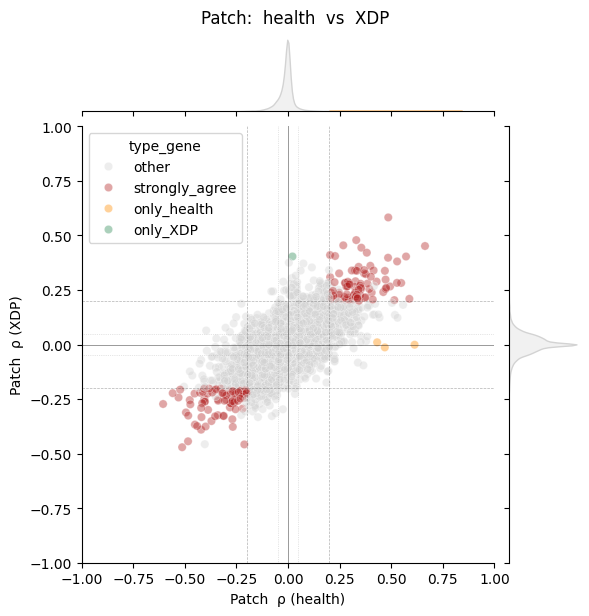

type_gene
other             33445
strongly_agree      161
only_health           3
only_XDP              1
Name: Patch: health vs XDP, dtype: int64

strongly_disagree (reversed)


,rho_health,rho_XDP,padj_health,padj_XDP,pct_expr_health,pct_expr_XDP,mean_expr_health,mean_expr_XDP,type_gene


only_health (lost in XDP)


,rho_health,rho_XDP,padj_health,padj_XDP,pct_expr_health,pct_expr_XDP,mean_expr_health,mean_expr_XDP,type_gene
OPCML,0.613051,-0.000708,1.236787e-10,1.000000,0.976495,0.961062,92.277985,40.829204,only_health
PDE8B,0.468729,-0.012891,1.842066e-08,0.952540,0.900628,0.870796,9.551315,4.770796,only_health
ELL2,0.431630,0.010466,2.116767e-08,0.987128,0.694671,0.661947,4.250931,3.238938,only_health


only_XDP (gained in XDP)


,rho_health,rho_XDP,padj_health,padj_XDP,pct_expr_health,pct_expr_XDP,mean_expr_health,mean_expr_XDP,type_gene
MT-ATP6,0.021331,0.403869,0.700547,3.702008e-42,0.818769,0.841593,7.753724,3.610619,only_XDP


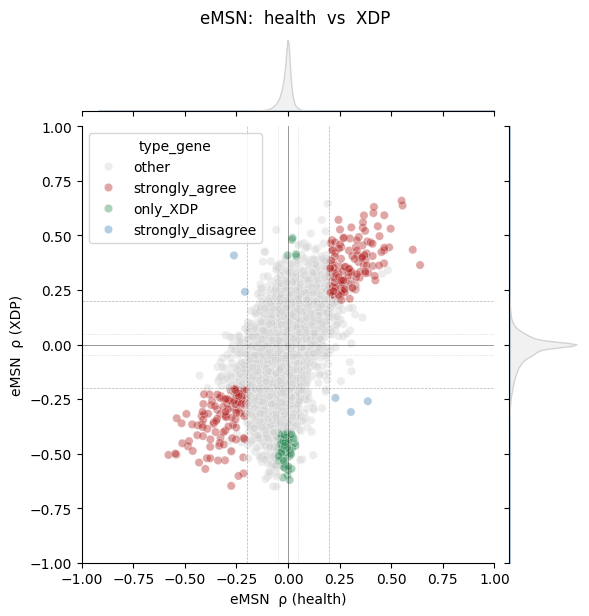

type_gene
other                33263
strongly_agree         253
only_XDP                89
strongly_disagree        5
Name: eMSN: health vs XDP, dtype: int64

strongly_disagree (reversed)


,rho_health,rho_XDP,padj_health,padj_XDP,pct_expr_health,pct_expr_XDP,mean_expr_health,mean_expr_XDP,type_gene
MALAT1,0.386562,-0.259973,0.000001,2.063667e-13,1.000000,1.000000,2919.851986,1391.228374,strongly_disagree
CAMK2N1,0.304682,-0.308935,0.000003,5.589464e-19,0.942142,0.908881,10.052504,4.287197,strongly_disagree
RBFOX1,-0.262299,0.408595,0.000025,4.263048e-34,1.000000,0.998847,657.303972,340.875433,strongly_disagree
MIR124-1HG,0.229559,-0.244493,0.000035,6.839268e-12,0.989292,0.988466,16.748359,11.760092,strongly_disagree
CELF4,-0.208687,0.241923,0.000180,1.194779e-11,0.996028,0.995386,22.730397,14.217993,strongly_disagree


only_health (lost in XDP)


,rho_health,rho_XDP,padj_health,padj_XDP,pct_expr_health,pct_expr_XDP,mean_expr_health,mean_expr_XDP,type_gene


only_XDP (gained in XDP)


,rho_health,rho_XDP,padj_health,padj_XDP,pct_expr_health,pct_expr_XDP,mean_expr_health,mean_expr_XDP,type_gene
CALM1,0.007395,-0.620880,1.000000,6.377231e-90,0.988946,0.973472,27.095682,17.935409,only_XDP
HSPA8,-0.024703,-0.609803,0.734029,6.863008e-86,0.569430,0.642445,1.544732,1.889273,only_XDP
ATP6V0C,-0.002730,-0.598202,1.000000,6.508302e-82,0.784283,0.708189,3.294301,2.232987,only_XDP
CTXN1,0.001528,-0.575948,1.000000,1.367077e-74,0.744214,0.692042,2.493092,1.943483,only_XDP
GAPDH,0.016677,-0.569305,0.870135,1.574673e-72,0.750259,0.710496,3.267530,2.516724,only_XDP
...,...,...,...,...,...,...,...,...,...
CHGB,-0.014564,-0.402228,0.819762,5.833723e-33,0.573575,0.479815,1.338860,0.951557,only_XDP
ATP6V1G1,-0.037515,-0.402218,0.406968,5.836892e-33,0.516408,0.508651,0.929706,0.825836,only_XDP
MARCKSL1,-0.036344,-0.402166,0.195316,5.942721e-33,0.031088,0.265283,0.037478,0.388697,only_XDP
PREPL,-0.033401,-0.400751,0.532794,1.048610e-32,0.984629,0.960784,13.160967,6.626298,only_XDP


In [4]:
THRESHOLD          = 0.2    # minimum |rho| to count as "has gradient"
THRESHOLD_SPECIFIC = 0.4    # minimum |rho| to count as "condition-specific"
THRESHOLD_ONLY     = 0.05   # maximum |rho| to count as "truly absent"
PADJ_THR           = 0.05
MIN_PCT_EXPR       = 0.20
MIN_MEAN_EXPR      = 0.10   # require mean expression above this to trust a gene's correlation

common_genes = df_corr.index.intersection(df_corr_xdp.index)

for ct in ["Matrix", "Patch", "eMSN"]:

    rho_cx,   rho_cy   = "rho_health",       "rho_XDP"
    padj_cx,  padj_cy  = "padj_health",      "padj_XDP"
    pexpr_cx, pexpr_cy = "pct_expr_health",  "pct_expr_XDP"
    mexpr_cx, mexpr_cy = "mean_expr_health", "mean_expr_XDP"

    df = pd.DataFrame({
        rho_cx:   df_corr.loc[common_genes,     f"rho_{ct}"],
        rho_cy:   df_corr_xdp.loc[common_genes, f"rho_{ct}"],
        padj_cx:  df_corr.loc[common_genes,     f"padj_{ct}"],
        padj_cy:  df_corr_xdp.loc[common_genes, f"padj_{ct}"],
        pexpr_cx: df_corr.loc[common_genes,     f"pct_expr_{ct}"],
        pexpr_cy: df_corr_xdp.loc[common_genes, f"pct_expr_{ct}"],
        mexpr_cx: df_corr.loc[common_genes,     f"mean_expr_{ct}"],
        mexpr_cy: df_corr_xdp.loc[common_genes, f"mean_expr_{ct}"],
    }).dropna(subset=[rho_cx, rho_cy])

    x, y   = df[rho_cx], df[rho_cy]
    sig_x  = df[padj_cx] < PADJ_THR
    sig_y  = df[padj_cy] < PADJ_THR
    expr_x = (df[pexpr_cx] >= MIN_PCT_EXPR) & (df[mexpr_cx] >= MIN_MEAN_EXPR)
    expr_y = (df[pexpr_cy] >= MIN_PCT_EXPR) & (df[mexpr_cy] >= MIN_MEAN_EXPR)

    has_x  = (x.abs() >= THRESHOLD) & sig_x & expr_x
    has_y  = (y.abs() >= THRESHOLD) & sig_y & expr_y
    flat_x = x.abs() < THRESHOLD_ONLY
    flat_y = y.abs() < THRESHOLD_ONLY

    both_strong       = has_x & has_y
    strongly_agree    = both_strong & (np.sign(x) == np.sign(y))
    strongly_disagree = both_strong & (np.sign(x) != np.sign(y))
    only_x            = (x.abs() >= THRESHOLD_SPECIFIC) & sig_x & expr_x & flat_y
    only_y            = (y.abs() >= THRESHOLD_SPECIFIC) & sig_y & expr_y & flat_x

    df["type_gene"] = "other"
    df.loc[strongly_agree,    "type_gene"] = "strongly_agree"
    df.loc[strongly_disagree, "type_gene"] = "strongly_disagree"
    df.loc[only_x,            "type_gene"] = "only_health"
    df.loc[only_y,            "type_gene"] = "only_XDP"

    palette = {
        "strongly_agree":    "firebrick",
        "strongly_disagree": "steelblue",
        "only_health":       "darkorange",
        "only_XDP":          "seagreen",
        "other":             "lightgray",
    }

    g = sns.jointplot(
        data=df, x=rho_cx, y=rho_cy,
        hue="type_gene", palette=palette,
        alpha=0.4, height=6,
        marginal_kws=dict(fill=True, alpha=0.3),
        ylim=(-1, 1), xlim=(-1, 1)
    )
    for val in [-THRESHOLD, THRESHOLD]:
        g.ax_joint.axhline(val, color="k",    lw=0.5, ls="--", alpha=0.3)
        g.ax_joint.axvline(val, color="k",    lw=0.5, ls="--", alpha=0.3)
    for val in [-THRESHOLD_ONLY, THRESHOLD_ONLY]:
        g.ax_joint.axhline(val, color="gray", lw=0.5, ls=":",  alpha=0.4)
        g.ax_joint.axvline(val, color="gray", lw=0.5, ls=":",  alpha=0.4)
    g.ax_joint.axhline(0, color="k", lw=0.7, alpha=0.4)
    g.ax_joint.axvline(0, color="k", lw=0.7, alpha=0.4)
    g.ax_joint.set_xlabel(f"{ct}  ρ (health)")
    g.ax_joint.set_ylabel(f"{ct}  ρ (XDP)")
    g.figure.suptitle(f"{ct}:  health  vs  XDP", y=1.02, fontsize=12)
    plt.show()

    display(df["type_gene"].value_counts().rename(f"{ct}: health vs XDP"))
    print("strongly_disagree (reversed)")
    display(df[df["type_gene"] == "strongly_disagree"]
              .sort_values([rho_cx, rho_cy], key=np.abs, ascending=False))
    print("only_health (lost in XDP)")
    display(df[df["type_gene"] == "only_health"]
              .sort_values(rho_cx, key=np.abs, ascending=False))
    print("only_XDP (gained in XDP)")
    display(df[df["type_gene"] == "only_XDP"]
              .sort_values(rho_cy, key=np.abs, ascending=False))


### Chekc corr qihr qc metrics

In [194]:
#make wiality mteocs
adata.var['mt'] = adata.var_names.str.startswith('MT-')
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
xdp_adata_sub

AnnData object with n_obs × n_vars = 6591 × 33874
    obs: 'x', 'y', 'pct_intronic', 'dbscan_clusters', 'dbscan_score', 'has_spatial', 'sample', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Neighborhood_aggregate_probability', 'Class_name', 'Class_bootstrapping_probability', 'Class_aggregate_probability', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Subclass_aggregate_probability', 'Group_name', 'Group_bootstrapping_probability', 'Group_aggregate_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'library_id', 'donor_number', 'donor_id', 'condition', 'sex', 'age_at_onset', 'age_at_death', 'bcl', 'library', 'Sorted', 'mapping_coupling_for_zoning', 'zone', 'zone_probability', 'mapping_coupling_for_zoning_4_zones', 'zone_4', 'zone_4_probability', 'leiden_0.1_all_cel

In [195]:
from scipy.stats import spearmanr

# Does a QC metric (depth, mito%, etc.) itself have a gradient along `r`?
# If so, every gene inherits a bit of that correlation after normalization —
# compare per-donor to see if XDP stands out vs. the healthy donors.

def qc_vs_r_corr(adata, ct, qc_cols=("nCount_RNA", "nFeature_RNA", "pct_mt"),
                  metric_key="r", donor_col="donor_id", min_cells=20):
    adata_ct = adata[adata.obs["ct"] == ct]
    rows = []
    for donor in adata_ct.obs[donor_col].unique():
        obs = adata_ct.obs.loc[adata_ct.obs[donor_col] == donor]
        r = obs[metric_key].astype(float)
        valid = r.notna()
        if valid.sum() < min_cells:
            continue
        row = {"donor": donor, "n_cells": int(valid.sum())}
        for col in qc_cols:
            row[col], _ = spearmanr(obs.loc[valid, col], r[valid])
        rows.append(row)
    return pd.DataFrame(rows).set_index("donor")

print("Healthy Patch donors:")
display(qc_vs_r_corr(adata, "Patch"))

print("XDP Patch donor(s):")
display(qc_vs_r_corr(xdp_adata_sub, "Patch", qc_cols=("total_counts", "n_genes_by_counts", "pct_counts_mt")))


Healthy Patch donors:


,n_cells,nCount_RNA,nFeature_RNA,pct_mt
donor,,,,
s5,1287,0.120264,0.034588,0.127120
s12,1409,0.043340,-0.073625,0.035265
s15,951,0.161886,0.031514,-0.076776
s16,860,0.197253,0.065453,0.006852
s17,446,0.173904,0.119254,0.024682
s18,650,0.029492,-0.072805,-0.000083
s20,300,0.152835,0.140815,0.197602
s21,891,0.271395,0.154803,-0.154748
s23,1810,-0.350114,-0.381737,0.331582


XDP Patch donor(s):


,n_cells,total_counts,n_genes_by_counts,pct_counts_mt
donor,,,,
SCF-20-025,1130,0.257601,0.155398,0.270849


In [198]:
df_corr_xdp[df_corr_xdp.index.isin(["PDE8B", "RAPGEF5", "PPP1R1B", "DARPP-32", "PDE10A", "PDE1B", "ADCY5", "GNAL", "PRKAR", "ZNF98"])]

,rho_Matrix,padj_Matrix,rho_Patch,padj_Patch,rho_eMSN,padj_eMSN,pct_expr_Matrix,pct_expr_Patch,pct_expr_eMSN,mean_expr_Matrix,mean_expr_Patch,mean_expr_eMSN,log2fc_Matrix,log2fc_Patch,log2fc_eMSN
gene_symbol,,,,,,,,,,,,,,,
ADCY5,0.205223,5.406982e-43,0.290309,1.130968e-20,0.320969,1.633775e-20,0.999347,1.000000,0.998847,25.731824,34.654867,29.730104,0.165412,0.220466,0.262207
GNAL,0.045256,1.055670e-02,0.144261,4.713454e-05,0.171018,4.355986e-06,1.000000,1.000000,0.997693,37.943622,41.891150,23.419839,0.028893,0.082021,0.155781
PDE10A,0.435143,2.201948e-208,0.451771,3.084458e-54,0.496973,1.119700e-52,0.999782,1.000000,1.000000,52.390509,107.009735,136.019608,0.549327,0.533352,0.546033
PDE1B,0.186628,1.686532e-35,0.041397,5.112236e-01,0.115187,3.984278e-03,0.994558,0.997345,0.938870,10.935786,12.866372,5.611303,0.159238,0.046561,0.110512
PDE8B,-0.327356,1.219276e-112,-0.012891,9.525396e-01,0.365354,7.338936e-27,0.954724,0.870796,0.996540,7.982804,4.770796,23.151096,-0.415098,-0.025723,0.425290
PPP1R1B,0.081096,4.156538e-07,0.061158,2.361333e-01,-0.298653,1.041754e-17,0.994558,0.999115,0.963091,11.103396,12.056637,6.128028,0.101897,0.083644,-0.319110
RAPGEF5,0.273489,2.281687e-77,0.014330,9.332700e-01,0.174533,2.590244e-06,0.999565,1.000000,0.993080,47.018285,49.361062,14.934256,0.232068,0.018091,0.135788
ZNF98,-0.009637,7.188766e-01,-0.000027,1.000000e+00,-0.014553,9.777009e-01,0.044188,0.053097,0.008074,0.069003,0.085841,0.010381,-0.003922,-0.001274,-0.001259


/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.



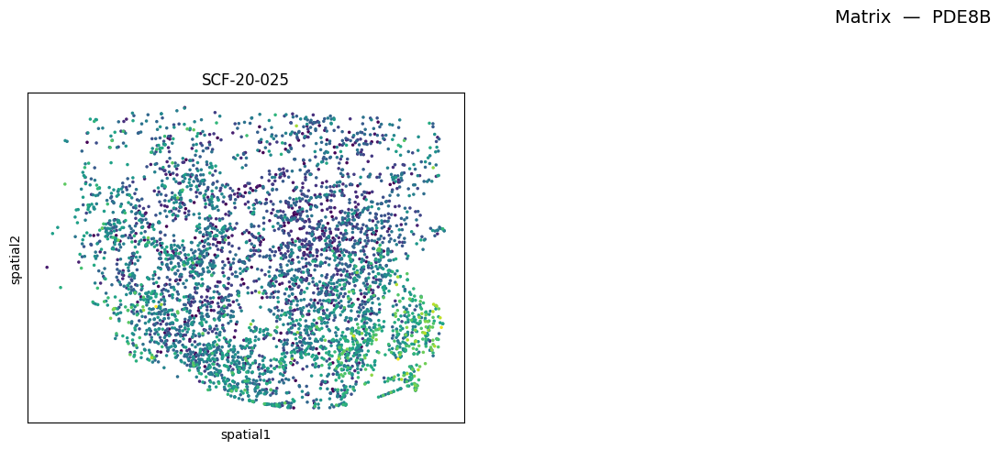

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.



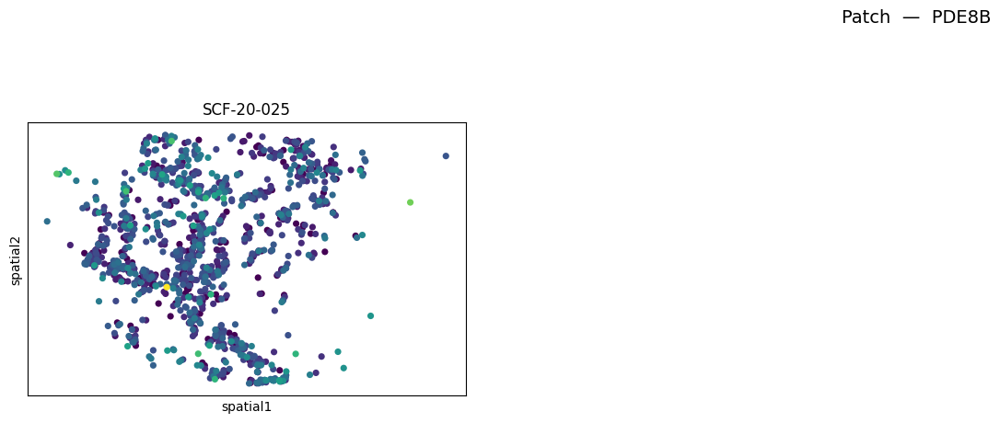

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.



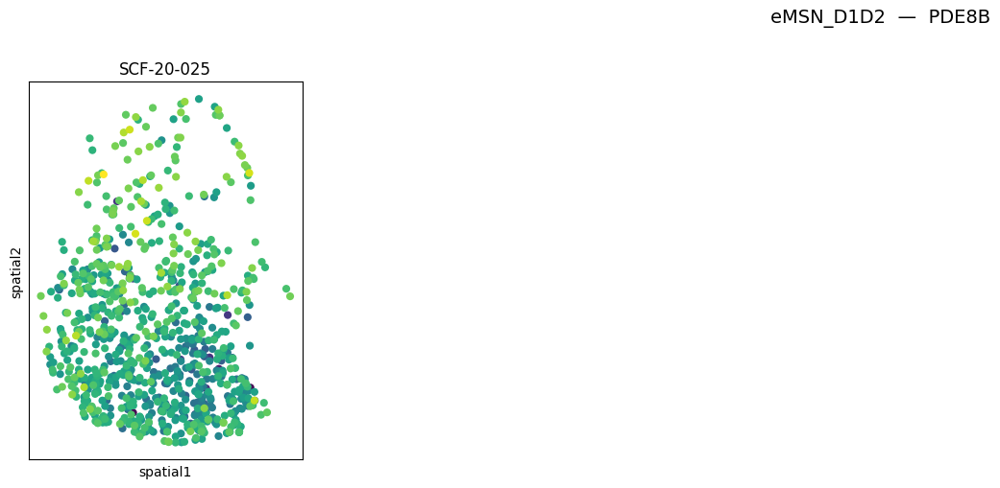

In [199]:
GENE = "PDE8B"# "GLI3" #← change this
%matplotlib inline
for a in [xdp_adata_sub]:

    donors  = a.obs["donor_id"].unique()
    ncols   = 4

    for ct in ["Matrix", "Patch", "eMSN_D1D2"]:

        adata_ct = a[a.obs["ct"] == ct].copy()
        adata_ct.X = adata_ct.layers["log1p_norm"]   # set layer for plotting

        donors_ct = adata_ct.obs["donor_id"].unique()
        nrows     = int(np.ceil(len(donors_ct) / ncols))

        fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 5 * nrows))
        axes = axes.flatten()

        # shared color scale across donors for this cell type
        vmax = adata_ct[:, GENE].X.toarray().max() if sparse.issparse(adata_ct.X) else adata_ct[:, GENE].X.max()

        for ax, s in zip(axes, donors_ct):
            sc.pl.embedding(
                adata_ct[adata_ct.obs["donor_id"] == s],
                basis="spatial",
                color=GENE,
                layer="log1p_norm",
                title=f"{s}",
                ax=ax,
                show=False,
                colorbar_loc=None,
                vmin=0,
                vmax=vmax,
            )
            ax.set_aspect("equal")

        for ax in axes[len(donors_ct):]:
            ax.set_visible(False)

        fig.suptitle(f"{ct}  —  {GENE}", fontsize=14, y=1.01)
        plt.tight_layout()
        plt.show()


# Analysis only D (XDP)

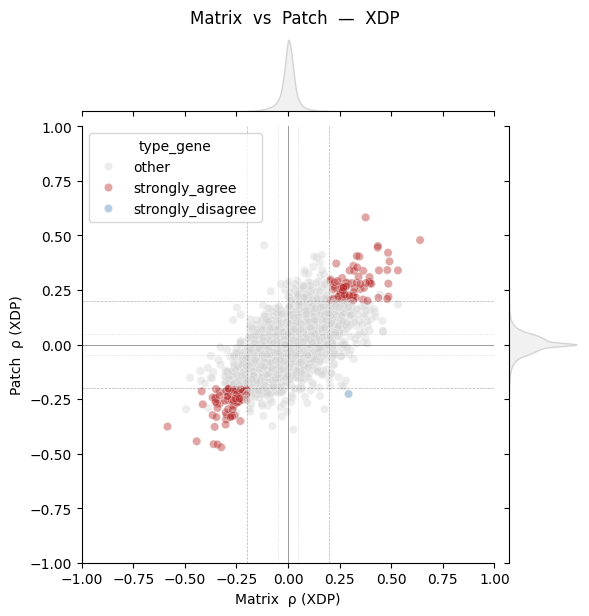

type_gene
other                33718
strongly_agree         155
strongly_disagree        1
Name: Matrix vs Patch (XDP), dtype: int64

strongly_disagree


,rho_Matrix,rho_Patch,padj_Matrix,padj_Patch,pct_expr_Matrix,pct_expr_Patch,type_gene
gene_symbol,,,,,,,
GRM1,0.293216,-0.226421,2.167886e-89,2.238766e-12,0.90357,0.848673,strongly_disagree


only_Matrix


,rho_Matrix,rho_Patch,padj_Matrix,padj_Patch,pct_expr_Matrix,pct_expr_Patch,type_gene
gene_symbol,,,,,,,


only_Patch


,rho_Matrix,rho_Patch,padj_Matrix,padj_Patch,pct_expr_Matrix,pct_expr_Patch,type_gene
gene_symbol,,,,,,,


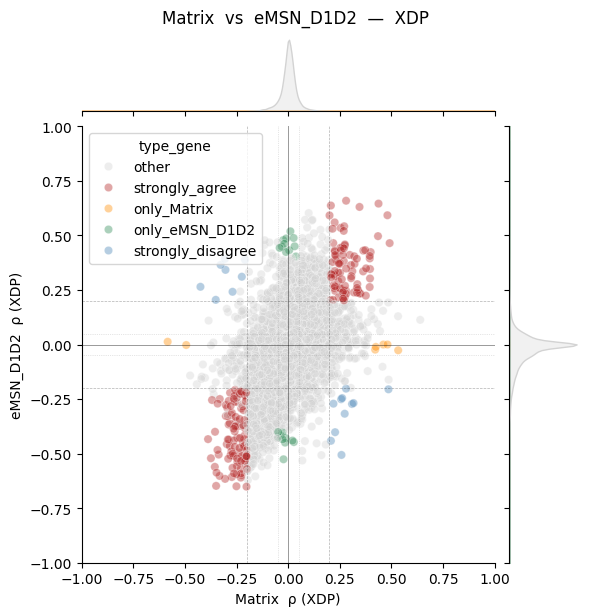

type_gene
other                33639
strongly_agree         188
only_eMSN_D1D2          21
strongly_disagree       19
only_Matrix              7
Name: Matrix vs eMSN_D1D2 (XDP), dtype: int64

strongly_disagree


,rho_Matrix,rho_eMSN,padj_Matrix,padj_eMSN,pct_expr_Matrix,pct_expr_eMSN,type_gene
gene_symbol,,,,,,,
MME,0.485813,-0.205074,3.750530e-267,1.695171e-08,0.640401,0.585928,strongly_disagree
SEMA3E,-0.425130,0.264819,7.097076e-198,6.494164e-14,0.524815,0.238754,strongly_disagree
ZNF804A,-0.351010,0.205033,1.316843e-130,1.705909e-08,0.989116,0.993080,strongly_disagree
PDE8B,-0.327356,0.365354,1.219276e-112,7.338936e-27,0.954724,0.996540,strongly_disagree
GRM3,0.316412,-0.268260,7.841310e-105,2.825081e-14,0.985633,0.527105,strongly_disagree
CHSY3,0.309185,-0.272311,7.541637e-100,1.040503e-14,0.992381,0.823529,strongly_disagree
STAC,-0.306737,0.392774,3.417032e-98,2.549947e-31,0.285372,0.652826,strongly_disagree
KCNIP1,-0.303729,0.342446,3.341256e-96,1.911204e-23,0.868960,0.993080,strongly_disagree
HTR4,0.280145,-0.202067,2.606877e-81,2.885345e-08,0.996517,0.335640,strongly_disagree


only_Matrix


,rho_Matrix,rho_eMSN,padj_Matrix,padj_eMSN,pct_expr_Matrix,pct_expr_eMSN,type_gene
gene_symbol,,,,,,,
HCN1,-0.583966,0.012993,0.000000e+00,1.000000,0.887244,0.978085,only_Matrix
ADAMTS19,0.532917,-0.026169,0.000000e+00,0.767588,0.949935,0.025375,only_Matrix
ADAMTS9-AS2,-0.494119,-0.002056,1.233304e-277,1.000000,0.483021,0.002307,only_Matrix
ITPR1,0.480972,0.000132,3.736143e-261,1.000000,0.997170,0.961938,only_Matrix
ENSG00000287912,0.460980,0.000000,4.078149e-237,1.000000,0.833043,0.000000,only_Matrix
SAMD5,0.424542,-0.010706,2.758724e-197,1.000000,0.638224,0.026528,only_Matrix
CDH6,0.421467,-0.023287,3.842382e-194,0.820027,0.719852,0.003460,only_Matrix


only_eMSN_D1D2


,rho_Matrix,rho_eMSN,padj_Matrix,padj_eMSN,pct_expr_Matrix,pct_expr_eMSN,type_gene
gene_symbol,,,,,,,
TALAM1,-0.022724,-0.525831,0.287469,4.927989e-60,0.999129,0.972318,only_eMSN_D1D2
KAZN,0.010657,0.519162,0.682788,2.644026e-58,0.998694,1.000000,only_eMSN_D1D2
SNHG14,0.026420,0.488589,0.196911,1.144161e-50,1.000000,1.000000,only_eMSN_D1D2
CADM2,-0.009814,0.486507,0.712489,3.489802e-50,1.000000,0.998847,only_eMSN_D1D2
ADARB2,-0.024027,0.478908,0.252816,2.017764e-48,0.006530,1.000000,only_eMSN_D1D2
SPECC1,-0.018901,0.462344,0.400377,9.631492e-45,0.900087,0.998847,only_eMSN_D1D2
GRIN1,0.031006,0.450529,0.112374,3.250224e-42,0.999347,0.997693,only_eMSN_D1D2
NPTX1,-0.015102,-0.449468,0.525467,5.329009e-42,0.407923,0.787774,only_eMSN_D1D2
SLC2A13,-0.030321,0.448718,0.122757,7.638476e-42,0.996953,0.994233,only_eMSN_D1D2


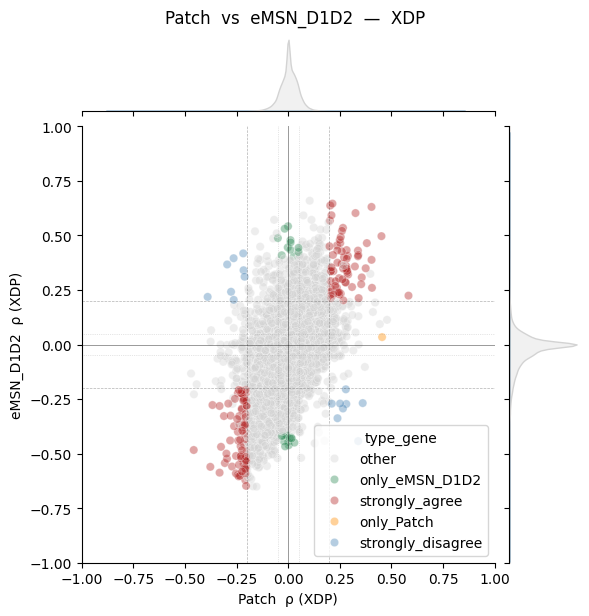

type_gene
other                33693
strongly_agree         141
only_eMSN_D1D2          23
strongly_disagree       16
only_Patch               1
Name: Patch vs eMSN_D1D2 (XDP), dtype: int64

strongly_disagree


,rho_Patch,rho_eMSN,padj_Patch,padj_eMSN,pct_expr_Patch,pct_expr_eMSN,type_gene
gene_symbol,,,,,,,
ENSG00000228566,-0.390189,0.218604,4.486735e-39,1.400224e-09,0.869027,0.993080,strongly_disagree
GRM3,0.361063,-0.268260,5.633683e-33,2.825081e-14,0.988496,0.527105,strongly_disagree
SPATS2L,0.339300,-0.442506,7.623521e-29,1.378904e-40,0.528319,0.726644,strongly_disagree
DLGAP1,-0.295676,0.367217,1.726148e-21,3.782999e-27,1.000000,0.997693,strongly_disagree
CHSY3,0.281521,-0.272311,2.105758e-19,1.040503e-14,0.984071,0.823529,strongly_disagree
MME,0.279269,-0.205074,4.277011e-19,1.695171e-08,0.966372,0.585928,strongly_disagree
CELF4,-0.276853,0.241923,9.167354e-19,1.194779e-11,0.999115,0.995386,strongly_disagree
LINC03051,0.265379,-0.292980,3.465138e-17,4.917870e-17,0.999115,0.996540,strongly_disagree
SGCZ,-0.264394,0.395832,4.730313e-17,7.608669e-32,0.927434,0.579008,strongly_disagree


only_Patch


,rho_Patch,rho_eMSN,padj_Patch,padj_eMSN,pct_expr_Patch,pct_expr_eMSN,type_gene
gene_symbol,,,,,,,
BACH2,0.454897,0.034229,4.779496e-55,0.619284,0.631858,0.968858,only_Patch


only_eMSN_D1D2


,rho_Patch,rho_eMSN,padj_Patch,padj_eMSN,pct_expr_Patch,pct_expr_eMSN,type_gene
gene_symbol,,,,,,,
OPCML,-0.000708,0.542309,1.000000,1.499324e-64,0.961062,1.000000,only_eMSN_D1D2
SYNDIG1,-0.017070,0.531040,0.892829,2.004826e-61,0.851327,0.776240,only_eMSN_D1D2
DAB2IP,-0.049941,0.488238,0.389538,1.377051e-50,0.868142,0.626298,only_eMSN_D1D2
ADARB2,0.011049,0.478908,0.978958,2.017764e-48,0.015044,1.000000,only_eMSN_D1D2
KIAA1217,0.011730,0.468444,0.969124,4.642041e-46,0.899115,0.801615,only_eMSN_D1D2
STMN1,-0.014868,-0.466570,0.925917,1.199842e-45,0.236283,0.712803,only_eMSN_D1D2
ADGRB3-DT,0.002277,-0.461400,1.000000,1.547512e-44,0.900000,0.806228,only_eMSN_D1D2
NPTX1,0.030031,-0.449468,0.690027,5.329009e-42,0.704425,0.787774,only_eMSN_D1D2
CCND2,0.000372,-0.446853,1.000000,1.834918e-41,0.816814,0.217993,only_eMSN_D1D2


In [12]:
THRESHOLD          = 0.2    # minimum |rho| to count as "has gradient"
THRESHOLD_SPECIFIC = 0.4    # minimum |rho| to count as "cell-type specific"
THRESHOLD_ONLY     = 0.05   # maximum |rho| to count as "truly absent"
PADJ_THR           = 0.05
MIN_PCT_EXPR       = 0.20

# df_corr_xdp columns use "eMSN", not "eMSN_D1D2" — same remap as the healthy version
col_label = {"Matrix": "Matrix", "Patch": "Patch", "eMSN_D1D2": "eMSN"}

from itertools import combinations
for ct_x, ct_y in combinations(["Matrix", "Patch", "eMSN_D1D2"], 2):

    lx, ly = col_label[ct_x], col_label[ct_y]
    rho_cx,   rho_cy   = f"rho_{lx}",      f"rho_{ly}"
    padj_cx,  padj_cy  = f"padj_{lx}",     f"padj_{ly}"
    pexpr_cx, pexpr_cy = f"pct_expr_{lx}", f"pct_expr_{ly}"

    df = df_corr_xdp[[rho_cx, rho_cy, padj_cx, padj_cy, pexpr_cx, pexpr_cy]] \
            .dropna(subset=[rho_cx, rho_cy])

    x, y   = df[rho_cx], df[rho_cy]
    sig_x  = df[padj_cx] < PADJ_THR
    sig_y  = df[padj_cy] < PADJ_THR
    expr_x = df[pexpr_cx] >= MIN_PCT_EXPR
    expr_y = df[pexpr_cy] >= MIN_PCT_EXPR

    has_x  = (x.abs() >= THRESHOLD) & sig_x & expr_x
    has_y  = (y.abs() >= THRESHOLD) & sig_y & expr_y
    flat_x = x.abs() < THRESHOLD_ONLY
    flat_y = y.abs() < THRESHOLD_ONLY

    both_strong       = has_x & has_y
    strongly_agree    = both_strong & (np.sign(x) == np.sign(y))
    strongly_disagree = both_strong & (np.sign(x) != np.sign(y))
    only_x            = (x.abs() >= THRESHOLD_SPECIFIC) & sig_x & expr_x & flat_y
    only_y            = (y.abs() >= THRESHOLD_SPECIFIC) & sig_y & expr_y & flat_x

    df["type_gene"] = "other"
    df.loc[strongly_agree,    "type_gene"] = "strongly_agree"
    df.loc[strongly_disagree, "type_gene"] = "strongly_disagree"
    df.loc[only_x,            "type_gene"] = f"only_{ct_x}"
    df.loc[only_y,            "type_gene"] = f"only_{ct_y}"

    palette = {
        "strongly_agree":    "firebrick",
        "strongly_disagree": "steelblue",
        f"only_{ct_x}":      "darkorange",
        f"only_{ct_y}":      "seagreen",
        "other":             "lightgray",
    }

    g = sns.jointplot(
        data=df, x=rho_cx, y=rho_cy,
        hue="type_gene", palette=palette,
        alpha=0.4, height=6,
        marginal_kws=dict(fill=True, alpha=0.3),
        ylim=(-1, 1), xlim=(-1, 1)
    )
    for val in [-THRESHOLD, THRESHOLD]:
        g.ax_joint.axhline(val, color="k",    lw=0.5, ls="--", alpha=0.3)
        g.ax_joint.axvline(val, color="k",    lw=0.5, ls="--", alpha=0.3)
    for val in [-THRESHOLD_ONLY, THRESHOLD_ONLY]:
        g.ax_joint.axhline(val, color="gray", lw=0.5, ls=":",  alpha=0.4)
        g.ax_joint.axvline(val, color="gray", lw=0.5, ls=":",  alpha=0.4)
    g.ax_joint.axhline(0, color="k", lw=0.7, alpha=0.4)
    g.ax_joint.axvline(0, color="k", lw=0.7, alpha=0.4)
    g.ax_joint.set_xlabel(f"{ct_x}  ρ (XDP)")
    g.ax_joint.set_ylabel(f"{ct_y}  ρ (XDP)")
    g.figure.suptitle(f"{ct_x}  vs  {ct_y}  —  XDP", y=1.02, fontsize=12)
    plt.show()

    display(df["type_gene"].value_counts().rename(f"{ct_x} vs {ct_y} (XDP)"))
    print("strongly_disagree")
    display(df[df["type_gene"] == "strongly_disagree"]
              .sort_values([rho_cx, rho_cy], key=np.abs, ascending=False))
    print(f"only_{ct_x}")
    display(df[df["type_gene"] == f"only_{ct_x}"]
              .sort_values(rho_cx, key=np.abs, ascending=False))
    print(f"only_{ct_y}")
    display(df[df["type_gene"] == f"only_{ct_y}"]
              .sort_values(rho_cy, key=np.abs, ascending=False))


# Prioritization score

Risk score = min(evM, evP) - |evE|  (strongest when M & P agree and eMSN is flat)


ENSG00000287923    0.105599
ENSG00000286780    0.104669
TESPA1             0.090953
PLCB1              0.090939
LARGE1             0.090351
PLEKHA7            0.087496
VLDLR-AS1          0.082974
PDE10A             0.080342
ENSG00000289156    0.069048
LDLRAD4            0.067703
SRGAP1             0.067278
YARS1              0.063552
ONECUT2            0.063097
RYR3               0.062406
OPCML              0.062286
ST3GAL6            0.061434
RIC8B              0.061011
PCSK6              0.060770
SMPD3              0.059398
SAMD5              0.059223
PRKCB              0.059172
RARB               0.057728
SPOCK1             0.056986
STRN               0.055649
CACNA2D3           0.054641
AFF3               0.053948
TRPC6              0.053622
DPP6               0.053080
EFR3B              0.053013
COL25A1            0.052749
dtype: float64

Change score (for Patch) = (rho_XDP - rho_health) * confidence * expression_weight  (strongest when the gradient flips sign)


,change_score,reversal,rho_Patch_health,rho_Patch_xdp
MT-ATP6,0.316982,0.000000,0.021331,0.403869
MT-ND3,0.261578,0.000000,0.003911,0.375491
FAM163A,-0.240497,0.000000,-0.211858,-0.457629
PDE10A,-0.211765,0.000000,0.663536,0.451771
LSAMP,0.204527,0.000000,0.074117,0.371503
BACH2,0.187326,0.000000,0.267570,0.454897
SEMA5B,0.177789,0.000000,0.203511,0.410488
SPATS2L,0.156435,0.000000,0.061123,0.339300
STRIP2,0.149025,0.000000,0.227876,0.405846
SLC24A2,0.148526,0.000000,0.330327,0.478853


Vulnerability change score = (|ΔM| + |ΔP|) - |ΔeMSN|  (which genes change in the vulnerable compartments while staying put in the spared one.)


PDE8B              0.732947
GRIN2A             0.616193
LSAMP              0.553700
ENSG00000259336    0.516069
RAPGEF5            0.503265
RALYL              0.469438
PDE10A             0.438235
OPCML              0.422907
UNC80              0.422437
EPB41              0.421472
PLEKHA7            0.420381
ENSG00000287912    0.414451
SRGAP1             0.377195
PLCB1              0.359726
PSD3               0.359256
ERC2               0.359131
GPRIN3             0.357208
CDH12              0.354774
ARHGAP6            0.351025
GPC5               0.350163
ROBO1              0.349751
CYP4F29P           0.348733
ENSG00000255227    0.347411
DDO                0.346188
ANKRD20A11P        0.341046
GDA                0.340669
CNTN3              0.340573
ABLIM1             0.335597
PRKG1              0.332606
SCARB1             0.324547
dtype: float64

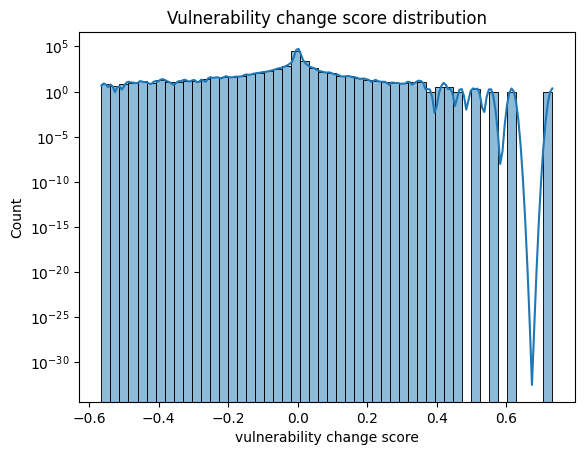

In [26]:
import numpy as np, pandas as pd

# --- significance as a SATURATING gate in [0,1], not an unbounded multiplier ---
def confidence(padj, cap=50.0):
    """cap = the -log10(padj) beyond which extra significance stops mattering."""
    padj = padj.fillna(1.0).clip(lower=1e-300, upper=1.0)   # upper=1 so padj>1 can't flip the sign
    return (-np.log10(padj) / cap).clip(upper=1.0)

def soft_expr_weight(pct_expr, midpoint=0.2, steepness=40):
    return 1.0 / (1.0 + np.exp(-steepness * (pct_expr.fillna(0.0) - midpoint)))

def signed_evidence(rho, padj, pct_expr):
    """Signed effect size, gated by (capped) significance and expression. Stays ~[-1,1]."""
    return rho.fillna(0.0) * confidence(padj) * soft_expr_weight(pct_expr)

# ===== Example 1: risk-factor pattern in healthy data (dorsal-high M & P, flat eMSN) =====
evM = signed_evidence(df_corr["rho_Matrix"], df_corr["padj_Matrix"], df_corr["pct_expr_Matrix"])
evP = signed_evidence(df_corr["rho_Patch"],  df_corr["padj_Patch"],  df_corr["pct_expr_Patch"])
evE = signed_evidence(df_corr["rho_eMSN"],   df_corr["padj_eMSN"],   df_corr["pct_expr_eMSN"])

# min(M,P) forces BOTH compartments to carry the signal (a sum lets one alone win);
# subtract |eMSN| to penalise any eMSN gradient ("flat in eMSN").
risk_score = np.minimum(evM, evP) - evE.abs()
print("Risk score = min(evM, evP) - |evE|  (strongest when M & P agree and eMSN is flat)")
display(risk_score.sort_values(ascending=False).head(30))

# ===== Example 2: health -> XDP change in one cell type, effect-size-led =====
CT = "Patch"                                   # "Matrix" / "Patch" / "eMSN"
g = df_corr.index.intersection(df_corr_xdp.index)

rho_h = df_corr.loc[g,     f"rho_{CT}"].fillna(0.0)
rho_x = df_corr_xdp.loc[g, f"rho_{CT}"].fillna(0.0)

d_rho     = rho_x - rho_h                       # the signal is the effect-size shift
conf_gate = np.maximum(confidence(df_corr.loc[g, f"padj_{CT}"]),      # credible in EITHER condition
                       confidence(df_corr_xdp.loc[g, f"padj_{CT}"]))
expr_gate = np.minimum(soft_expr_weight(df_corr.loc[g, f"pct_expr_{CT}"]),
                       soft_expr_weight(df_corr_xdp.loc[g, f"pct_expr_{CT}"]))

change_score = d_rho * conf_gate * expr_gate
reversal     = np.maximum(0.0, -(rho_h * rho_x))   # >0 only when the gradient flips sign

out = pd.DataFrame({"change_score": change_score, "reversal": reversal,
                    f"rho_{CT}_health": rho_h, f"rho_{CT}_xdp": rho_x})
print(f"Change score (for {CT}) = (rho_XDP - rho_health) * confidence * expression_weight  (strongest when the gradient flips sign)")
display(out.reindex(change_score.abs().sort_values(ascending=False).index).head(30))

# ===== vulnerability-specific change: M & P move, eMSN as REFERENCE (not a 3rd axis) =====
def ct_change(ct):
    h = df_corr.loc[g, f"rho_{ct}"].fillna(0.0); x = df_corr_xdp.loc[g, f"rho_{ct}"].fillna(0.0)
    cg = np.maximum(confidence(df_corr.loc[g, f"padj_{ct}"]), confidence(df_corr_xdp.loc[g, f"padj_{ct}"]))
    eg = np.minimum(soft_expr_weight(df_corr.loc[g, f"pct_expr_{ct}"]),
                    soft_expr_weight(df_corr_xdp.loc[g, f"pct_expr_{ct}"]))
    return (x - h) * cg * eg

chg = {ct: ct_change(ct) for ct in ["Matrix", "Patch", "eMSN"]}
vuln_change = (chg["Matrix"].abs() + chg["Patch"].abs()) - chg["eMSN"].abs()
print("Vulnerability change score = (|ΔM| + |ΔP|) - |ΔeMSN|  (which genes change in the vulnerable compartments while staying put in the spared one.)")
display(vuln_change.sort_values(ascending=False).head(30))
sns.histplot(vuln_change, bins=50, kde=True); plt.title("Vulnerability change score distribution"); plt.xlabel("vulnerability change score"); plt.yscale("log"); plt.show()


In [46]:
import gseapy as gp
import numpy as np

# gseapy wants a clean 2-column table: gene name, ranking metric — no NaN/inf,
# no duplicate gene names, sorted descending (classic .rnk format).
rnk = (
    vuln_change
    .replace([np.inf, -np.inf], np.nan)
    .dropna()
    .sort_values(ascending=False)
)
rnk = rnk[~rnk.index.duplicated(keep="first")]   # gseapy can misbehave on duplicate gene names
rnk = rnk.reset_index()
rnk.columns = ["gene_name", "score"]

# apply after the rnk cleanup from before (rnk = gene_name, score, deduped, sorted)
is_ensembl = rnk["gene_name"].str.match(r"^ENSG\d+$")
is_mito    = rnk["gene_name"].str.startswith("MT-")
is_ribo    = rnk["gene_name"].str.match(r"^RP[SL]\d")
is_tech    = rnk["gene_name"].isin(["MALAT1", "NEAT1"])
# only include this if health/XDP donors aren't sex-matched
is_sexlinked = rnk["gene_name"].isin(["XIST", "RPS4Y1", "DDX3Y", "KDM5D", "UTY", "EIF1AY"])
drop = is_ensembl | is_mito | is_ribo | is_tech   # | is_sexlinked
print(f"dropping {drop.sum()} / {len(rnk)} entries: "
      f"{rnk.loc[drop, 'gene_name'].tolist()[:20]}...")
rnk_clean = rnk[~drop].reset_index(drop=True)


pre_res = gp.prerank(
    rnk=rnk_clean,
    gene_sets="Reactome_Pathways_2024", #KEGG_2021_Human, GO_Biological_Process_2023, Reactome_Pathways_2024
    min_size=15,
    max_size=200,
    permutation_num=500,
    seed=0,
    outdir=None,
)

pre_res.res2d.sort_values("NES", ascending=False).head(20)


dropping 10809 / 33610 entries: ['ENSG00000259336', 'ENSG00000287912', 'ENSG00000255227', 'ENSG00000290581', 'ENSG00000255029', 'MT-ND3', 'ENSG00000288540', 'ENSG00000285634', 'MT-ATP6', 'ENSG00000289156', 'ENSG00000285971', 'ENSG00000240086', 'ENSG00000227681', 'ENSG00000269825', 'ENSG00000285940', 'ENSG00000286853', 'ENSG00000287976', 'ENSG00000251244', 'ENSG00000289201', 'ENSG00000236358']...


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,Olfactory Signaling Pathway,0.83847,1.92399,0.0,0.0,0.0,3/194,4.27%,ANO2;GNB1;EBF1
1,prerank,Expression and Translocation of Olfactory Rece...,0.771034,1.777092,0.0,0.000629,0.002,8/188,21.64%,EBF1;REEP1;OR2L3;OR2L5;OR2L2;OR1F1;OR3A2;OR6A2
6,prerank,Collagen Formation,0.779201,1.591263,0.0,0.12202,0.28,12/88,6.60%,COL25A1;CTSV;ADAMTS3;COL24A1;COL19A1;DST;CTSB;...
7,prerank,Collagen Biosynthesis and Modifying Enzymes,0.818287,1.587411,0.006061,0.099063,0.3,8/67,6.60%,COL25A1;ADAMTS3;COL24A1;COL19A1;COL26A1;COL11A...
19,prerank,O-glycosylation of TSR Domain-Containing Proteins,0.886943,1.563283,0.0,0.143657,0.478,11/38,6.40%,ADAMTSL1;ADAMTS19;SEMA5B;ADAMTS3;SPON1;ADAMTS1...
25,prerank,Collagen Chain Trimerization,0.881243,1.553407,0.0,0.147179,0.556,5/44,5.13%,COL25A1;COL24A1;COL19A1;COL26A1;COL11A1
26,prerank,Defective B3GALTL Causes PpS,0.886764,1.55012,0.0,0.135498,0.578,9/37,4.93%,ADAMTSL1;ADAMTS19;SEMA5B;ADAMTS3;SPON1;ADAMTS1...
50,prerank,Eicosanoid Ligand-Binding Receptors,0.938325,1.491579,0.014085,0.373451,0.928,1/15,4.63%,PTGDR
54,prerank,Class C 3 (Metabotropic Glutamate Pheromone Re...,0.851649,1.488031,0.024038,0.352783,0.936,6/35,4.20%,GRM5;GRM8;GRM3;GRM1;GABBR2;GRM7
55,prerank,TNFs Bind Their Physiological Receptors,0.865526,1.487803,0.014218,0.318637,0.936,3/27,9.71%,EDA;TNFRSF8;TNFRSF25


# òò

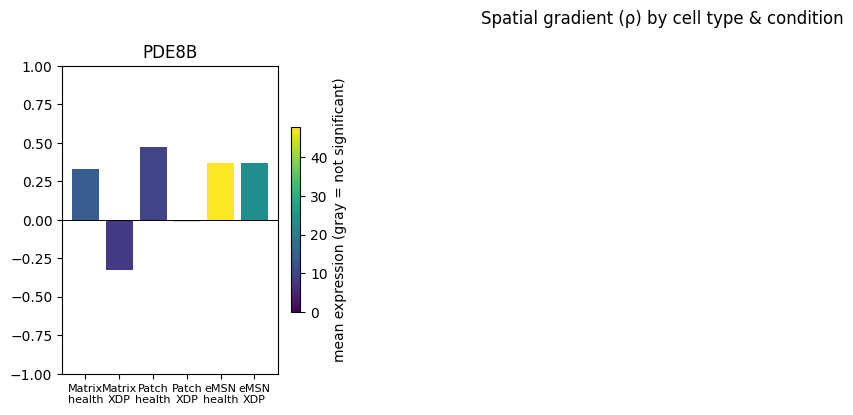

In [18]:
GENES    = ["PDE8B"] #["GRIN2A", "UNC80", "PDE8B", "ELL2"]   # ← change this
PADJ_THR = 0.05

cts        = ["Matrix", "Patch", "eMSN"]
conditions = [("health", df_corr), ("XDP", df_corr_xdp)]

def gene_bar_df(gene):
    rows = []
    for ct in cts:
        for cond_name, cond_df in conditions:
            rows.append({
                "ct":        ct,
                "condition": cond_name,
                "rho":       cond_df.loc[gene, f"rho_{ct}"],
                "padj":      cond_df.loc[gene, f"padj_{ct}"],
                "mean_expr": cond_df.loc[gene, f"mean_expr_{ct}"],
            })
    df_gene = pd.DataFrame(rows)
    df_gene["label"] = df_gene["ct"] + "\n" + df_gene["condition"]
    return df_gene

# shared color scale across ALL genes so colors are comparable gene-to-gene, not just bar-to-bar
all_mean_expr = pd.concat([gene_bar_df(g)["mean_expr"] for g in GENES])
norm = plt.Normalize(vmin=0, vmax=all_mean_expr.max())

ncols = 4
nrows = int(np.ceil(len(GENES) / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(4 * ncols, 4 * nrows), squeeze=False, sharey=True)
axes = axes.flatten()

for ax, gene in zip(axes, GENES):
    df_gene = gene_bar_df(gene)
    colors = [
        "lightgray" if padj >= PADJ_THR else plt.cm.viridis(norm(mean_expr))
        for padj, mean_expr in zip(df_gene["padj"], df_gene["mean_expr"])
    ]
    ax.bar(df_gene["label"], df_gene["rho"], color=colors)
    ax.axhline(0, color="k", lw=0.7)
    ax.set_ylim(-1, 1)
    ax.set_title(gene)
    ax.tick_params(axis="x", labelsize=8)

# hide unused axes if GENES doesn't fill the grid
for ax in axes[len(GENES):]:
    ax.set_visible(False)

sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
sm.set_array([])
fig.colorbar(sm, ax=axes[:len(GENES)], label="mean expression (gray = not significant)", shrink=0.6)
fig.suptitle("Spatial gradient (ρ) by cell type & condition", y=1.02)
plt.show()
